<a href="https://colab.research.google.com/github/Yuanranzhu/SINN/blob/main/FPU_chain_SINN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!hostname

gnode014.cluster


In [2]:
!nvidia-smi

Mon Feb 19 11:25:07 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.23.08              Driver Version: 545.23.08    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA H100 PCIe               Off | 00000000:A8:00.0 Off |                    0 |
| N/A   27C    P0              47W / 350W |      4MiB / 81559MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [3]:
import itertools as it
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
import torch.fft
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sdeint
from toolbox import (
    make_loss,
    StatLoss,
    SINN,
    FPU
)
import time

In [4]:
torch.cuda.is_available()

True

In [5]:
device = torch.device('cuda')

In [6]:
print(torch.__version__)
print(torch.version.cuda)

2.0.1+cu118
11.8


In [7]:
seed = 1234
torch.set_default_dtype(torch.float)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

In [8]:
%%time

######### Generating SINN training data by solving SDE
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.integrate import quad



###### Parameters 
mag=1              # Magnitude of the coupling
beta=1             # Inverse temperature 
alpha=1            
gamma=1            # Anharmonic potential U(x)=alpha/2* x^2  + gamma/4* x^4
N=100              # Total number of oscillators in the chain 
N_mid=int(N/2)     # Coordinate of the center CG-oscillator 
dt=0.01 
delta_t=0.5
batch = 400
sec_length = 400

Time = 5*delta_t*sec_length
print(Time)
length=int(Time/dt)+1
t = np.linspace(0,Time,length) # define time axis
gap=int(delta_t/dt)
t_store=t[0:-1:gap]



# (q49,q50)
q49_store = np.zeros([t_store.size+1,batch])    
q50_store = np.zeros([t_store.size+1,batch])

q=np.zeros((1,length)) 

p1=np.zeros((N,batch))
q1=np.zeros((N,batch))
p0=np.zeros((N,batch))
q0=np.zeros((N,batch))

# solve SDE

j=1
for i in range(1,length):
    q1=q0+dt*(p0-np.roll(p0,1,axis=0))
    p1=(1-mag*dt)*p0+dt*alpha*(np.roll(q0,-1,axis=0)-q0)+dt*gamma*(np.roll(q0,-1,axis=0)**3-q0**3)+np.sqrt(2*dt*gamma/beta)*np.random.randn(N,batch)
    if i % gap ==0:        
        q49_store[j,:]= np.sum(q1[0:N_mid-1,:], axis=0)
        q50_store[j,:]= np.sum(q1[0:N_mid,:], axis=0)
        j=j+1
    p0=p1
    q0=q1
                                
Toss=int(t_store.size/4)
q49_store=q49_store[Toss:-1,:] 
q50_store=q50_store[Toss:-1,:] 

1000.0
CPU times: user 9min 8s, sys: 14.8 ms, total: 9min 8s
Wall time: 9min 9s


Text(0.5, 1.0, 'Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$')

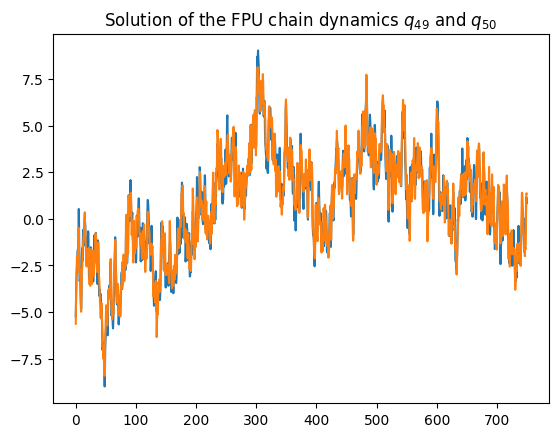

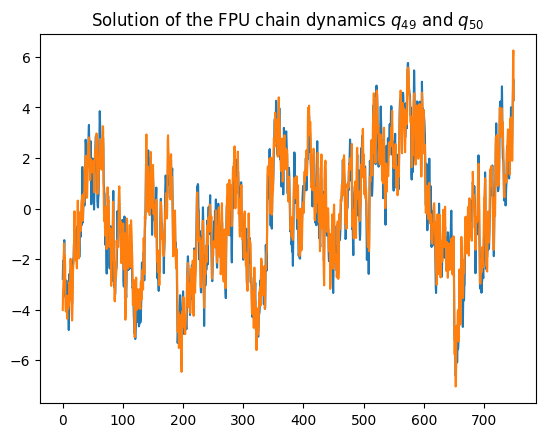

In [9]:
plt.figure(0)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

plt.figure(1)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,1])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,1])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

(400, 400) (400, 400) (400, 400)
(400, 400) (400, 400, 2)


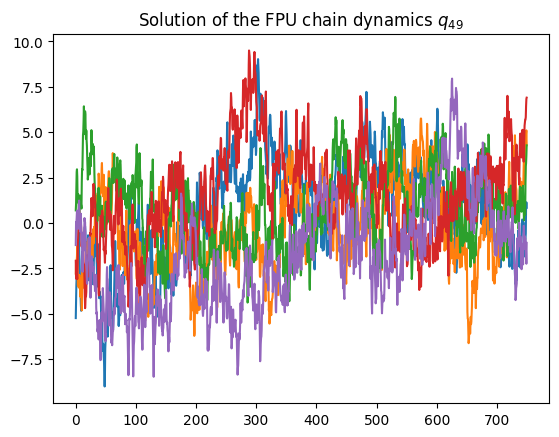

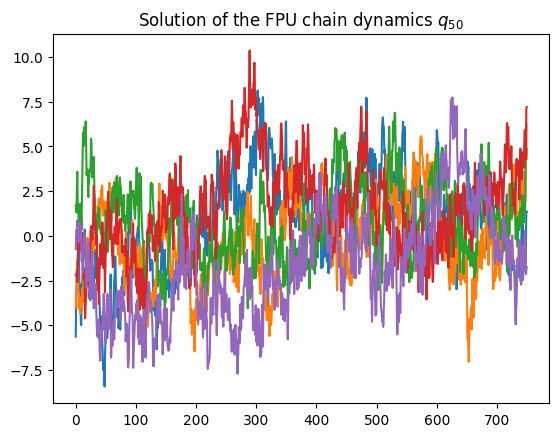

In [10]:
plt.figure(0)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$")

plt.figure(1)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{50}$")

###########################################   Construct the sample traj for the LSTM learning 
ini=np.random.randn(sec_length,batch)
Traj49 = q49_store[0:sec_length,:]
Traj50 = q50_store[0:sec_length,:]
print(ini.shape, Traj49.shape, Traj50.shape)

Traj = np.empty((sec_length,batch,2))
Traj[:,:,0] = Traj49
Traj[:,:,1] = Traj50
T=np.arange(len(Traj[:,1]))*delta_t
x=np.linspace(-5,5,sec_length)
print(ini.shape, Traj.shape)

In [11]:
# Reformulating data into Torch tensors 
# Input of SINN should be of the form (seq_len, batch, input_size)

ini = np.random.randn(2*sec_length,2*batch).astype(np.float32) 
input = torch.from_numpy(ini.reshape(2*sec_length, batch, 2)).to(device)
batch_validation = batch
val_set = torch.normal(0.0, 1.0, (2*sec_length, batch_validation, 2), device=device)


Traj = Traj.astype(np.float32) 
target = torch.from_numpy(Traj.reshape(sec_length, batch, 2)).to(device)
print('The torch input size is', input.size(), input.dtype)
print('The torch validation size is', val_set.size(), val_set.dtype)
print('The torch target size is', target.size(), target.dtype)

The torch input size is torch.Size([800, 400, 2]) torch.float32
The torch validation size is torch.Size([800, 400, 2]) torch.float32
The torch target size is torch.Size([400, 400, 2]) torch.float32


In [12]:
# Defining Loss functions
LAGS = 400
N = 400
loss_acf_fft = make_loss('acf[fft]', target, lags=LAGS, device=device)
loss_acf_sec_moment = make_loss('acf[fft]', target**2, lags=LAGS, device=device)
loss_acf_bruteforce = make_loss('acf[bruteforce]', target, lags=LAGS, device=device)
loss_acf_randbrute = make_loss('acf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_ccf_fft = make_loss('ccf[fft]', target, lags=LAGS, device=device)
loss_ccf_sec_moment = make_loss('ccf[fft]', target**2, lags=LAGS, device=device)
loss_ccf_bruteforce = make_loss('ccf[bruteforce]', target, lags=LAGS, device=device)
loss_ccf_randbrute = make_loss('ccf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_pdf_empirical1 = make_loss('pdf', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2 = make_loss('pdf6', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2D = make_loss('pdf2D', target, lower=-5, upper=5, n=N, bw=None, device=device)

torch.Size([400, 2])


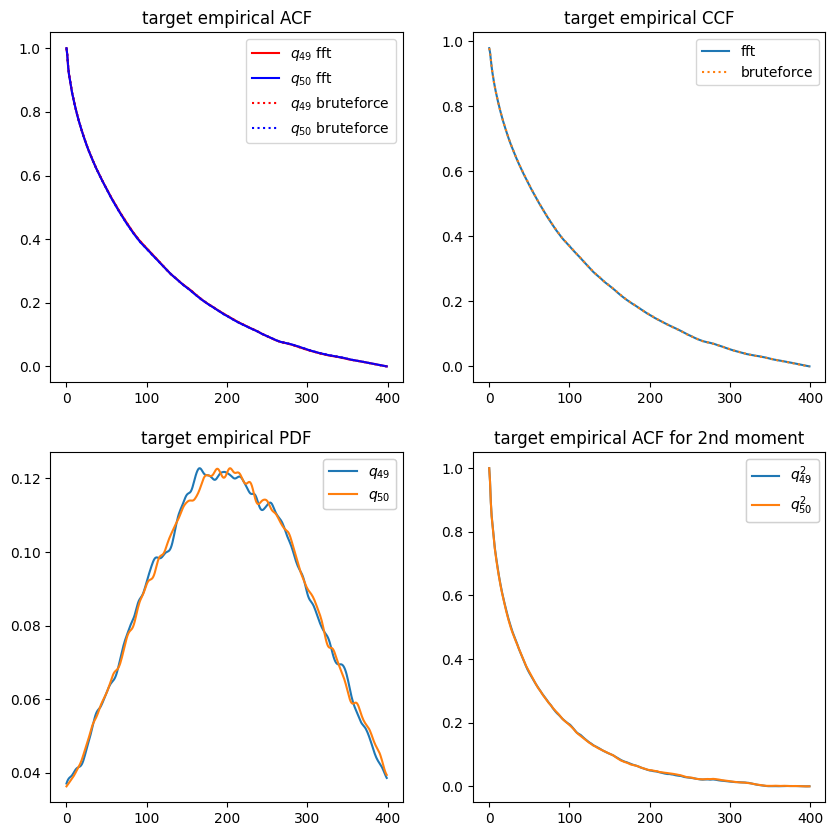

In [13]:
# Plotting target ACFs and PDF
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs[0,0].plot(loss_acf_fft._target.cpu()[...,0],'r', label=r'$q_{49}$ fft')
axs[0,0].plot(loss_acf_fft._target.cpu()[...,1],'b', label=r'$q_{50}$ fft')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,0],'r:', label= r'$q_{49}$ bruteforce')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,1], 'b:', label=r'$q_{50}$ bruteforce')
axs[0,0].legend()
axs[0,0].set_title('target empirical ACF')

axs[0,1].plot(loss_ccf_fft._target.cpu()[...,1:3], label='fft')
axs[0,1].plot(loss_ccf_bruteforce._target.cpu()[...,1:3],':',label='bruteforce')
# legend2 = axs[0,1].legend(iter(bf), ('q bf', 'p bf'), loc=1)
# axs[0,1].add_artist(legend2)
axs[0,1].legend()
axs[0,1].set_title('target empirical CCF')

x_grid=-np.linspace(-5,5,num=sec_length)
pdf = axs[1,0].plot(loss_pdf_empirical1._target.cpu())
legend3 = axs[1,0].legend(iter(pdf), (r'$q_{49}$',r'$q_{50}$'), loc=1)
axs[1,0].add_artist(legend3)
axs[1,0].set_title('target empirical PDF')


print(loss_acf_sec_moment._target.cpu().size())
sec_moment = axs[1,1].plot(loss_acf_sec_moment._target.cpu())
legend4 = axs[1,1].legend(iter(sec_moment), (r'$q_{49}^2$',r'$q_{50}^2$'),loc=1)
axs[1,1].set_title('target empirical ACF for 2nd moment')
axs[1,1].add_artist(legend4)

plt.show()

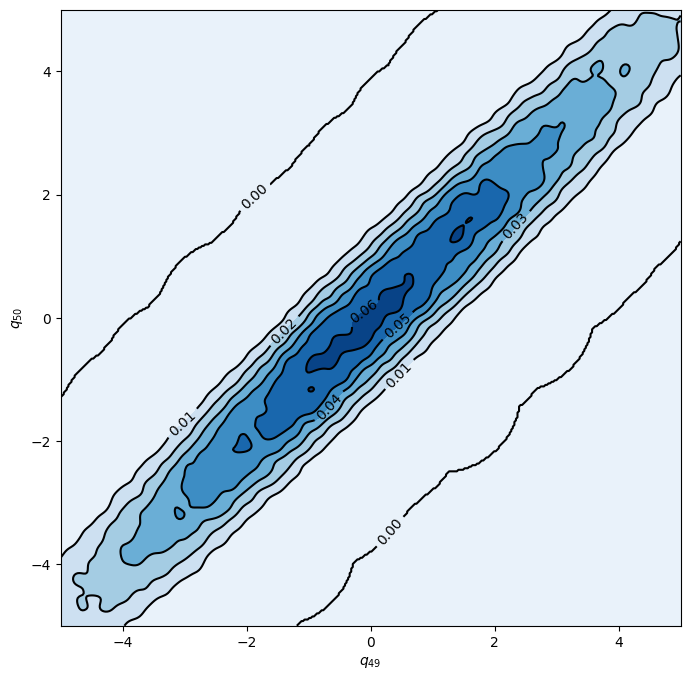

In [14]:
xmin, xmax = -5, 5
ymin, ymax = -5, 5

xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Contourf plot
cfset = ax.contourf(xx, yy, loss_pdf_empirical2D._target.cpu(), cmap='Blues')
## Or kernel density estimate plot instead of the contourf plot

# Contour plot
cset = ax.contour(xx, yy, loss_pdf_empirical2D._target.cpu(), colors='k')
# Label plot
ax.clabel(cset, inline=1, fontsize=10)
ax.set_xlabel(r'$q_{49}$')
ax.set_ylabel(r'$q_{50}$')

plt.show()

Text(0.5, 1.0, 'target empirical PDF')

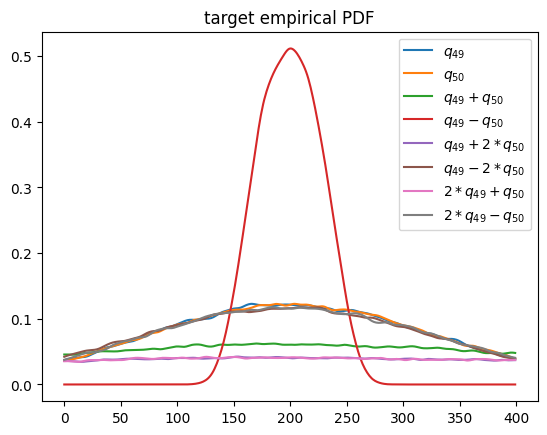

In [15]:
x_grid=-np.linspace(-5,5,num=sec_length)
plt.plot(loss_pdf_empirical1._target.cpu()[...,0],label=r'$q_{49}$')
plt.plot(loss_pdf_empirical1._target.cpu()[...,1],label=r'$q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,0],label=r'$q_{49}+q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,1],label=r'$q_{49}-q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,2],label=r'$q_{49}+2*q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,3],label=r'$q_{49}-2*q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,4],label=r'$2*q_{49}+q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,5],label=r'$2*q_{49}-q_{50}$')
plt.legend()
plt.title('target empirical PDF')

In [16]:
class Model:
    def __init__(self, net):

        self.x_acf_s = None
        self.x_ccf_s = None
        self.x_pdf_s = None
        self.x_pdf2_s = None
        self.x_acf2_s = None
        self.s_collect = []

        self.net = net

        self.T_error=[]
        self.V_error=[]
        self.T_ccf=[]
        self.V_ccf=[]
        self.T_pdf=[]
        self.V_pdf=[]
        self.T_pdf2=[]
        self.V_pdf2=[]
        self.T_acf=[]
        self.V_acf=[]
        self.T_acf2=[]
        self.V_acf2=[]
        self.Step=[]
        self.iter = 0
        self.time = 0

    def train_U(self, x):
        return self.net(x)

    def predict_U(self, x):
        return self.train_U(x)

    def likelihood_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        loss = torch.reciprocal(2. * self.x_acf_s ** 2) * loss_acf.detach()      \
               + torch.reciprocal(2. * self.x_ccf_s ** 2) * loss_ccf.detach()    \
               + torch.reciprocal(2. * self.x_pdf_s ** 2) * loss_pdf.detach()    \
               + torch.reciprocal(2. * self.x_pdf2_s ** 2) * loss_pdf2.detach()  \
               + torch.reciprocal(2. * self.x_acf2_s ** 2) * loss_acf2.detach()  \
               + torch.log(self.x_acf_s * self.x_ccf_s * self.x_pdf_s * self.x_pdf2_s * self.x_acf2_s)
        return loss

    def true_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        return torch.reciprocal(2. * self.x_acf_s.detach() ** 2) * loss_acf + torch.reciprocal(2. * self.x_ccf_s.detach() ** 2) * loss_ccf + torch.reciprocal(2. * self.x_pdf_s.detach() ** 2) * loss_pdf + torch.reciprocal(2. * self.x_pdf2_s.detach() ** 2) * loss_pdf2 + torch.reciprocal(2. * self.x_acf2_s.detach() ** 2) * loss_acf2


    def run_baseline(self):
        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        for step in range(20000):
            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val)+ loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break

        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')



    def run_AW(self):
        self.x_acf_s = nn.Parameter(self.x_acf_s, requires_grad=True)
        self.x_ccf_s = nn.Parameter(self.x_ccf_s, requires_grad=True)
        self.x_pdf_s = nn.Parameter(self.x_pdf_s, requires_grad=True)
        self.x_pdf2_s = nn.Parameter(self.x_pdf2_s, requires_grad=True)
        self.x_acf2_s = nn.Parameter(self.x_acf2_s, requires_grad=True)


        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        optimizer_adam_weight = optim.Adam([self.x_acf_s] + [self.x_ccf_s] + [self.x_pdf_s] + [self.x_pdf2_s] + [self.x_acf2_s],
                                                     lr=1e-3)

        for step in range(20000):
            self.s_collect.append([self.iter, self.x_acf_s.item(), self.x_ccf_s.item(), self.x_pdf_s.item(), self.x_pdf2_s.item(), self.x_acf2_s.item()])

            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val) + loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break
            optimizer_adam_weight.zero_grad()
            loss = self.likelihood_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam_weight.step()
            
        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')


    def train(self):
        self.x_acf_s = torch.tensor(2.).float()
        self.x_ccf_s = torch.tensor(2.).float()
        self.x_pdf_s = torch.tensor(2.).float()
        self.x_pdf2_s = torch.tensor(2.).float()
        self.x_acf2_s = torch.tensor(2.).float()
        start_time = time.time()
        if model_type == 0:
            self.run_baseline()
        elif model_type == 1:
            self.run_AW()
        elapsed = time.time() - start_time
        self.time = elapsed
        print('Training time: %.2f' % elapsed)
        avg_time = elapsed/self.iter
        print('Training time per iteration: %.2f' % avg_time)
        print('Number of Iterations:%d' %self.iter)

In [17]:
### Defining SINN model
net = SINN(2, 75, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension

In [18]:
model = Model(net=net)

In [19]:
model_type = 1

In [20]:
model.train()

[0]-th step loss: 0.8601, 0.8433, acf: 0.10277, ccf: 0.11398, pdf: 0.29269, pdf2: 0.28811, acf2: 0.04573
[50]-th step loss: 0.0414, 0.0470, acf: 0.00239, ccf: 0.00239, pdf: 0.01521, pdf2: 0.01149, acf2: 0.01555
[100]-th step loss: 0.0082, 0.0153, acf: 0.00077, ccf: 0.00079, pdf: 0.00503, pdf2: 0.00456, acf2: 0.00413
[150]-th step loss: 0.0061, 0.0053, acf: 0.00083, ccf: 0.00084, pdf: 0.00131, pdf2: 0.00151, acf2: 0.00076
[200]-th step loss: 0.0035, 0.0042, acf: 0.00052, ccf: 0.00052, pdf: 0.00087, pdf2: 0.00126, acf2: 0.00105
[250]-th step loss: 0.0265, 0.0210, acf: 0.00161, ccf: 0.00161, pdf: 0.00818, pdf2: 0.00755, acf2: 0.00206
[300]-th step loss: 0.0079, 0.0051, acf: 0.00107, ccf: 0.00109, pdf: 0.00067, pdf2: 0.00111, acf2: 0.00113
[350]-th step loss: 0.0021, 0.0034, acf: 0.00033, ccf: 0.00034, pdf: 0.00074, pdf2: 0.00139, acf2: 0.00066
[400]-th step loss: 0.0033, 0.0029, acf: 0.00081, ccf: 0.00083, pdf: 0.00035, pdf2: 0.00064, acf2: 0.00027
[450]-th step loss: 0.0059, 0.0046, acf:

[3850]-th step loss: 0.0264, 0.0266, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00389, acf2: 0.01433
[3900]-th step loss: 0.0246, 0.0286, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00479, acf2: 0.01548
[3950]-th step loss: 0.0292, 0.0297, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.00550, acf2: 0.01574
[4000]-th step loss: 0.0294, 0.0272, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00373, acf2: 0.01517
[4050]-th step loss: 0.0282, 0.0274, acf: 0.00018, ccf: 0.00018, pdf: 0.00829, pdf2: 0.00646, acf2: 0.01233
[4100]-th step loss: 0.0255, 0.0251, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00370, acf2: 0.01304
[4150]-th step loss: 0.0267, 0.0291, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00707, acf2: 0.01371
[4200]-th step loss: 0.0379, 0.0320, acf: 0.00038, ccf: 0.00039, pdf: 0.00829, pdf2: 0.00375, acf2: 0.01921
[4250]-th step loss: 0.0300, 0.0284, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00652, acf2: 0.01348
[4300]-th step loss: 0.0254,

[7650]-th step loss: 0.0265, 0.0287, acf: 0.00007, ccf: 0.00008, pdf: 0.00829, pdf2: 0.00386, acf2: 0.01639
[7700]-th step loss: 0.0309, 0.0287, acf: 0.00008, ccf: 0.00009, pdf: 0.00829, pdf2: 0.00393, acf2: 0.01632
[7750]-th step loss: 0.0259, 0.0273, acf: 0.00001, ccf: 0.00001, pdf: 0.00829, pdf2: 0.00409, acf2: 0.01485
[7800]-th step loss: 0.0246, 0.0283, acf: 0.00004, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00418, acf2: 0.01569
[7850]-th step loss: 0.0331, 0.0312, acf: 0.00027, ccf: 0.00027, pdf: 0.00829, pdf2: 0.00373, acf2: 0.01864
[7900]-th step loss: 0.0362, 0.0286, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00627, acf2: 0.01390
[7950]-th step loss: 0.0241, 0.0273, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00479, acf2: 0.01414
[8000]-th step loss: 0.0256, 0.0278, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00446, acf2: 0.01494
[8050]-th step loss: 0.0231, 0.0270, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00367, acf2: 0.01504
[8100]-th step loss: 0.0269,

[11450]-th step loss: 0.0258, 0.0269, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00367, acf2: 0.01489
[11500]-th step loss: 0.0292, 0.0307, acf: 0.00021, ccf: 0.00021, pdf: 0.00829, pdf2: 0.00404, acf2: 0.01800
[11550]-th step loss: 0.0257, 0.0281, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00370, acf2: 0.01599
[11600]-th step loss: 0.0281, 0.0245, acf: 0.00013, ccf: 0.00013, pdf: 0.00829, pdf2: 0.00395, acf2: 0.01202
[11650]-th step loss: 0.0279, 0.0263, acf: 0.00008, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00465, acf2: 0.01319
[11700]-th step loss: 0.0278, 0.0278, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00392, acf2: 0.01552
[11750]-th step loss: 0.0274, 0.0271, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00389, acf2: 0.01483
[11800]-th step loss: 0.0255, 0.0272, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00367, acf2: 0.01514
[11850]-th step loss: 0.0248, 0.0281, acf: 0.00008, ccf: 0.00008, pdf: 0.00829, pdf2: 0.00375, acf2: 0.01593
[11900]-th step los

[15250]-th step loss: 0.0239, 0.0261, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00372, acf2: 0.01395
[15300]-th step loss: 0.0276, 0.0301, acf: 0.00019, ccf: 0.00020, pdf: 0.00829, pdf2: 0.00405, acf2: 0.01736
[15350]-th step loss: 0.0280, 0.0278, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00369, acf2: 0.01567
[15400]-th step loss: 0.0281, 0.0282, acf: 0.00006, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00408, acf2: 0.01567
[15450]-th step loss: 0.0274, 0.0305, acf: 0.00026, ccf: 0.00027, pdf: 0.00829, pdf2: 0.00368, acf2: 0.01803
[15500]-th step loss: 0.0261, 0.0284, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00520, acf2: 0.01482
[15550]-th step loss: 0.0287, 0.0288, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00484, acf2: 0.01552
[15600]-th step loss: 0.0262, 0.0298, acf: 0.00012, ccf: 0.00013, pdf: 0.00829, pdf2: 0.00465, acf2: 0.01665
[15650]-th step loss: 0.0305, 0.0299, acf: 0.00016, ccf: 0.00016, pdf: 0.00829, pdf2: 0.00427, acf2: 0.01703
[15700]-th step los

[19050]-th step loss: 0.0271, 0.0287, acf: 0.00012, ccf: 0.00013, pdf: 0.00829, pdf2: 0.00373, acf2: 0.01648
[19100]-th step loss: 0.0283, 0.0309, acf: 0.00030, ccf: 0.00031, pdf: 0.00829, pdf2: 0.00482, acf2: 0.01712
[19150]-th step loss: 0.0254, 0.0269, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00412, acf2: 0.01437
[19200]-th step loss: 0.0251, 0.0274, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00482, acf2: 0.01431
[19250]-th step loss: 0.0269, 0.0254, acf: 0.00004, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00391, acf2: 0.01314
[19300]-th step loss: 0.0266, 0.0302, acf: 0.00024, ccf: 0.00025, pdf: 0.00829, pdf2: 0.00370, acf2: 0.01771
[19350]-th step loss: 0.0261, 0.0293, acf: 0.00016, ccf: 0.00017, pdf: 0.00829, pdf2: 0.00370, acf2: 0.01695
[19400]-th step loss: 0.0264, 0.0277, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00376, acf2: 0.01550
[19450]-th step loss: 0.0280, 0.0280, acf: 0.00006, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00385, acf2: 0.01578
[19500]-th step los

In [21]:
def draw_loss(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot",fontsize=15) 
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'r',label='Training error')
    plt.plot(model.Step, model.V_error,'b--',label='Validation error')
#     plt.loglog(model.Step, model.T_error,'r',label='Training error')
#     plt.loglog(model.Step, model.V_error,'b--',label='Validation error')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)

In [22]:
def draw_errors(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot for loss functions w/o coeff",fontsize=15)
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'k',label='Training error')
    plt.plot(model.Step, model.V_error,'k--')
    plt.plot(model.Step, model.T_acf,'r',label='acf error')
    plt.plot(model.Step, model.V_acf,'r--')
    plt.plot(model.Step, model.T_ccf,'b',label='ccf error')
    plt.plot(model.Step, model.V_ccf,'b--')
    plt.plot(model.Step, model.T_pdf,'y',label='pdf error')
    plt.plot(model.Step, model.V_pdf,'y--')
    plt.plot(model.Step, model.T_pdf2,'m',label='pdf2 error')
    plt.plot(model.Step, model.V_pdf2,'m--')
    plt.plot(model.Step, model.T_acf2,'g',label='acf2 error')
    plt.plot(model.Step, model.V_acf2,'g--')
    
#     plt.loglog(model.Step, model.T_error,'k',label='Training error')
#     plt.loglog(model.Step, model.V_error,'k--')
#     plt.loglog(model.Step, model.T_acf,'r',label='acf error')
#     plt.loglog(model.Step, model.V_acf,'r--')
#     plt.loglog(model.Step, model.T_ccf,'b',label='ccf error')
#     plt.loglog(model.Step, model.V_ccf,'b--')
#     plt.loglog(model.Step, model.T_pdf,'y',label='pdf error')
#     plt.loglog(model.Step, model.V_pdf,'y--')
#     plt.loglog(model.Step, model.T_pdf2,'m',label='pdf2 error')
#     plt.loglog(model.Step, model.V_pdf2,'m--')
#     plt.loglog(model.Step, model.T_acf2,'g',label='acf2 error')
#     plt.loglog(model.Step, model.V_acf2,'g--')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15, bbox_to_anchor=(1.1, 1.05))

In [23]:
def draw_adaptive_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
#     plt.yscale('log')
    plt.plot(s_collect[:, 0], s_collect[:, 1], 'r-', label=r'$\epsilon_{acf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 2], 'b-', label='$\epsilon_{ccf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 3], 'y-', label='$\epsilon_{pdf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 4], 'm-', label='$\epsilon_{pdf2}$')
    plt.plot(s_collect[:, 0], s_collect[:, 5], 'g-', label='$\epsilon_{acf2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$s$')
#     plt.xscale('log')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

In [24]:
def draw_epoch_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
    plt.yscale('log')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 1]**2), 'r-', label=r'$\frac{1}{2\epsilon_{acf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 2]**2), 'b-', label=r'$\frac{1}{2\epsilon_{ccf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 3]**2), 'y-', label=r'$\frac{1}{2\epsilon_{pdf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 4]**2), 'm-', label=r'$\frac{1}{2\epsilon_{pdf2}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 5]**2), 'g-', label=r'$\frac{1}{2\epsilon_{acf2}^2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$\omega$')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

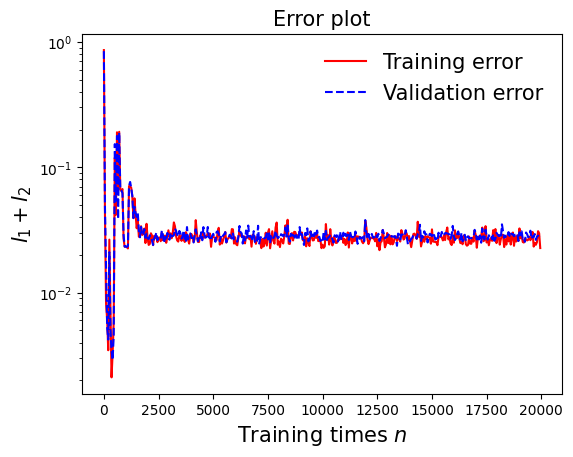

In [25]:
draw_loss(model)

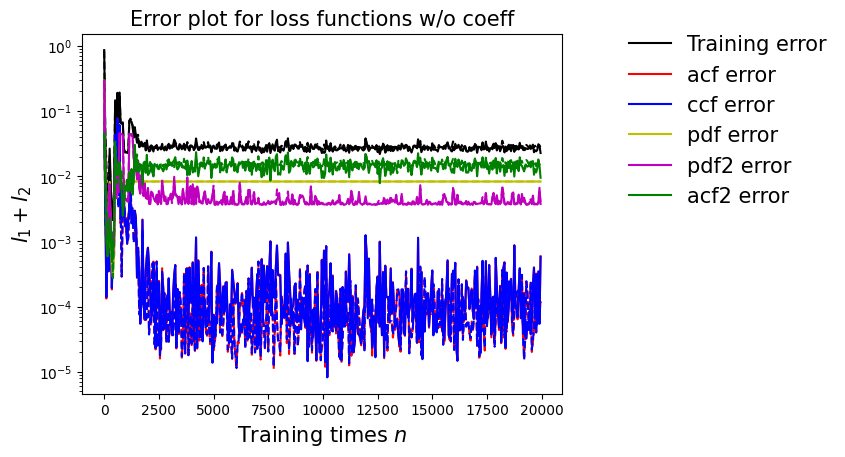

In [26]:
draw_errors(model)

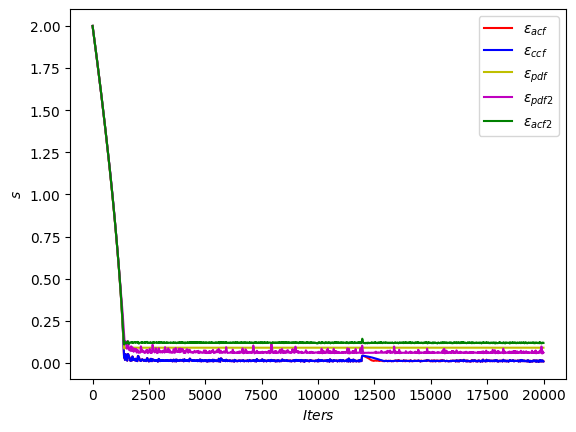

In [27]:
draw_adaptive_w(model)

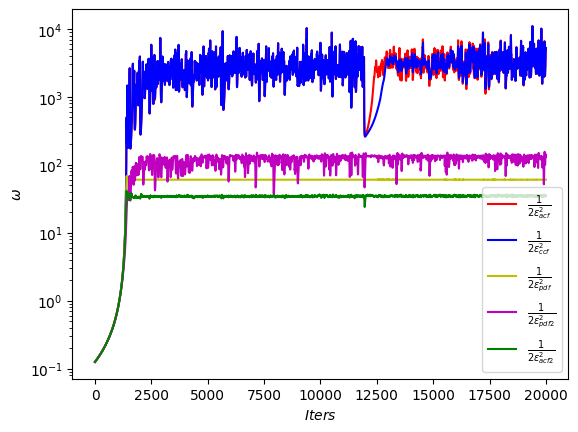

In [28]:
draw_epoch_w(model)

## Test 1: plot the sample path generated by SINN and the exact sample path 

In [29]:
def test1(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    # Test 1: plot the sample path generated by SINN and the exact sample path 
    skip = 0

    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.plot(T[skip:]-T[skip], Traj[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$\tilde{q}_1(t)$ and $\tilde{q}_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.plot(T[skip:]-T[skip], prediction[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_1(t)$ and $q_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF

In [30]:
def test2(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF  
    acf_p=StatLoss.acf(Pred[-sec_length:,:,:])
    acf_t=StatLoss.acf(target)
    corr_p1=acf_p.detach().cpu().numpy()
    corr_t1=acf_t.detach().cpu().numpy()
    ccf_p=StatLoss.ccf(Pred[-sec_length:,:,:])
    ccf_t=StatLoss.ccf(target)
    corr_p2=ccf_p.detach().cpu().numpy()
    corr_t2=ccf_t.detach().cpu().numpy()
    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_1$',fontsize=15)    
    plt.plot(T, corr_t1[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_2$',fontsize=15)          
    plt.plot(T, corr_t1[...,-1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,-1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized CCF',fontsize=15)    
    plt.plot(T, corr_t2[:,:],'r')        # correlation function of the target 
    plt.plot(T, corr_p2[:,:], 'b--')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.ylim(-0.05,0.05)

## Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  

In [31]:
def test3(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  
    rho_data =  StatLoss.gauss_kde(target, -5, 5, 400, None).cpu()
    rho_input = StatLoss.gauss_kde(ran_input, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    rho_data2 =  StatLoss.gauss_kde6(target, -5, 5, 400, None).cpu()
    rho_prediction2 = StatLoss.gauss_kde6(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()


    x=np.linspace(-5, 5, 400)
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function",fontsize=15)    
    plt.plot(x, rho_data.numpy()[...,0],label=r'Exact PDF of $q_{49}$')    # target PDF
    plt.plot(x, rho_data.numpy()[...,1],label=r'Exact PDF of $q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction.numpy()[...,0], ':',label=r'PDF of the output $q_{49}$')  # PDF after the training 
    plt.plot(x, rho_prediction.numpy()[...,1], ':',label=r'PDF of the output $q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,0],label=r'Exact PDF of $q_{49}+q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,1],label=r'Exact PDF of $q_{49}-q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,0], ':',label=r'PDF of the output $q_{49}+q_{50}$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,1], ':',label=r'PDF of the output $q_{49}-q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,2],label=r'Exact PDF of $q_{49}+2q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,3],label=r'Exact PDF of $q_{49}-2q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,2], ':',label=r'PDF of the output $q_{49}+2\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,3], ':',label=r'PDF of the output $q_{49}-2\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(3)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,4],label=r'Exact PDF of $2q_{49}+\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,5],label=r'Exact PDF of $2q_{49}-\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,4], ':',label=r'PDF of the output $2q_{49}+\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,5], ':',label=r'PDF of the output $2q_{49}-\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 4: Comparing the higher-order ACF

In [32]:
def test4(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    # Test 4: Comparing the higher-order ACF
    acf2=StatLoss.acf(target**2)
    pred_norm=torch.from_numpy((prediction).reshape(sec_length, batch,2))
    acf2_app=StatLoss.acf(pred_norm**2)

    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{49}^2$',fontsize=15)    
    plt.plot(T, acf2.detach().cpu().numpy()[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{50}^2$',fontsize=15)          
    plt.plot(T, acf2.detach().cpu().numpy()[...,1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()    

## Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 

In [33]:
def test5(model):
    # Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 
    [a,b,c]=input.size()
    skip=20
    scale=10
    burnin=3
    fold=800
    batch_new=50
    ran_input=torch.randn(((scale-burnin)*a,batch_new,c),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred_L, _= model.predict_U(ran_input)
    prediction_ext=Pred_L.detach().cpu().numpy().reshape((scale-burnin)*a, batch_new,2)
    ccf_p=StatLoss.ccf(Pred_L,method='bruteforce')

    LT=np.linspace(0,(scale-burnin)*a*delta_t,num=(scale-burnin)*a+1)
    LT=LT[0:-1]


    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

## Test 6: comparing scatter plots

In [34]:
def test6(model):
    # Test 6: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.scatter(Traj[:,:,0], Traj[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.scatter(prediction[:,:,0],prediction[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 7: comparing joint PDF contours

In [35]:
def test7(model):
    # Test 5: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    rho_data =  StatLoss.gauss_kde2D(target, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde2D(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    fig = plt.figure(0, figsize=(5, 5))
    plt.title("PDF Contours",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

    xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
    axs[0]  = fig.gca()
    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)
    
    plt.contour(xx,yy,rho_data.numpy(),colors='r')
    plt.contour(xx,yy,rho_prediction.numpy(),colors='b',linestyles='dashed')

    plt.xlabel(r'$q_{49}$')
    plt.ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(1,figsize=(5, 5))
    plt.title("MD trajectories",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_data.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_data.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(2,figsize=(5, 5))
    plt.title("SINN output",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_prediction.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_prediction.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

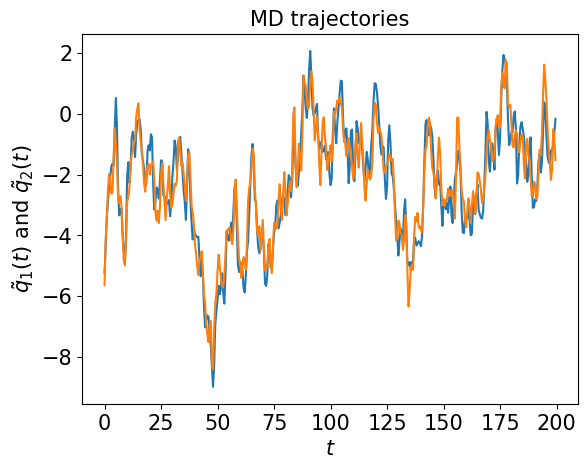

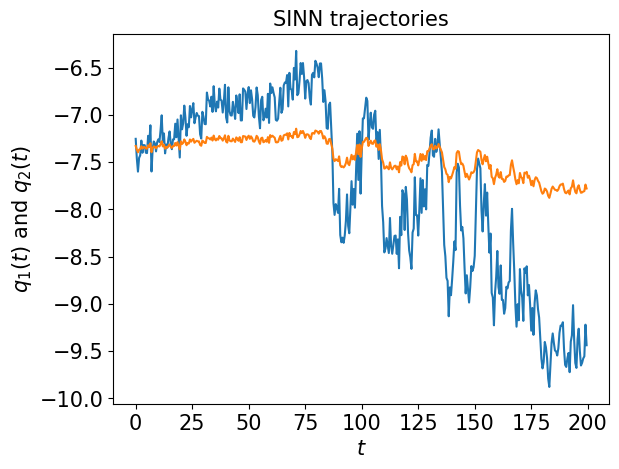

In [36]:
test1(model)

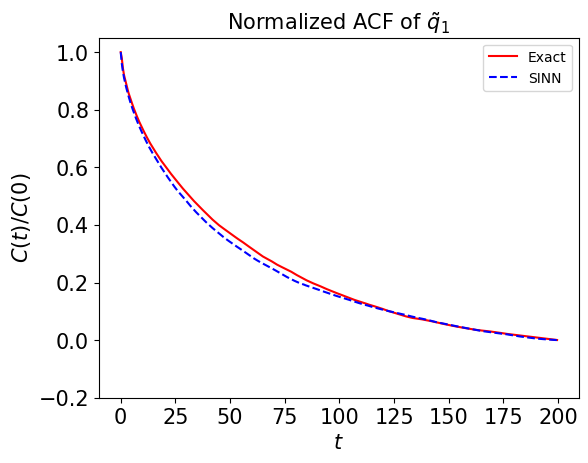

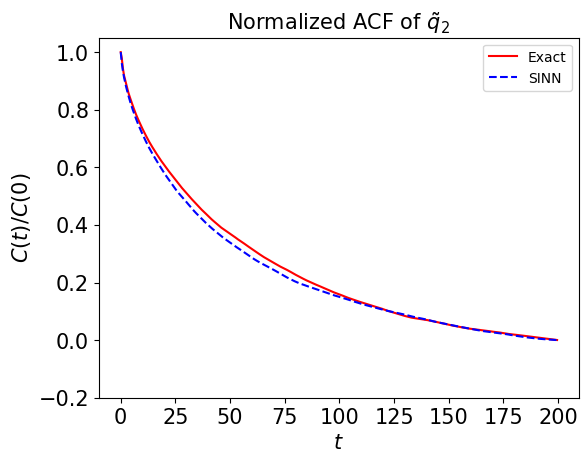

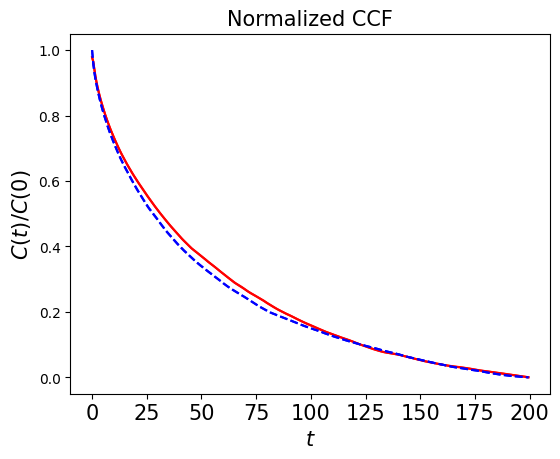

In [37]:
test2(model)

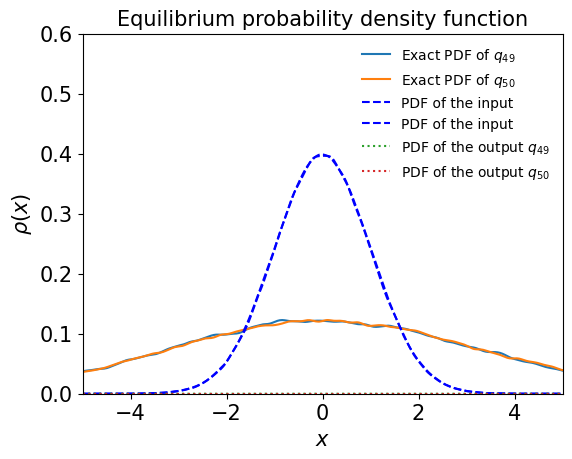

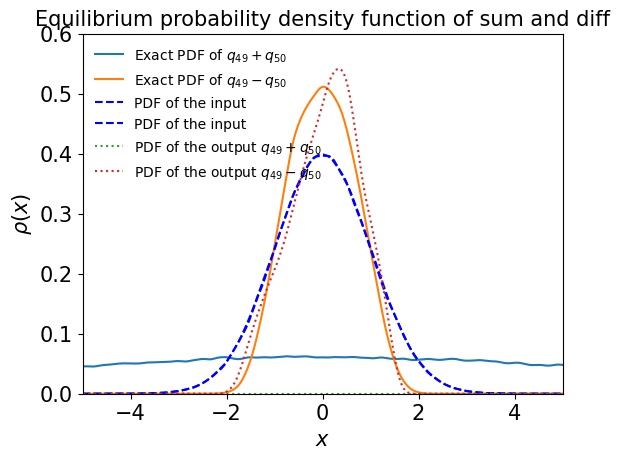

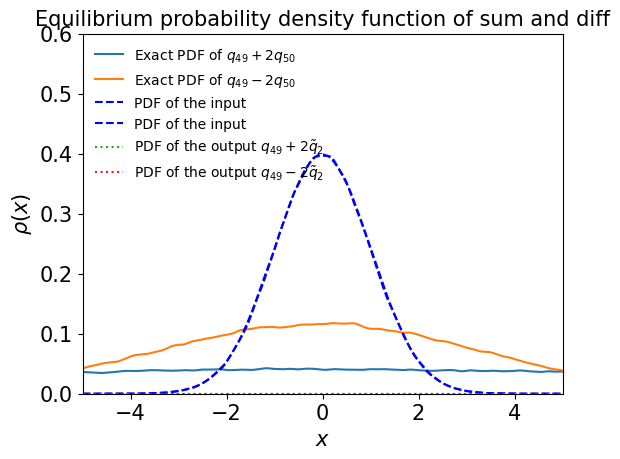

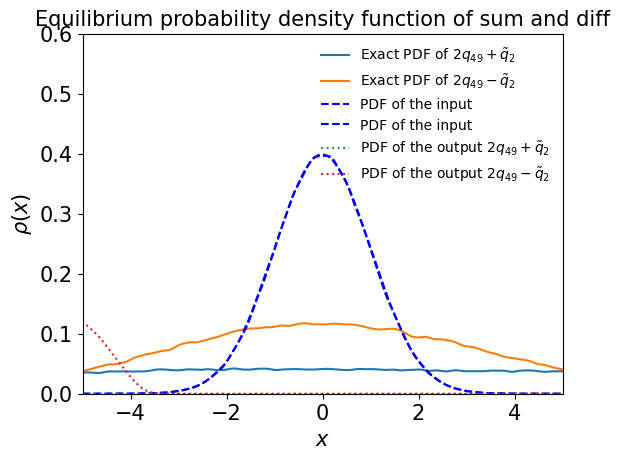

In [38]:
test3(model)

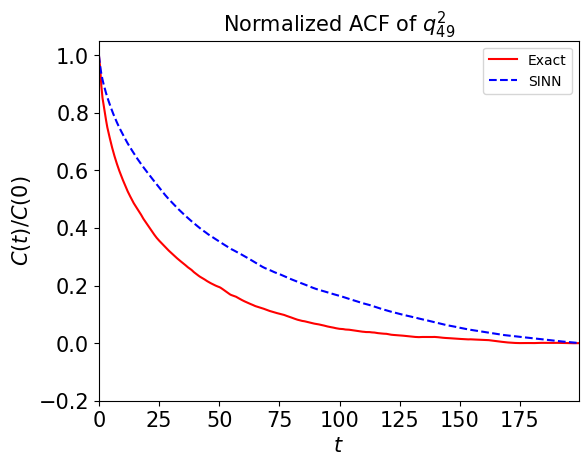

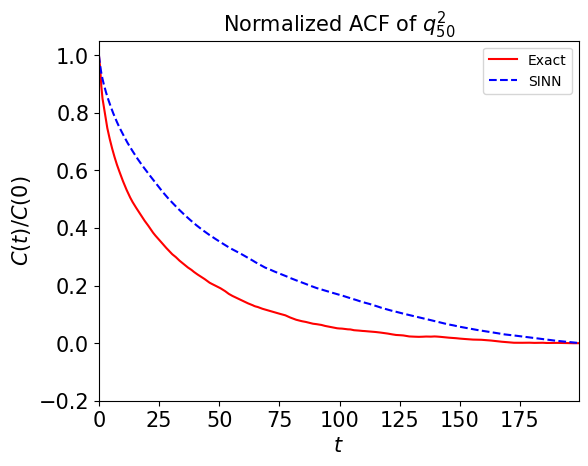

In [39]:
test4(model)

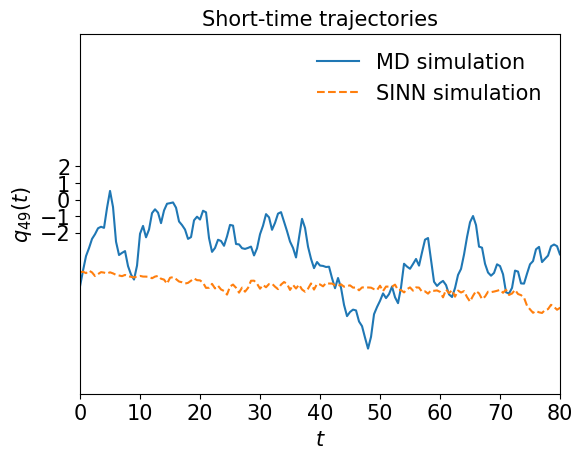

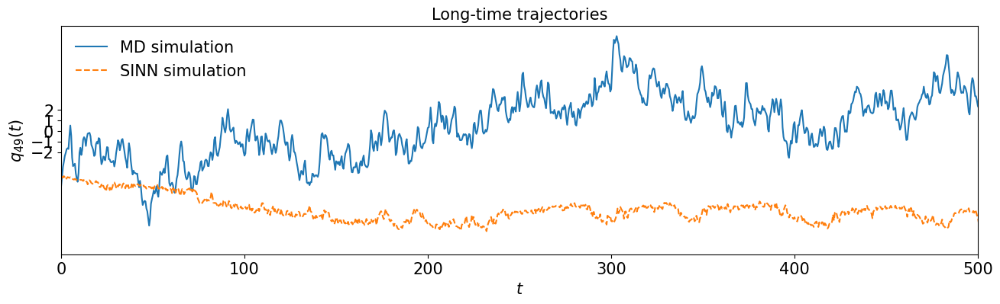

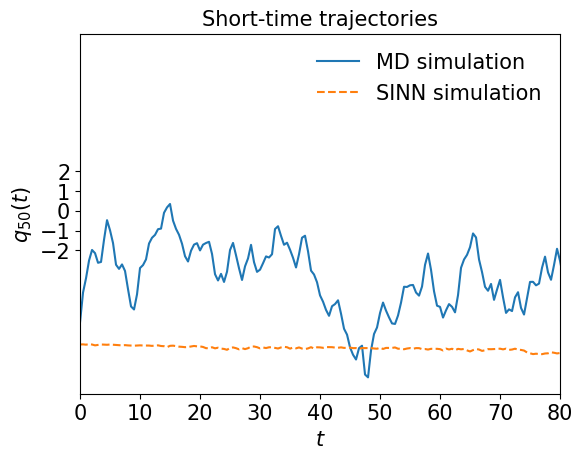

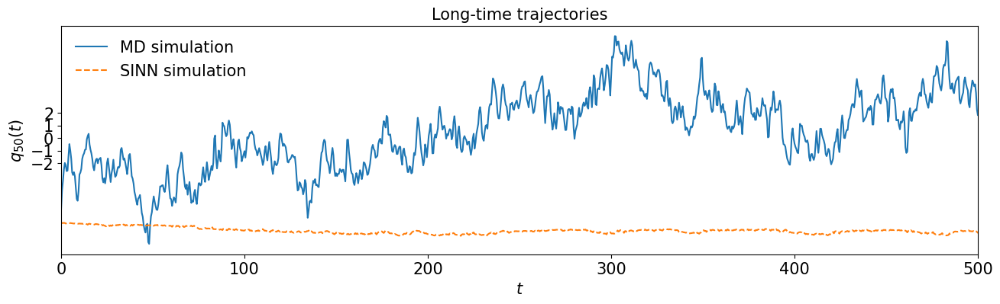

In [40]:
test5(model)

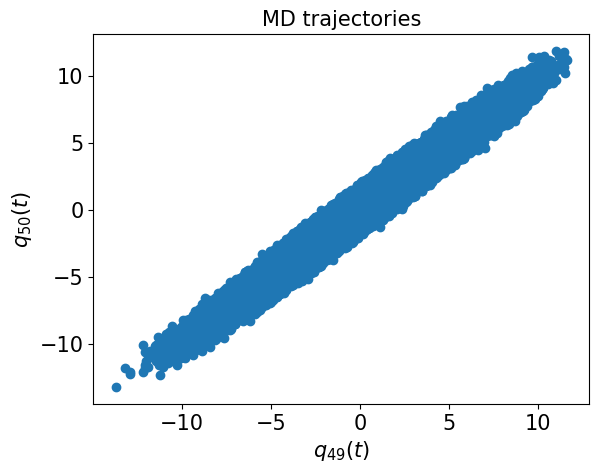

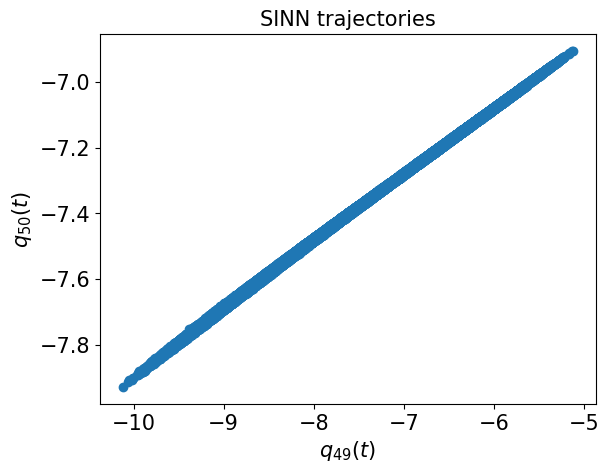

In [41]:
test6(model)

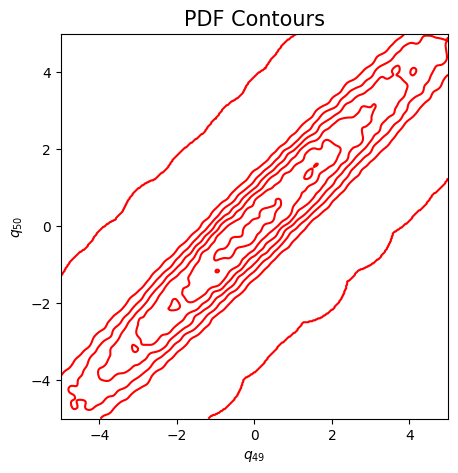

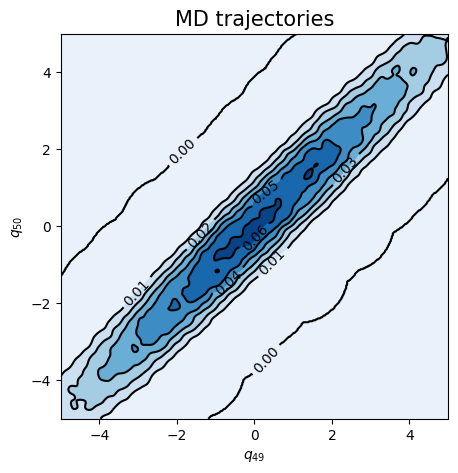

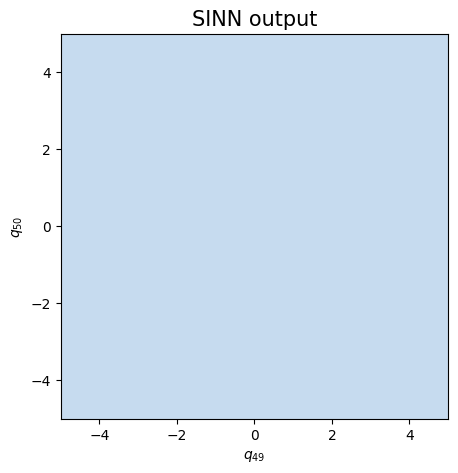

In [42]:
test7(model)

In [43]:
### Defining SINN model
net1 = SINN(2, 75, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model1 = Model(net=net1)
model1.train()

[0]-th step loss: 0.8478, 0.8299, acf: 0.10212, ccf: 0.10310, pdf: 0.29246, pdf2: 0.28694, acf2: 0.04532
[50]-th step loss: 0.1890, 0.1894, acf: 0.03951, ccf: 0.03942, pdf: 0.04632, pdf2: 0.05783, acf2: 0.00628
[100]-th step loss: 0.0773, 0.0675, acf: 0.00211, ccf: 0.00214, pdf: 0.02779, pdf2: 0.02307, acf2: 0.01239
[150]-th step loss: 0.0133, 0.0157, acf: 0.00271, ccf: 0.00272, pdf: 0.00551, pdf2: 0.00404, acf2: 0.00075
[200]-th step loss: 0.0094, 0.0081, acf: 0.00139, ccf: 0.00140, pdf: 0.00235, pdf2: 0.00226, acf2: 0.00072
[250]-th step loss: 0.0108, 0.0131, acf: 0.00103, ccf: 0.00105, pdf: 0.00517, pdf2: 0.00499, acf2: 0.00087
[300]-th step loss: 0.0081, 0.0040, acf: 0.00075, ccf: 0.00076, pdf: 0.00090, pdf2: 0.00128, acf2: 0.00035
[350]-th step loss: 0.0048, 0.0088, acf: 0.00092, ccf: 0.00094, pdf: 0.00118, pdf2: 0.00188, acf2: 0.00391
[400]-th step loss: 0.0033, 0.0025, acf: 0.00026, ccf: 0.00026, pdf: 0.00032, pdf2: 0.00091, acf2: 0.00076
[450]-th step loss: 0.0027, 0.0030, acf:

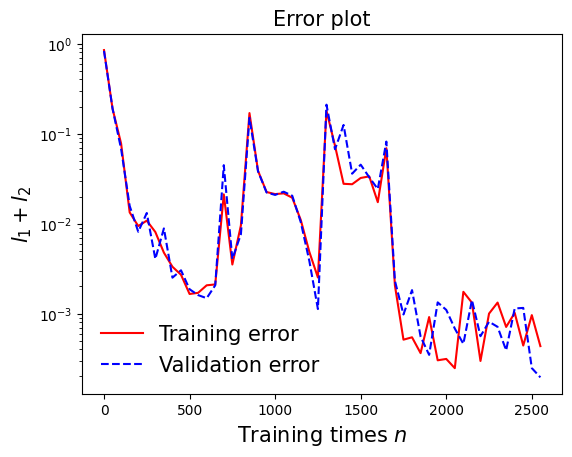

In [44]:
draw_loss(model1)

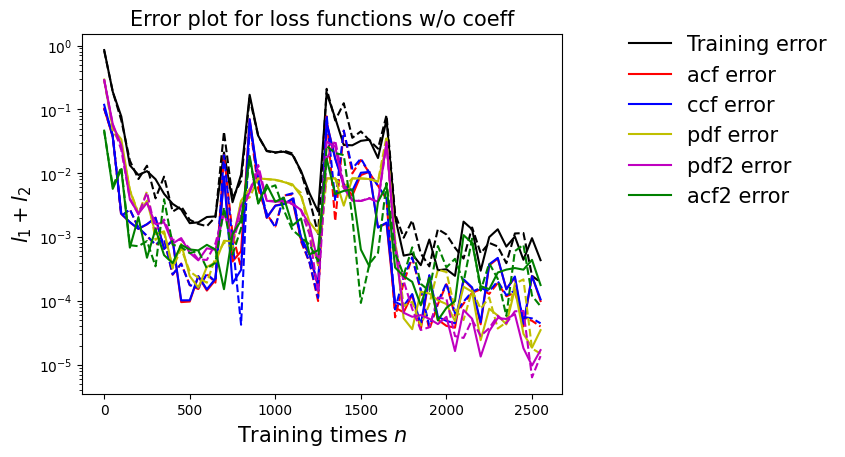

In [45]:
draw_errors(model1)

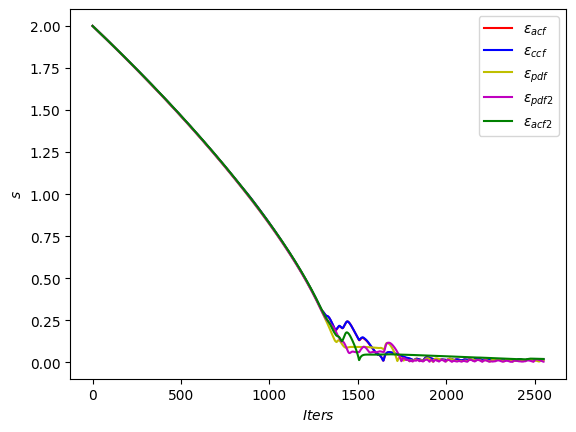

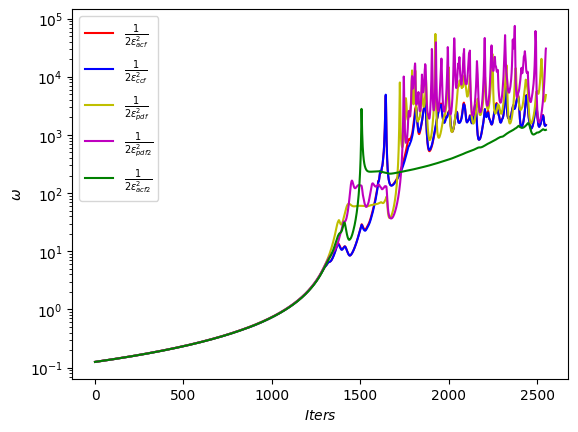

In [46]:
draw_adaptive_w(model1)
draw_epoch_w(model1)

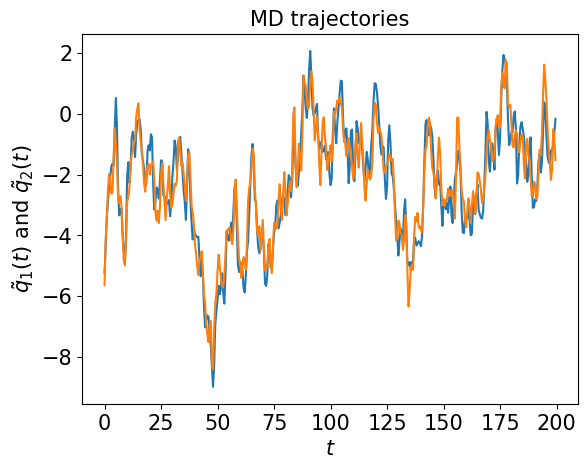

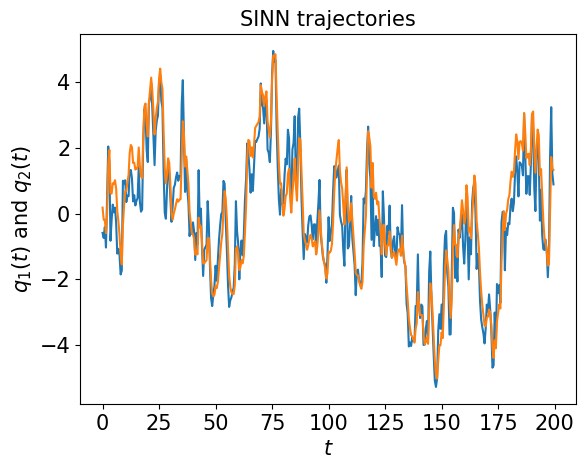

In [47]:
test1(model1)

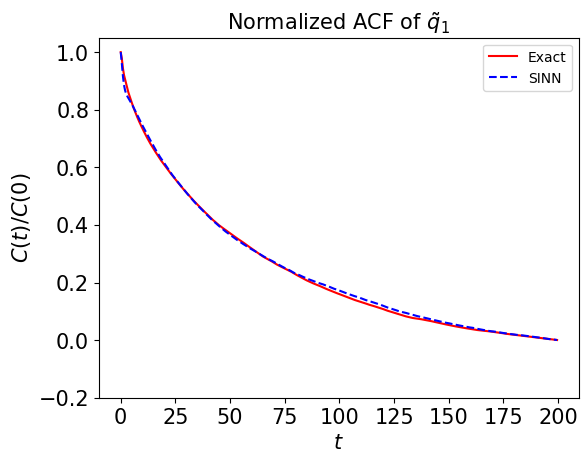

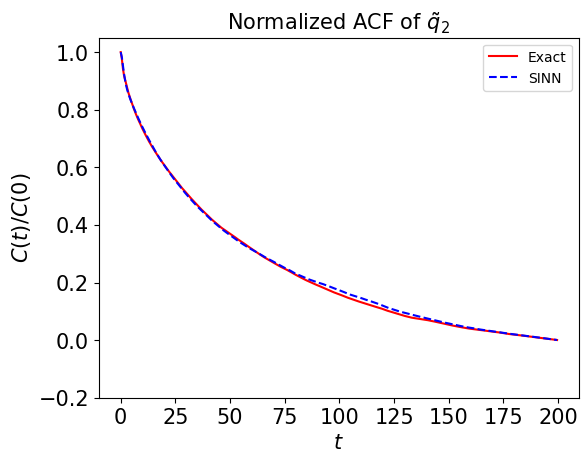

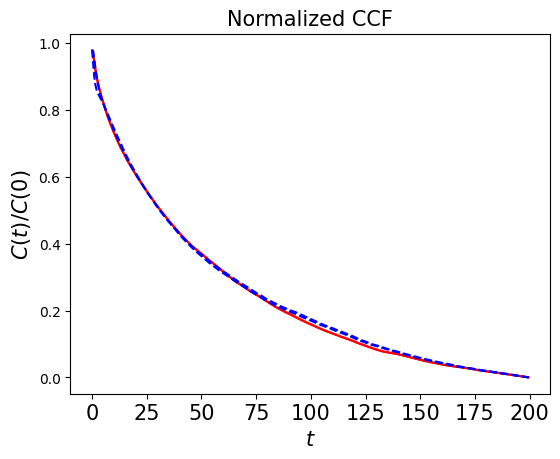

In [48]:
test2(model1)

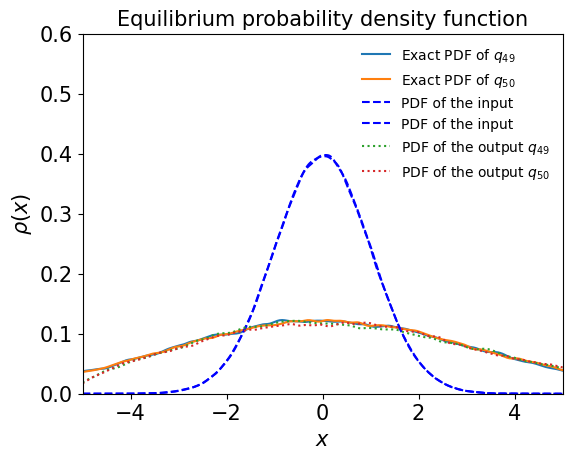

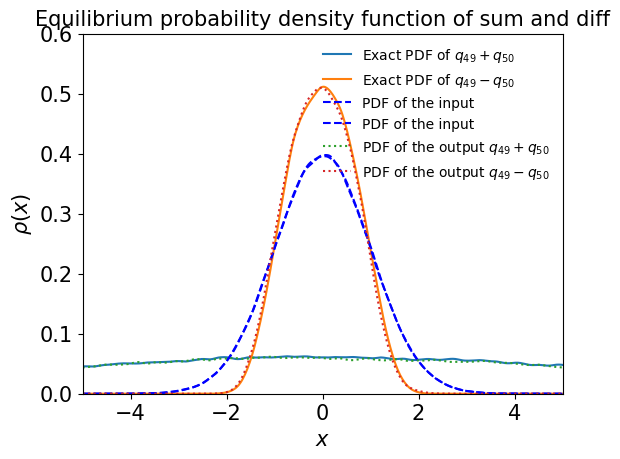

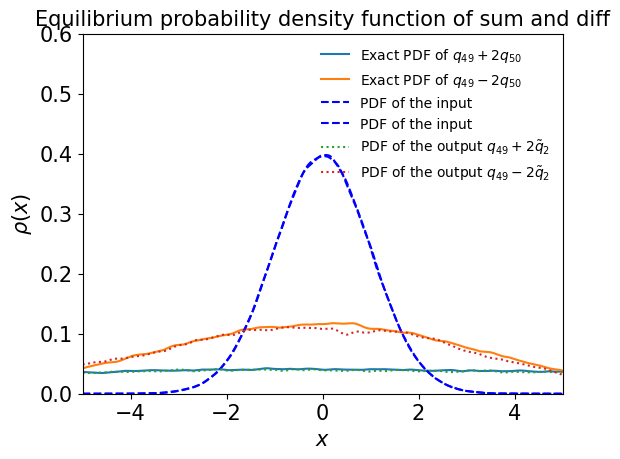

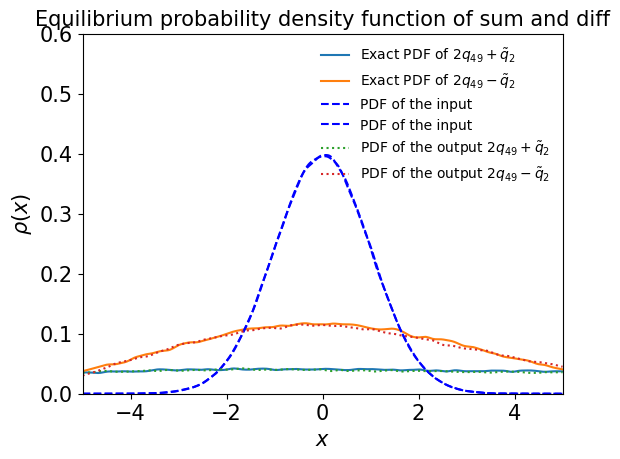

In [49]:
test3(model1)

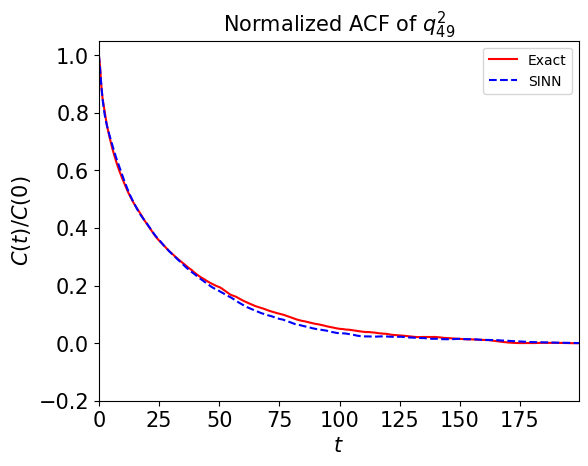

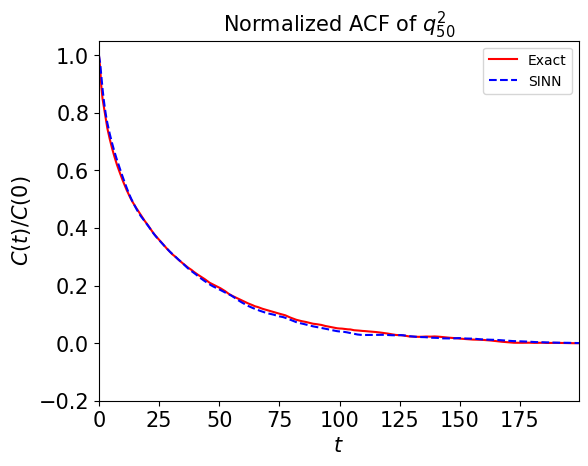

In [50]:
test4(model1)

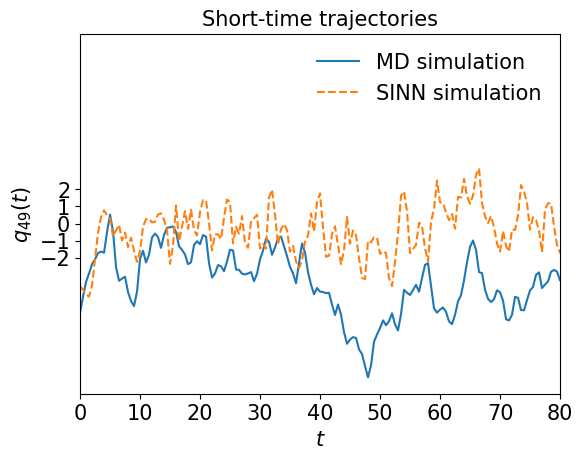

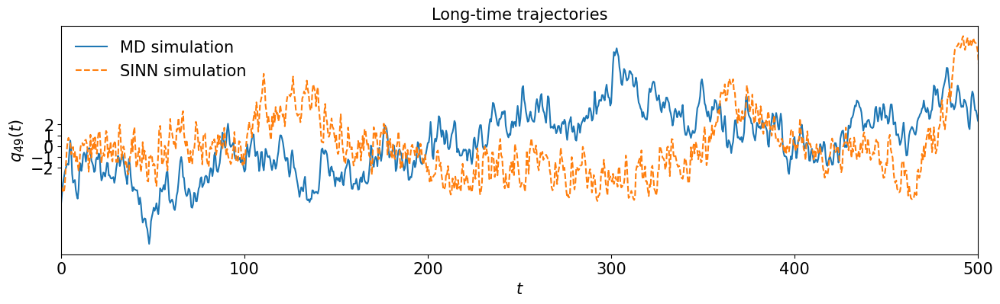

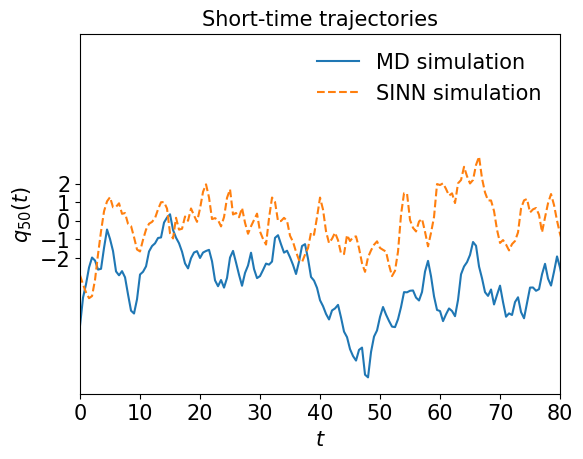

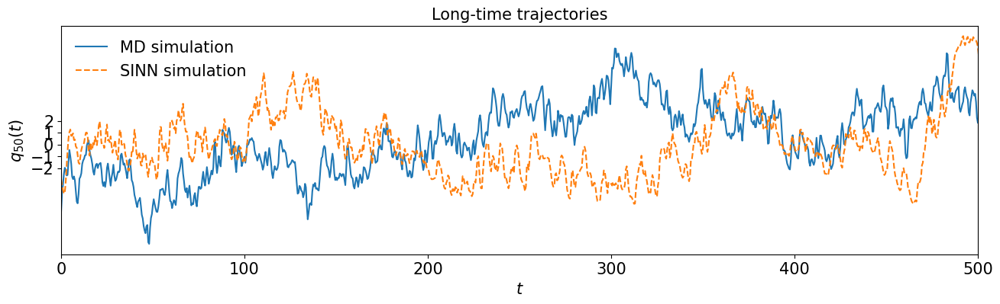

In [51]:
test5(model1)

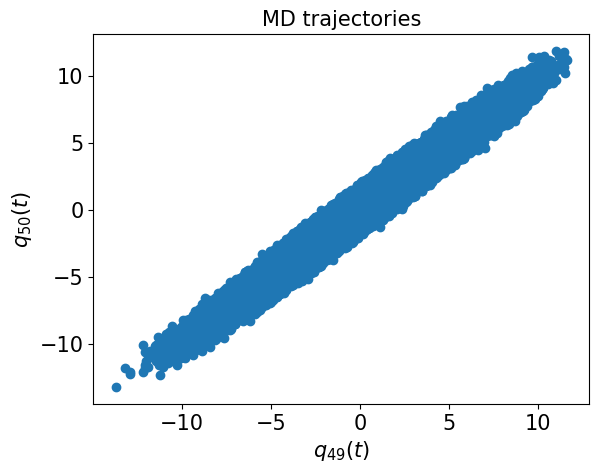

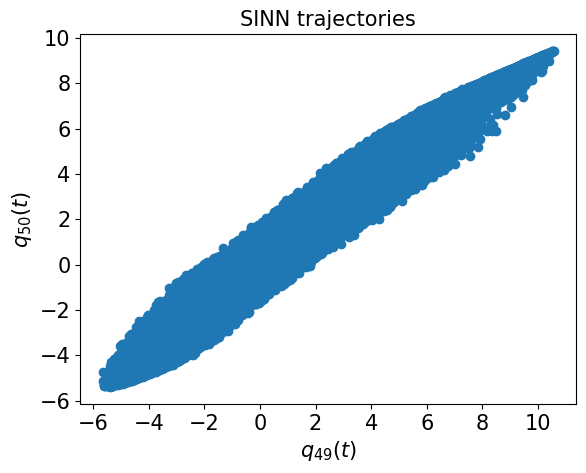

In [52]:
test6(model1)

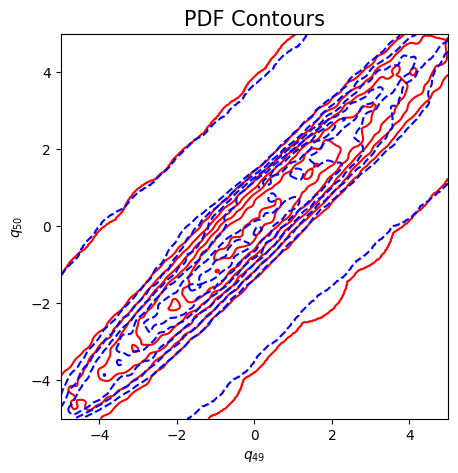

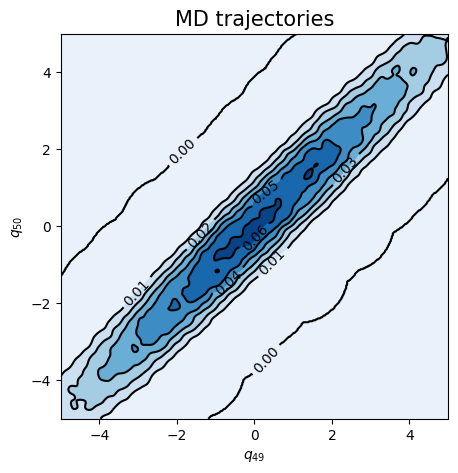

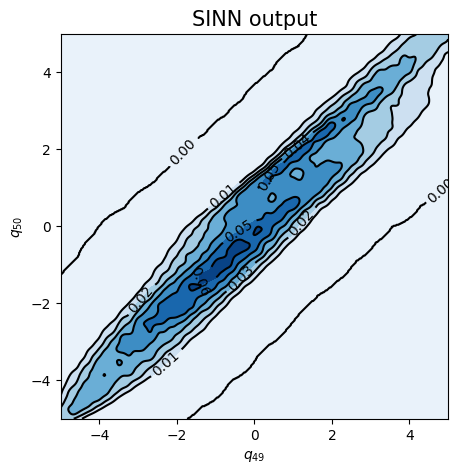

In [53]:
test7(model1)

In [54]:
### Defining SINN model
net2 = SINN(2, 75, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model2 = Model(net=net2)
model2.train()

[0]-th step loss: 0.8362, 0.8246, acf: 0.10000, ccf: 0.09978, pdf: 0.29279, pdf2: 0.28847, acf2: 0.04353
[50]-th step loss: 0.1452, 0.1047, acf: 0.01046, ccf: 0.01045, pdf: 0.03607, pdf2: 0.03332, acf2: 0.01442
[100]-th step loss: 0.1415, 0.0982, acf: 0.02195, ccf: 0.02189, pdf: 0.03200, pdf2: 0.01996, acf2: 0.00236
[150]-th step loss: 0.0559, 0.0463, acf: 0.01362, ccf: 0.01358, pdf: 0.00949, pdf2: 0.00720, acf2: 0.00236
[200]-th step loss: 0.0177, 0.0147, acf: 0.00329, ccf: 0.00330, pdf: 0.00270, pdf2: 0.00339, acf2: 0.00199
[250]-th step loss: 0.2634, 0.2615, acf: 0.08748, ccf: 0.08730, pdf: 0.00829, pdf2: 0.04480, acf2: 0.03365
[300]-th step loss: 0.0652, 0.0636, acf: 0.00223, ccf: 0.00222, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00608
[350]-th step loss: 0.0644, 0.0641, acf: 0.00344, ccf: 0.00340, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00428
[400]-th step loss: 0.0631, 0.0638, acf: 0.00085, ccf: 0.00083, pdf: 0.00829, pdf2: 0.04473, acf2: 0.00908
[450]-th step loss: 0.0654, 0.0632, acf:

[3850]-th step loss: 0.0301, 0.0268, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00375, acf2: 0.01466
[3900]-th step loss: 0.0291, 0.0311, acf: 0.00001, ccf: 0.00001, pdf: 0.00829, pdf2: 0.00827, acf2: 0.01451
[3950]-th step loss: 0.0302, 0.0271, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00475, acf2: 0.01397
[4000]-th step loss: 0.0282, 0.0281, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00375, acf2: 0.01594
[4050]-th step loss: 0.0278, 0.0264, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00383, acf2: 0.01419
[4100]-th step loss: 0.0253, 0.0284, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00381, acf2: 0.01622
[4150]-th step loss: 0.0282, 0.0284, acf: 0.00004, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00390, acf2: 0.01609
[4200]-th step loss: 0.0296, 0.0265, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00456, acf2: 0.01362
[4250]-th step loss: 0.0231, 0.0242, acf: 0.00018, ccf: 0.00017, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01182
[4300]-th step loss: 0.0246,

[7650]-th step loss: 0.0295, 0.0269, acf: 0.00006, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00389, acf2: 0.01459
[7700]-th step loss: 0.0248, 0.0248, acf: 0.00011, ccf: 0.00011, pdf: 0.00829, pdf2: 0.00372, acf2: 0.01252
[7750]-th step loss: 0.0264, 0.0285, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00371, acf2: 0.01641
[7800]-th step loss: 0.0289, 0.0270, acf: 0.00006, ccf: 0.00005, pdf: 0.00829, pdf2: 0.00500, acf2: 0.01357
[7850]-th step loss: 0.0259, 0.0242, acf: 0.00019, ccf: 0.00019, pdf: 0.00829, pdf2: 0.00414, acf2: 0.01139
[7900]-th step loss: 0.0270, 0.0259, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00387, acf2: 0.01368
[7950]-th step loss: 0.0284, 0.0277, acf: 0.00001, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00437, acf2: 0.01503
[8000]-th step loss: 0.0293, 0.0282, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00468, acf2: 0.01518
[8050]-th step loss: 0.0251, 0.0254, acf: 0.00005, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00367, acf2: 0.01332
[8100]-th step loss: 0.0236,

[11450]-th step loss: 0.0276, 0.0268, acf: 0.00001, ccf: 0.00001, pdf: 0.00829, pdf2: 0.00431, acf2: 0.01421
[11500]-th step loss: 0.0267, 0.0257, acf: 0.00005, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00416, acf2: 0.01319
[11550]-th step loss: 0.0245, 0.0277, acf: 0.00005, ccf: 0.00004, pdf: 0.00829, pdf2: 0.00373, acf2: 0.01557
[11600]-th step loss: 0.0251, 0.0258, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00373, acf2: 0.01374
[11650]-th step loss: 0.0259, 0.0273, acf: 0.00017, ccf: 0.00016, pdf: 0.00829, pdf2: 0.00446, acf2: 0.01426
[11700]-th step loss: 0.0266, 0.0259, acf: 0.00003, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00370, acf2: 0.01390
[11750]-th step loss: 0.0272, 0.0261, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00369, acf2: 0.01406
[11800]-th step loss: 0.0298, 0.0260, acf: 0.00004, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00393, acf2: 0.01372
[11850]-th step loss: 0.0278, 0.0252, acf: 0.00008, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01298
[11900]-th step los

[15250]-th step loss: 0.0241, 0.0253, acf: 0.00011, ccf: 0.00011, pdf: 0.00829, pdf2: 0.00433, acf2: 0.01242
[15300]-th step loss: 0.0278, 0.0270, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00397, acf2: 0.01473
[15350]-th step loss: 0.0289, 0.0265, acf: 0.00001, ccf: 0.00001, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01443
[15400]-th step loss: 0.0244, 0.0274, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00376, acf2: 0.01530
[15450]-th step loss: 0.0262, 0.0251, acf: 0.00008, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00378, acf2: 0.01282
[15500]-th step loss: 0.0262, 0.0250, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00373, acf2: 0.01288
[15550]-th step loss: 0.0241, 0.0253, acf: 0.00007, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00395, acf2: 0.01289
[15600]-th step loss: 0.0343, 0.0299, acf: 0.00009, ccf: 0.00010, pdf: 0.00829, pdf2: 0.00473, acf2: 0.01669
[15650]-th step loss: 0.0258, 0.0255, acf: 0.00007, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00404, acf2: 0.01300
[15700]-th step los

[19050]-th step loss: 0.0253, 0.0268, acf: 0.00002, ccf: 0.00001, pdf: 0.00829, pdf2: 0.00371, acf2: 0.01473
[19100]-th step loss: 0.0301, 0.0249, acf: 0.00009, ccf: 0.00008, pdf: 0.00829, pdf2: 0.00366, acf2: 0.01279
[19150]-th step loss: 0.0260, 0.0271, acf: 0.00007, ccf: 0.00006, pdf: 0.00829, pdf2: 0.00438, acf2: 0.01427
[19200]-th step loss: 0.0241, 0.0243, acf: 0.00015, ccf: 0.00015, pdf: 0.00829, pdf2: 0.00380, acf2: 0.01196
[19250]-th step loss: 0.0355, 0.0355, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.01198, acf2: 0.01523
[19300]-th step loss: 0.0272, 0.0260, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00367, acf2: 0.01404
[19350]-th step loss: 0.0269, 0.0292, acf: 0.00003, ccf: 0.00002, pdf: 0.00829, pdf2: 0.00697, acf2: 0.01389
[19400]-th step loss: 0.0267, 0.0255, acf: 0.00014, ccf: 0.00013, pdf: 0.00829, pdf2: 0.00506, acf2: 0.01186
[19450]-th step loss: 0.0308, 0.0283, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.00431, acf2: 0.01568
[19500]-th step los

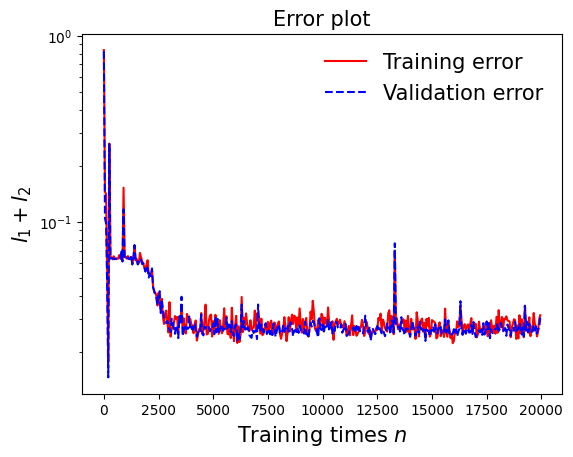

In [55]:
draw_loss(model2)

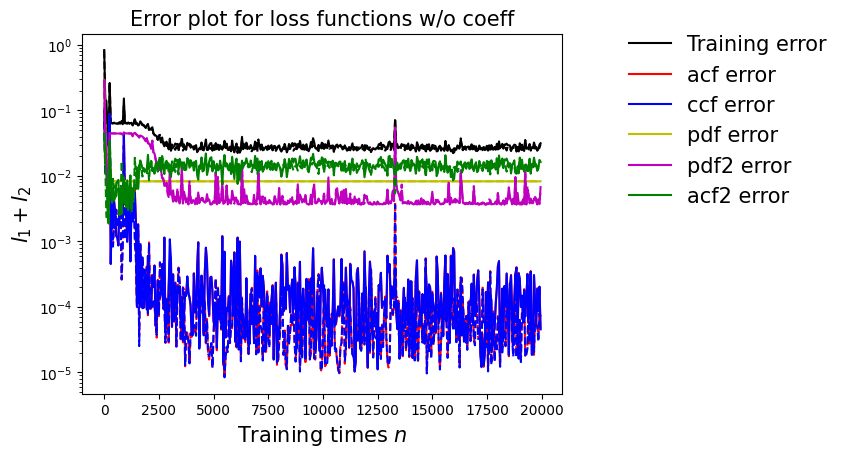

In [56]:
draw_errors(model2)

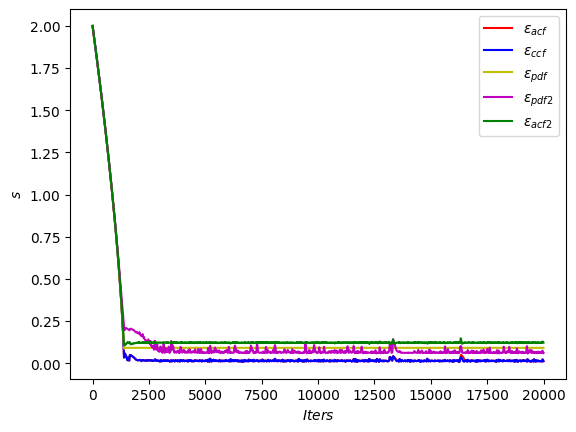

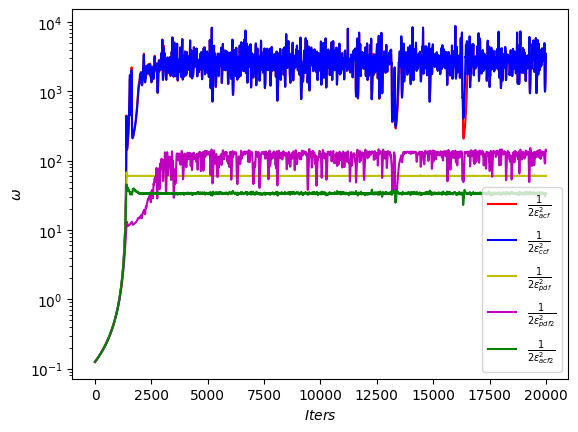

In [57]:
draw_adaptive_w(model2)
draw_epoch_w(model2)

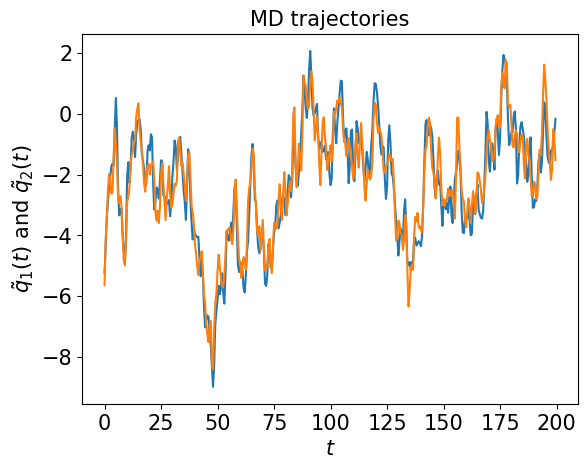

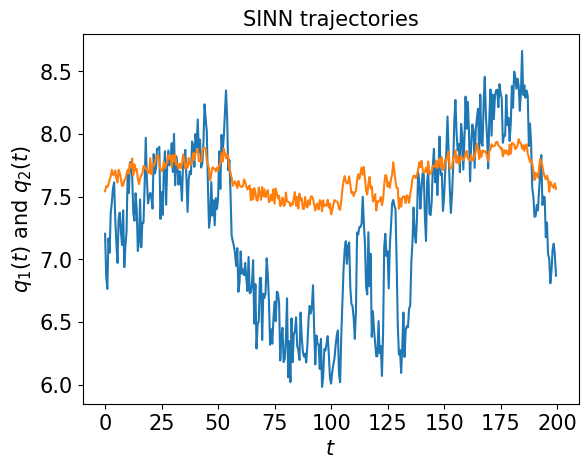

In [58]:
test1(model2)

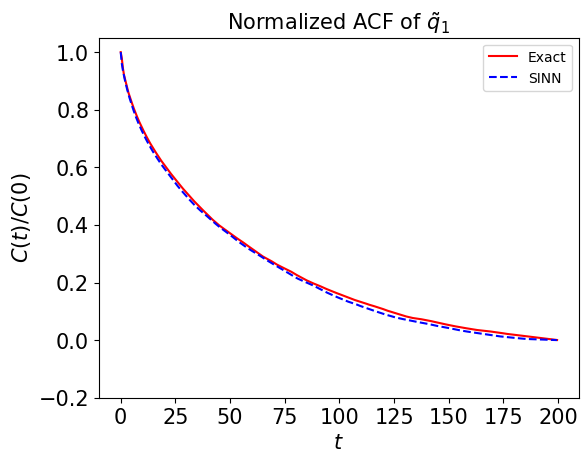

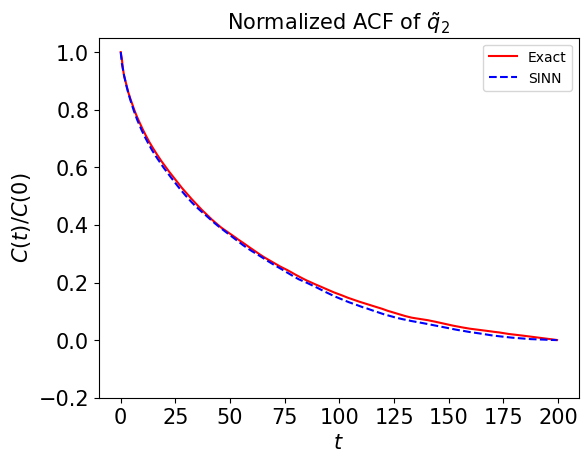

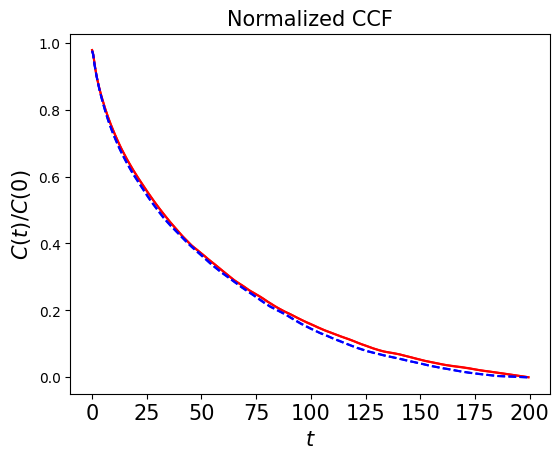

In [59]:
test2(model2)

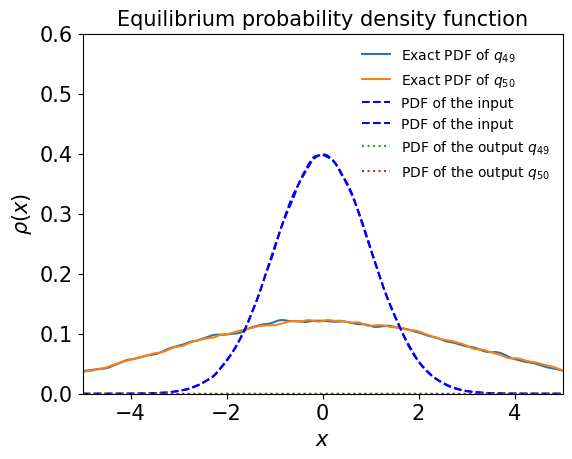

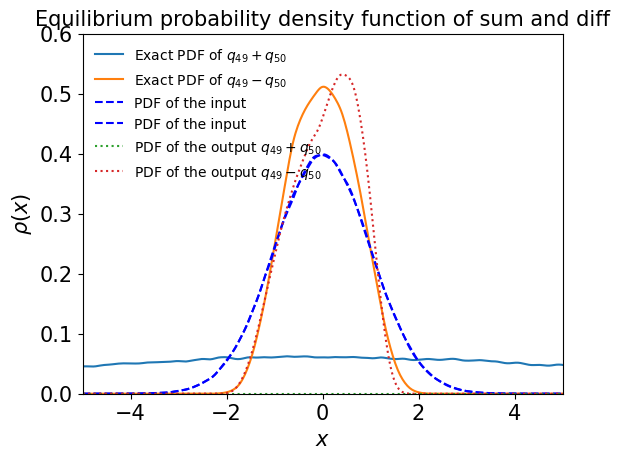

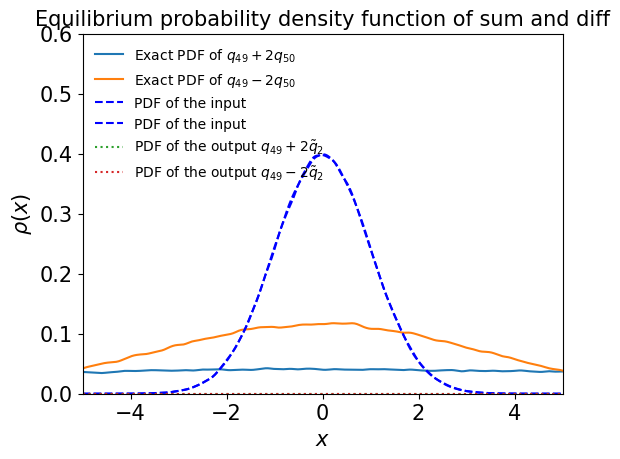

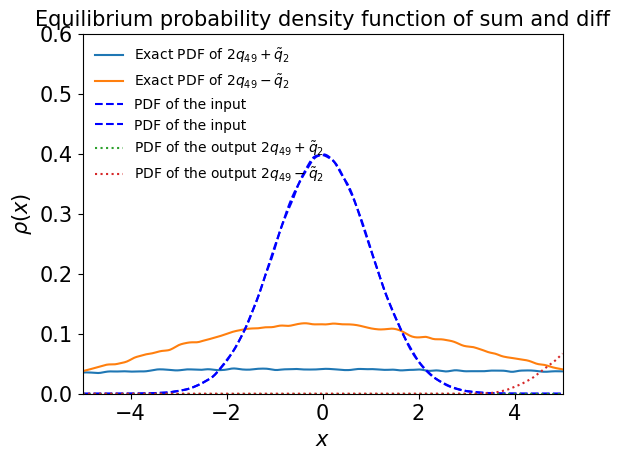

In [60]:
test3(model2)

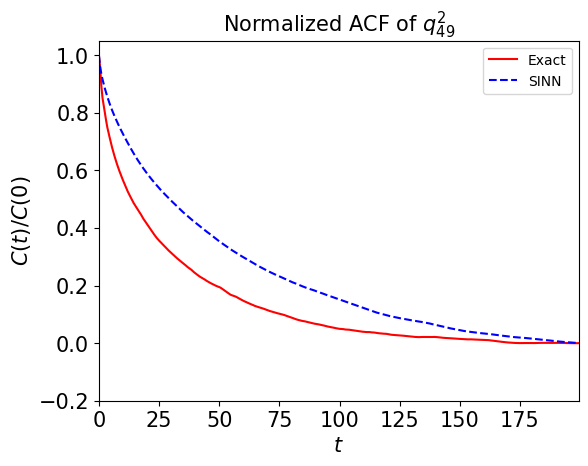

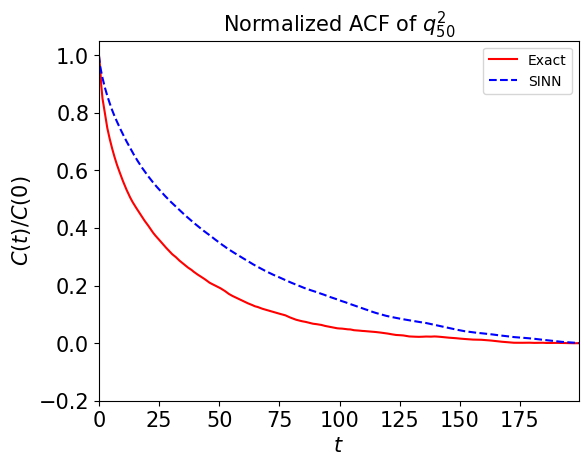

In [61]:
test4(model2)

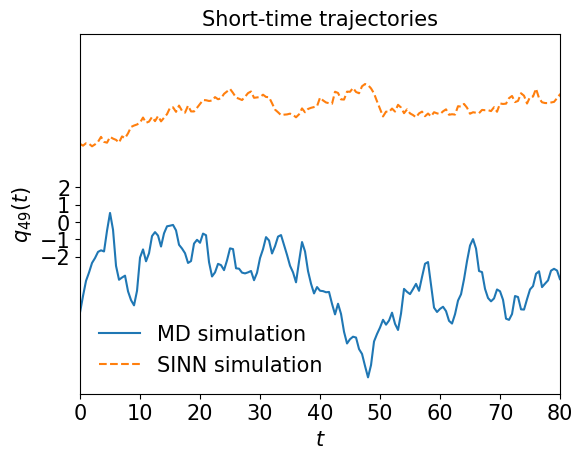

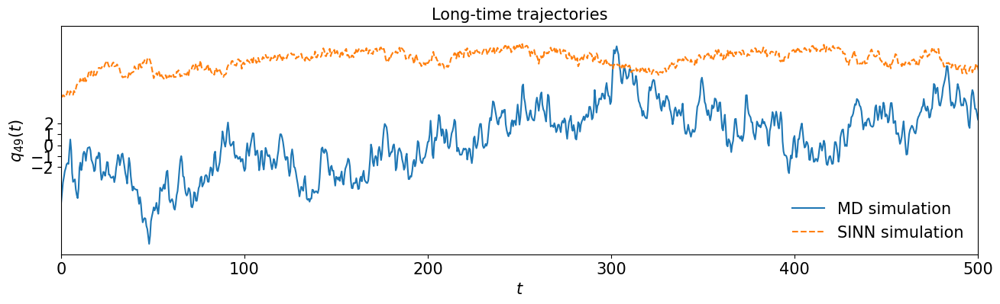

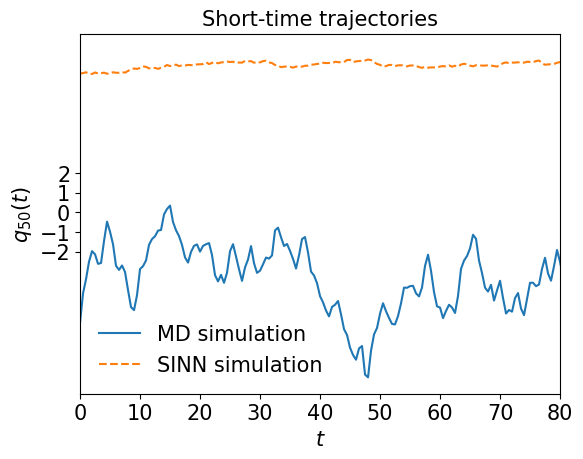

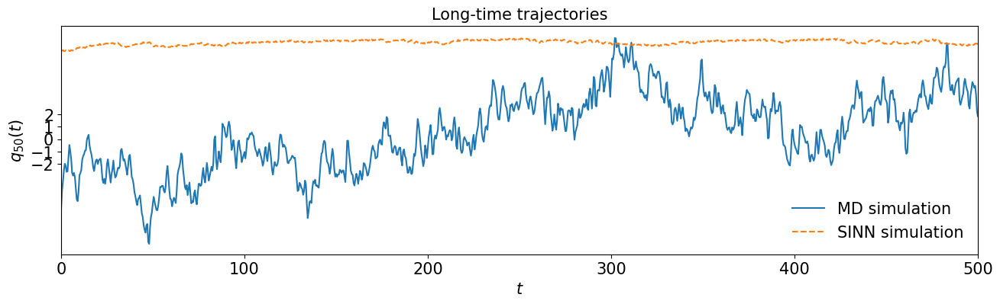

In [62]:
test5(model2)

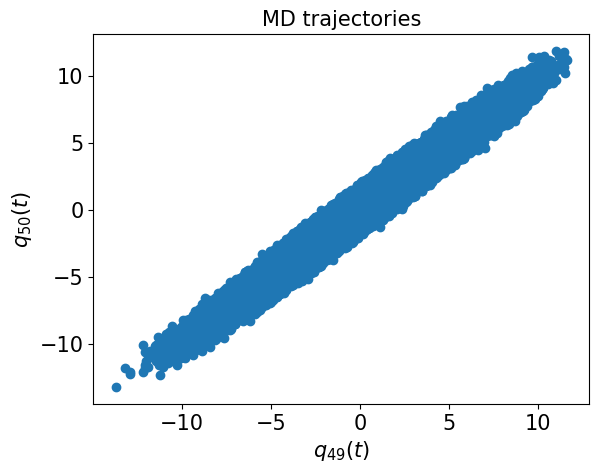

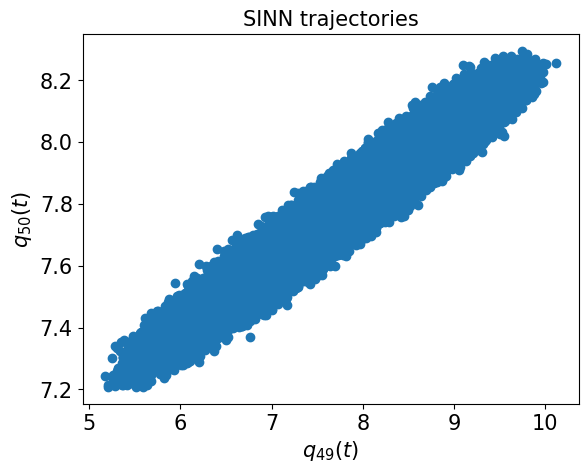

In [63]:
test6(model2)

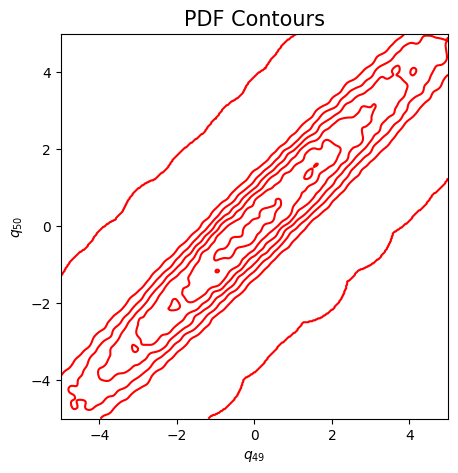

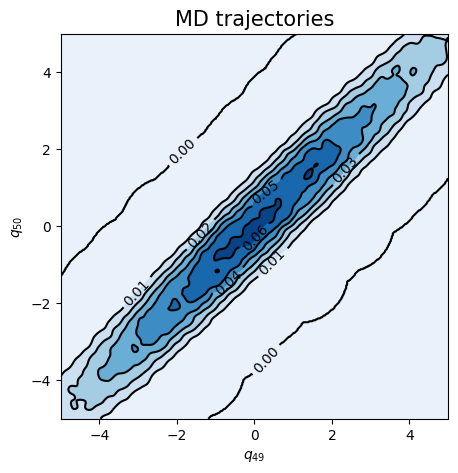

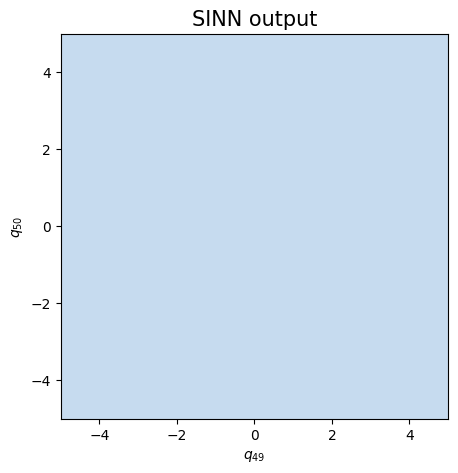

In [64]:
test7(model2)

In [65]:
### Defining SINN model
net3 = SINN(2, 75, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model3 = Model(net=net3)
model3.train()

[0]-th step loss: 0.8384, 0.8280, acf: 0.10135, ccf: 0.10122, pdf: 0.29277, pdf2: 0.28821, acf2: 0.04444
[50]-th step loss: 0.0822, 0.0826, acf: 0.00397, ccf: 0.00400, pdf: 0.04589, pdf2: 0.02526, acf2: 0.00345
[100]-th step loss: 0.0361, 0.0447, acf: 0.00544, ccf: 0.00591, pdf: 0.01812, pdf2: 0.00910, acf2: 0.00615
[150]-th step loss: 0.0221, 0.0267, acf: 0.00250, ccf: 0.00099, pdf: 0.00976, pdf2: 0.01207, acf2: 0.00140
[200]-th step loss: 0.0220, 0.0201, acf: 0.00014, ccf: 0.00015, pdf: 0.00920, pdf2: 0.00935, acf2: 0.00127
[250]-th step loss: 0.0118, 0.0118, acf: 0.00015, ccf: 0.00016, pdf: 0.00498, pdf2: 0.00572, acf2: 0.00079
[300]-th step loss: 0.0111, 0.0109, acf: 0.00015, ccf: 0.00016, pdf: 0.00444, pdf2: 0.00556, acf2: 0.00061
[350]-th step loss: 0.0100, 0.0119, acf: 0.00074, ccf: 0.00076, pdf: 0.00349, pdf2: 0.00561, acf2: 0.00127
[400]-th step loss: 0.0112, 0.0114, acf: 0.00023, ccf: 0.00024, pdf: 0.00456, pdf2: 0.00529, acf2: 0.00113
[450]-th step loss: 0.0121, 0.0155, acf:

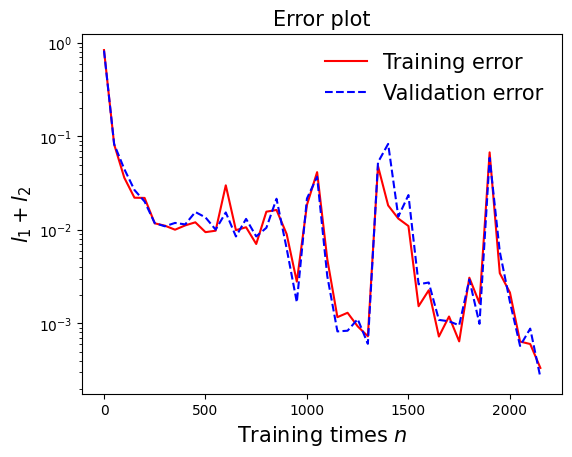

In [66]:
draw_loss(model3)

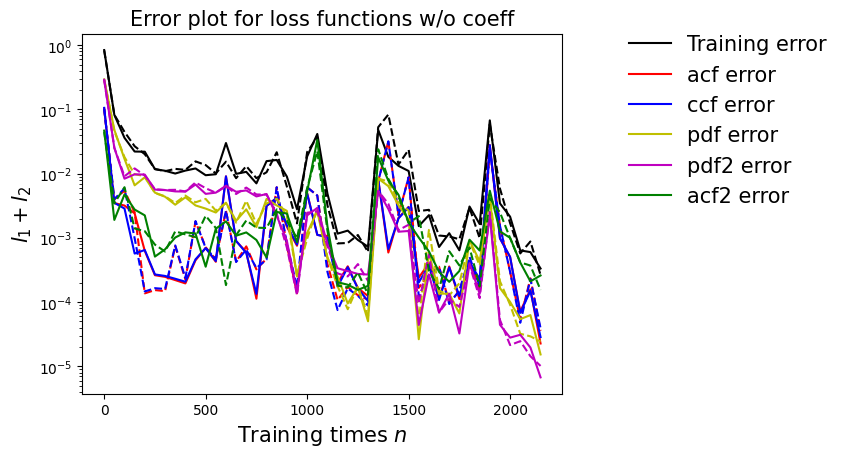

In [67]:
draw_errors(model3)

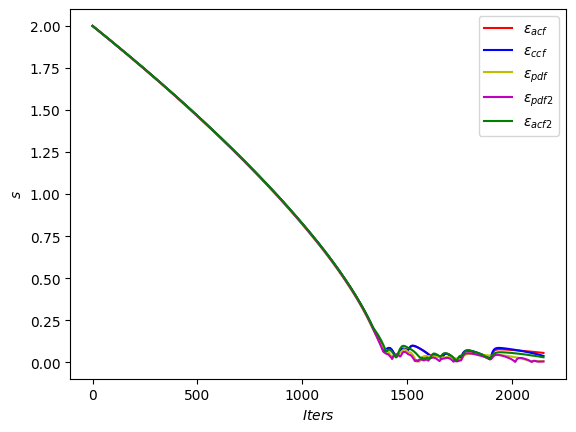

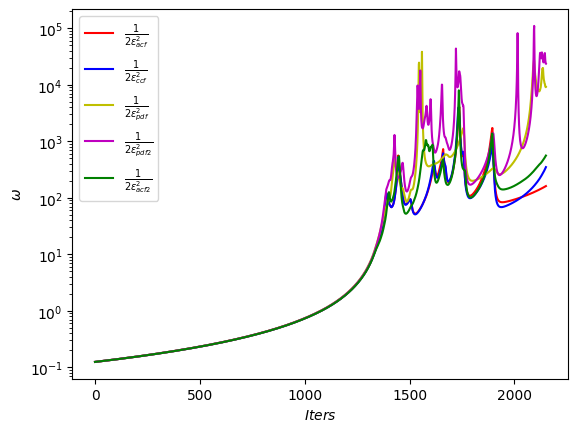

In [68]:
draw_adaptive_w(model3)
draw_epoch_w(model3)

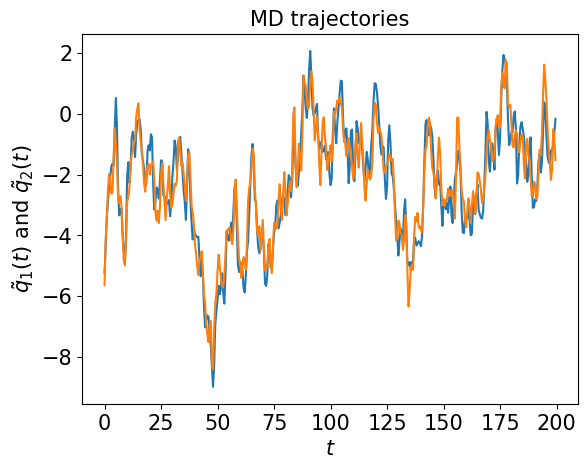

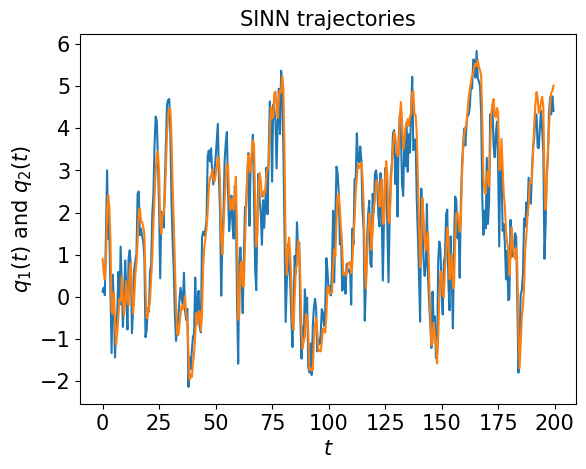

In [69]:
test1(model3)

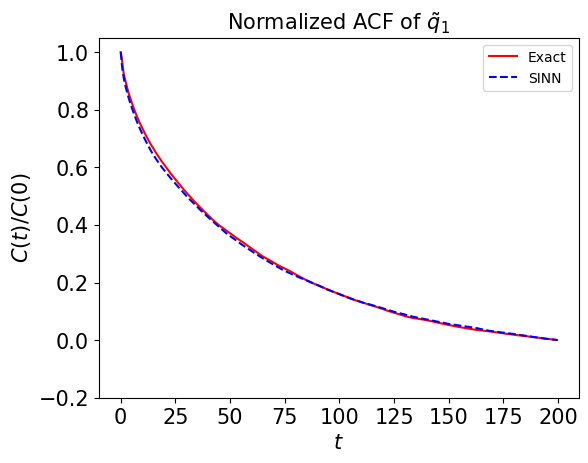

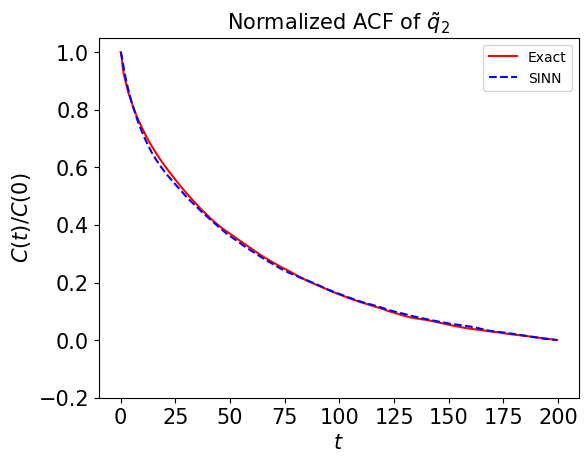

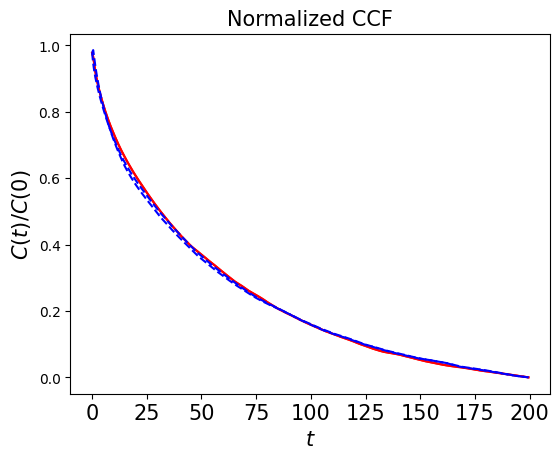

In [70]:
test2(model3)

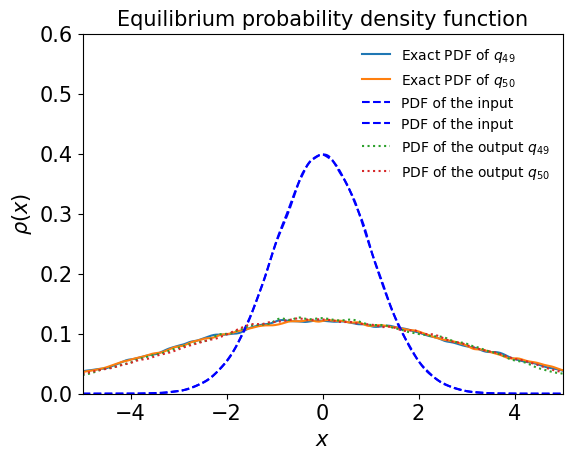

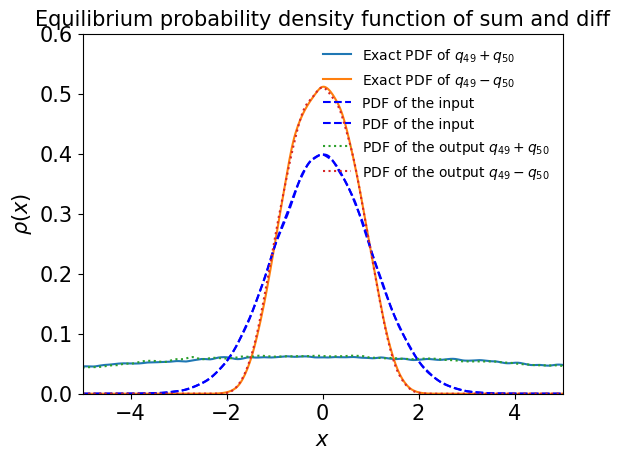

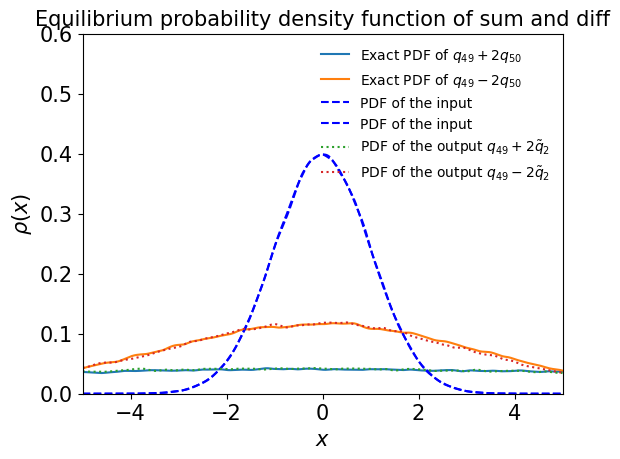

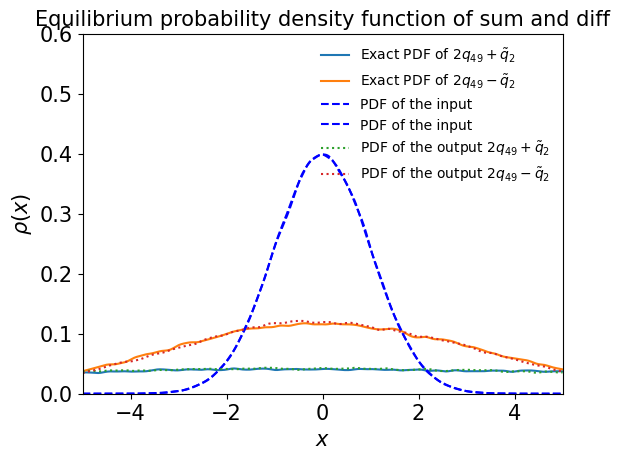

In [71]:
test3(model3)

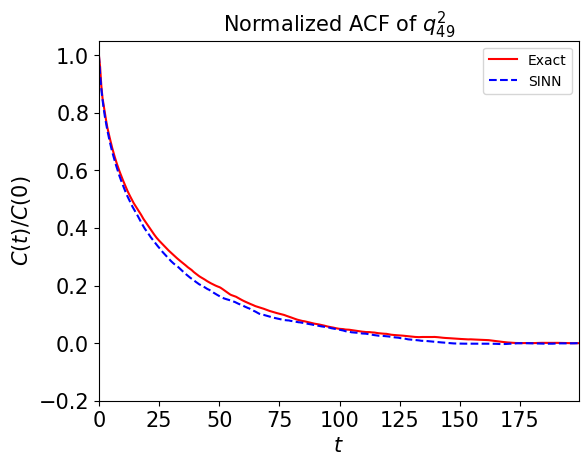

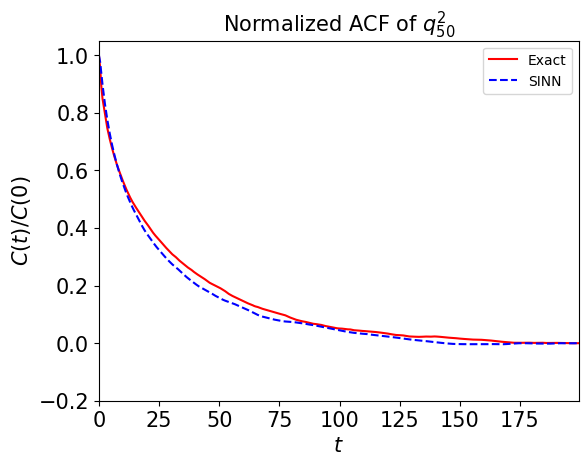

In [72]:
test4(model3)

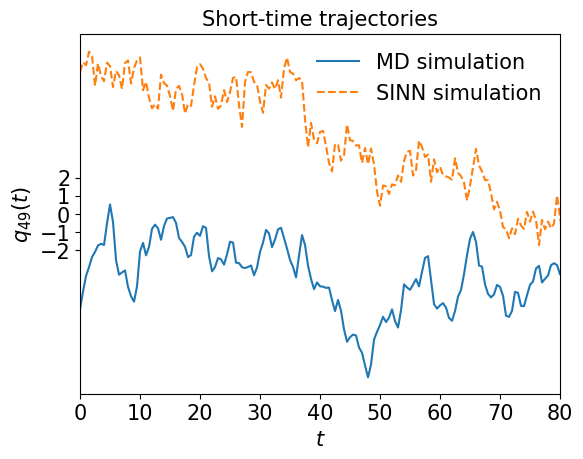

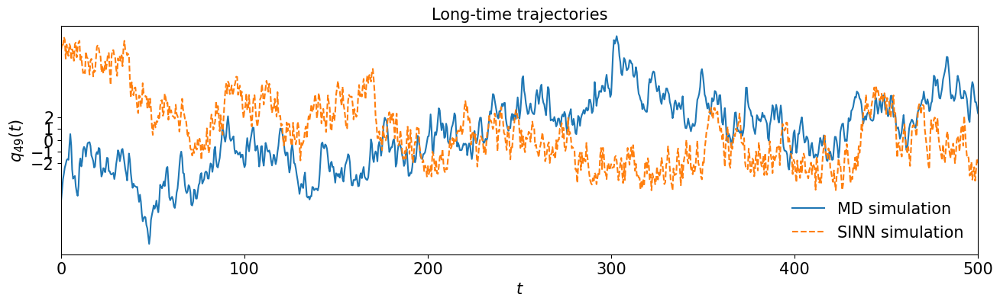

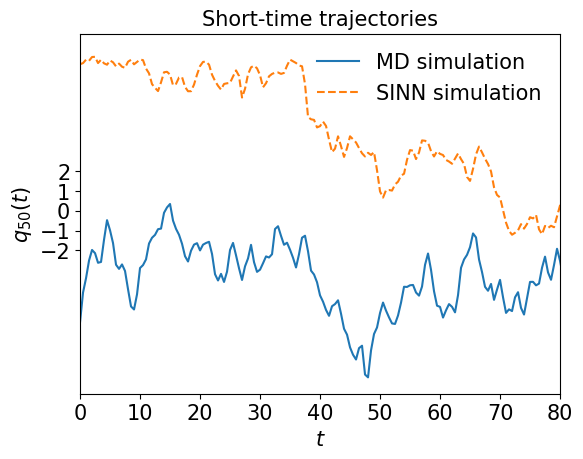

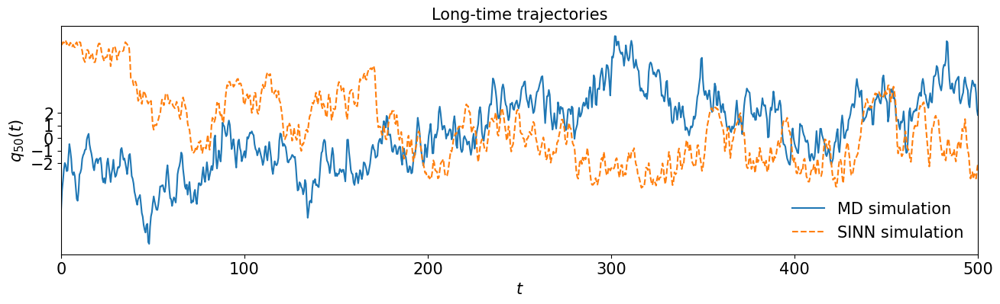

In [73]:
test5(model3)

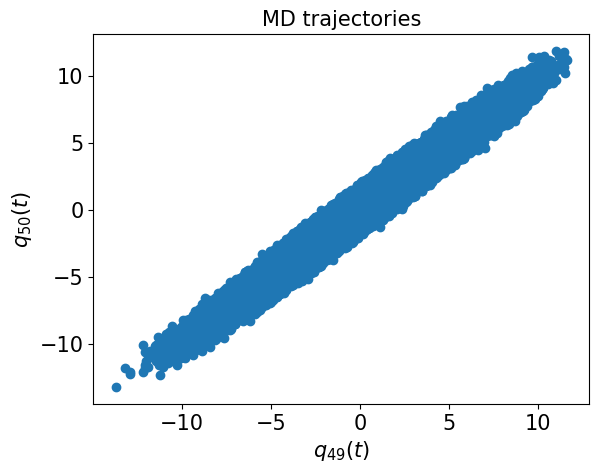

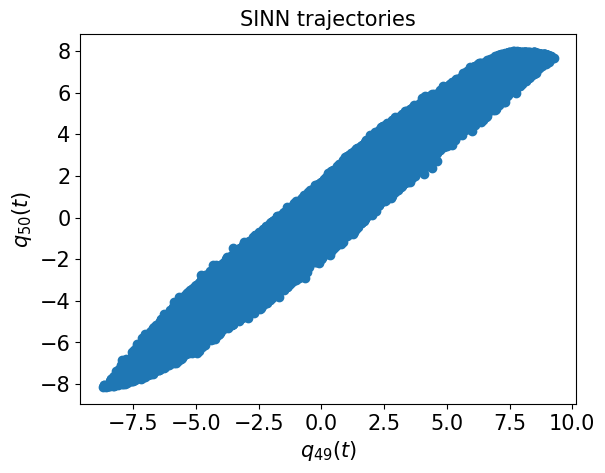

In [74]:
test6(model3)

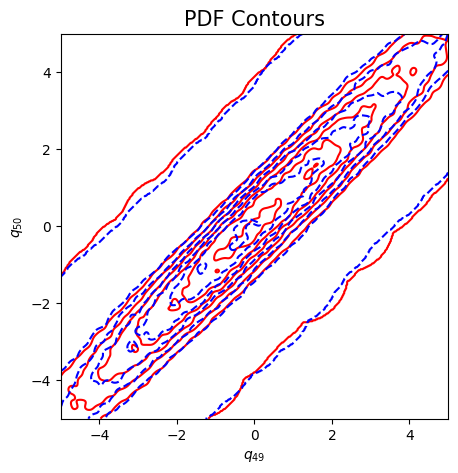

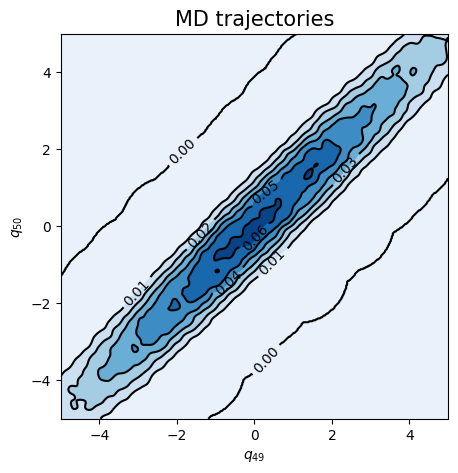

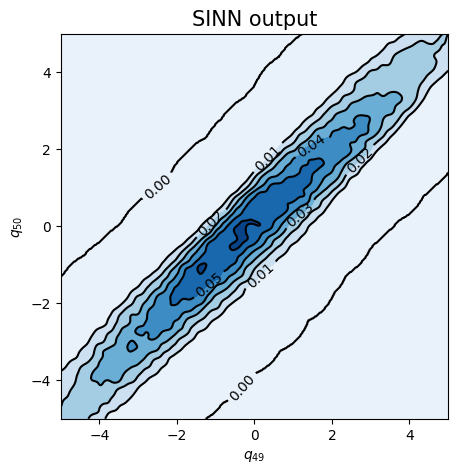

In [75]:
test7(model3)

In [76]:
### Defining SINN model
net4 = SINN(2, 75, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model4 = Model(net=net4)
model4.train()

[0]-th step loss: 0.8550, 0.8326, acf: 0.10277, ccf: 0.10255, pdf: 0.29283, pdf2: 0.28880, acf2: 0.04567
[50]-th step loss: 0.0515, 0.0487, acf: 0.00825, ccf: 0.00821, pdf: 0.01688, pdf2: 0.01125, acf2: 0.00413
[100]-th step loss: 0.0071, 0.0085, acf: 0.00083, ccf: 0.00085, pdf: 0.00284, pdf2: 0.00235, acf2: 0.00159
[150]-th step loss: 0.0042, 0.0071, acf: 0.00135, ccf: 0.00135, pdf: 0.00138, pdf2: 0.00173, acf2: 0.00131
[200]-th step loss: 0.0057, 0.0299, acf: 0.00517, ccf: 0.00522, pdf: 0.00542, pdf2: 0.00340, acf2: 0.01072
[250]-th step loss: 0.0043, 0.0078, acf: 0.00123, ccf: 0.00126, pdf: 0.00186, pdf2: 0.00106, acf2: 0.00238
[300]-th step loss: 0.0052, 0.0053, acf: 0.00055, ccf: 0.00054, pdf: 0.00111, pdf2: 0.00148, acf2: 0.00159
[350]-th step loss: 0.0021, 0.0037, acf: 0.00066, ccf: 0.00068, pdf: 0.00056, pdf2: 0.00054, acf2: 0.00131
[400]-th step loss: 0.0082, 0.0068, acf: 0.00187, ccf: 0.00190, pdf: 0.00067, pdf2: 0.00065, acf2: 0.00167
[450]-th step loss: 0.0351, 0.0306, acf:

[3850]-th step loss: 0.0067, 0.0062, acf: 0.00055, ccf: 0.00035, pdf: 0.00191, pdf2: 0.00278, acf2: 0.00057
[3900]-th step loss: 0.0121, 0.0089, acf: 0.00135, ccf: 0.00089, pdf: 0.00136, pdf2: 0.00439, acf2: 0.00090
[3950]-th step loss: 0.0056, 0.0045, acf: 0.00082, ccf: 0.00049, pdf: 0.00123, pdf2: 0.00156, acf2: 0.00036
[4000]-th step loss: 0.0086, 0.0051, acf: 0.00093, ccf: 0.00061, pdf: 0.00121, pdf2: 0.00178, acf2: 0.00062
[4050]-th step loss: 0.0053, 0.0039, acf: 0.00032, ccf: 0.00014, pdf: 0.00172, pdf2: 0.00119, acf2: 0.00052
[4100]-th step loss: 0.0094, 0.0058, acf: 0.00119, ccf: 0.00091, pdf: 0.00137, pdf2: 0.00130, acf2: 0.00109
[4150]-th step loss: 0.0116, 0.0042, acf: 0.00040, ccf: 0.00028, pdf: 0.00171, pdf2: 0.00132, acf2: 0.00046
[4200]-th step loss: 0.0079, 0.0063, acf: 0.00010, ccf: 0.00008, pdf: 0.00278, pdf2: 0.00269, acf2: 0.00062
[4250]-th step loss: 0.0036, 0.0023, acf: 0.00020, ccf: 0.00011, pdf: 0.00098, pdf2: 0.00089, acf2: 0.00012
[4300]-th step loss: 0.0041,

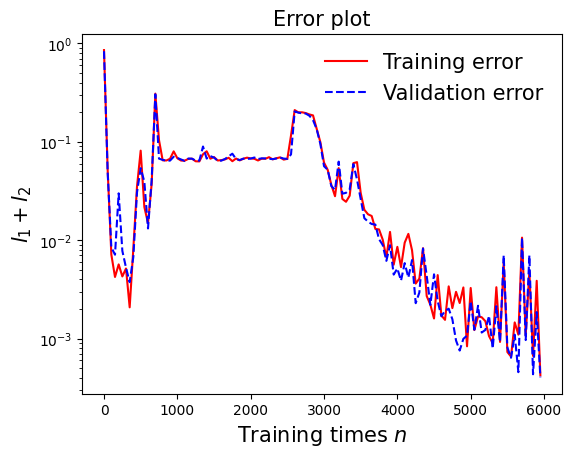

In [77]:
draw_loss(model4)

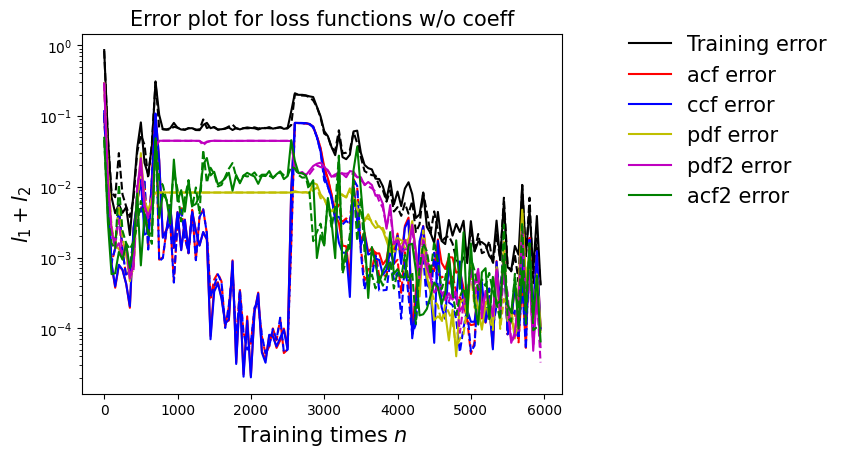

In [78]:
draw_errors(model4)

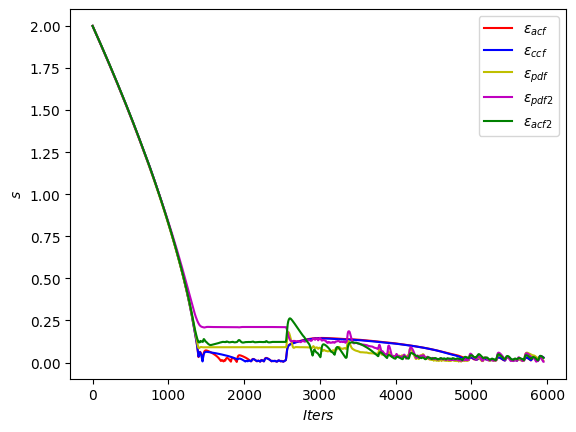

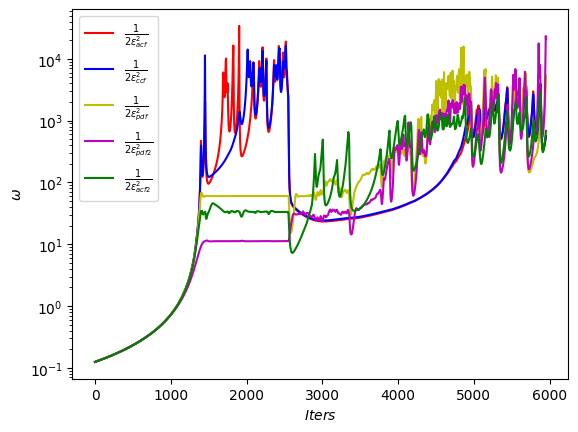

In [79]:
draw_adaptive_w(model4)
draw_epoch_w(model4)

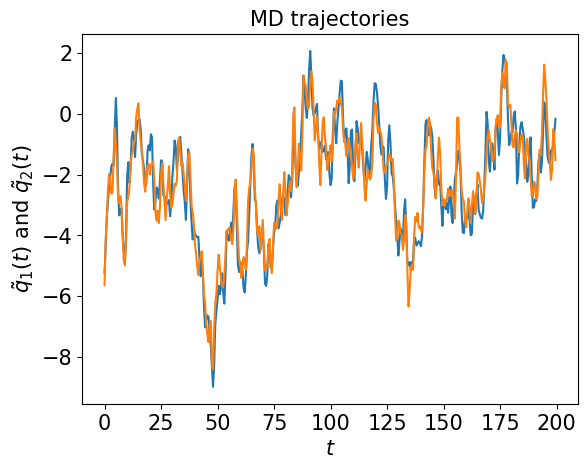

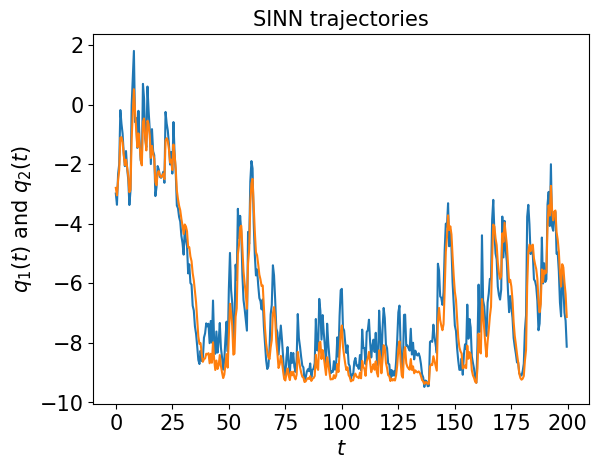

In [80]:
test1(model4)

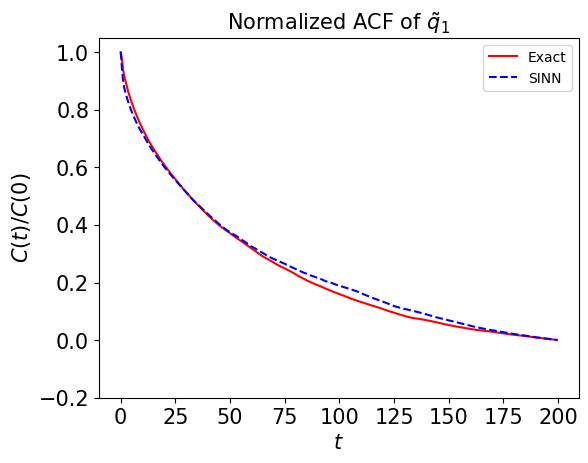

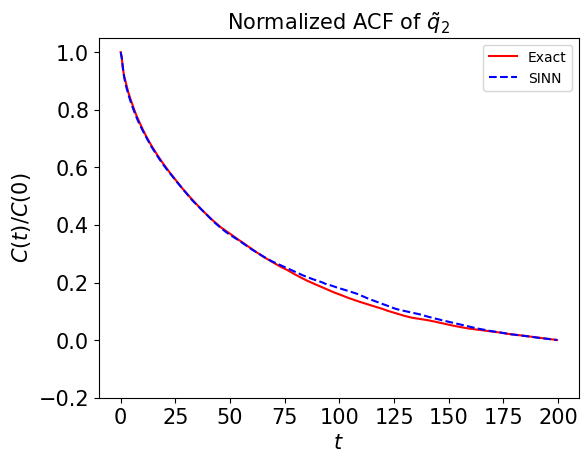

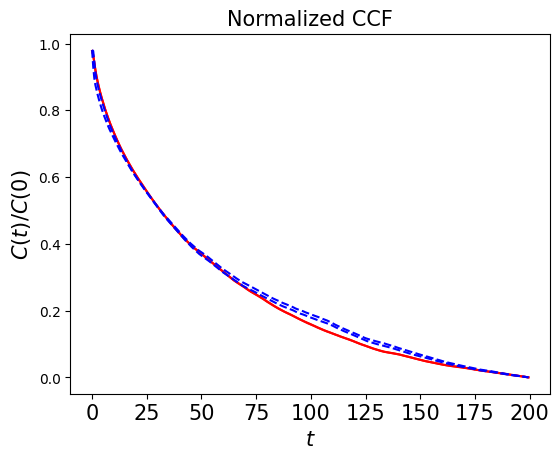

In [81]:
test2(model4)

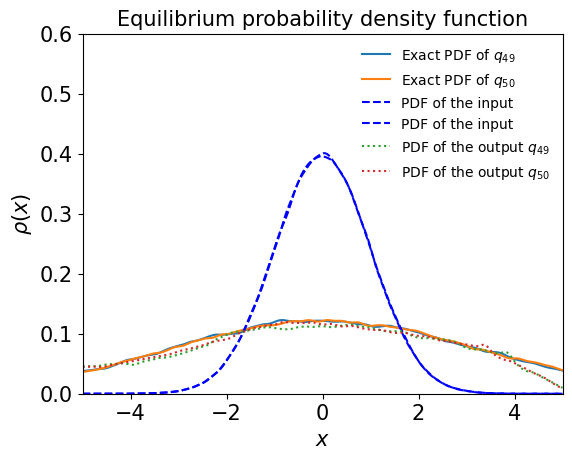

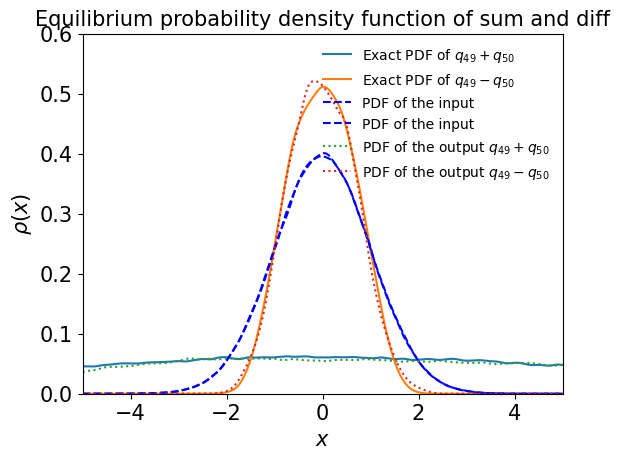

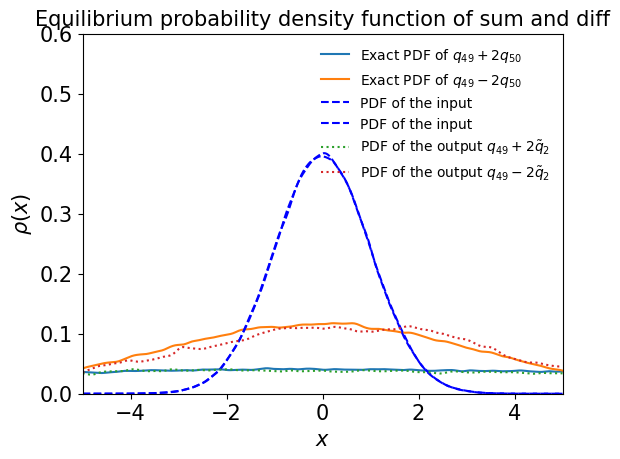

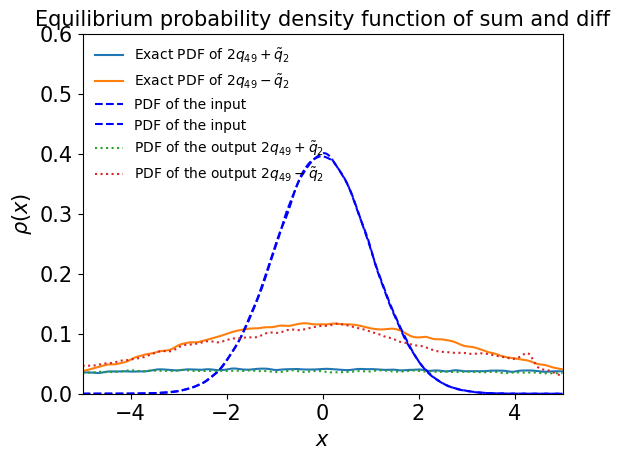

In [82]:
test3(model4)

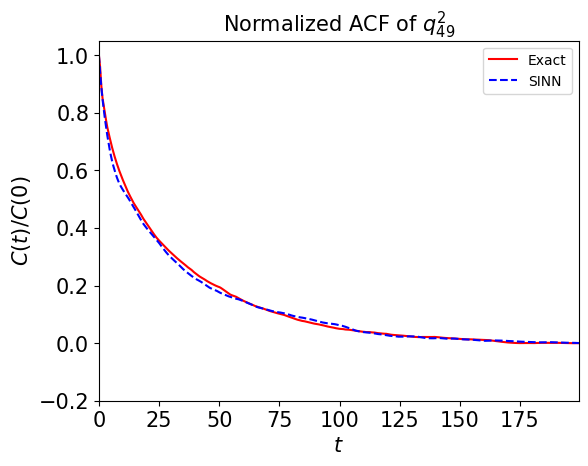

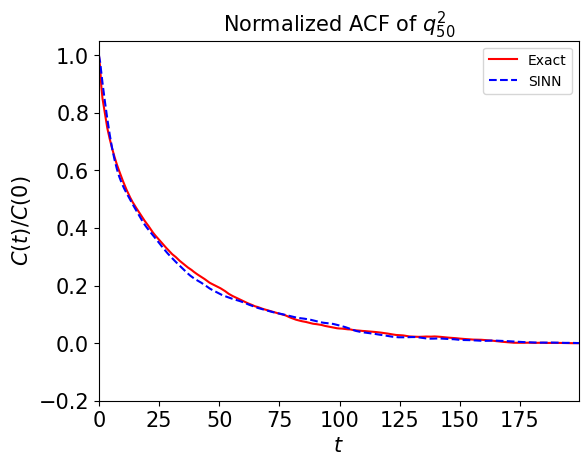

In [83]:
test4(model4)

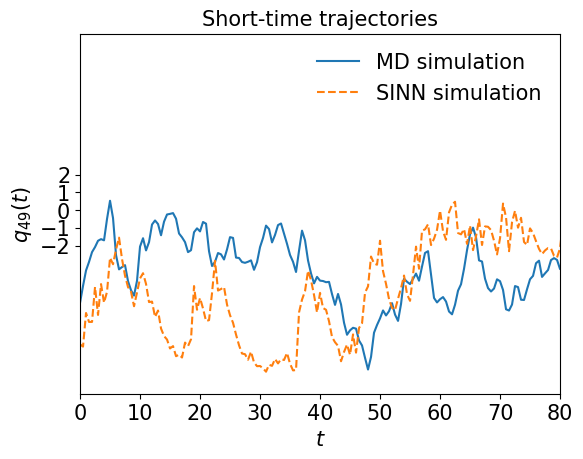

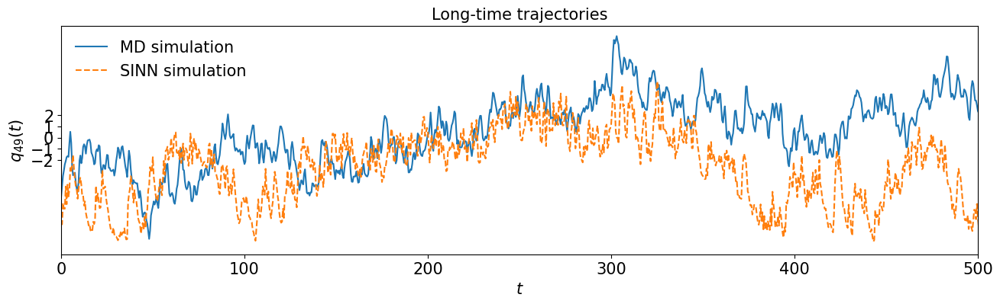

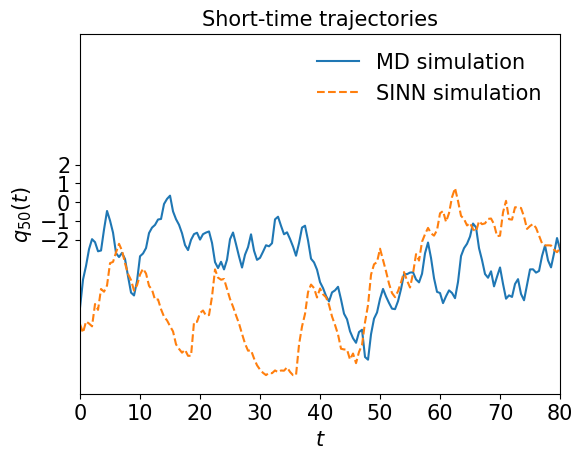

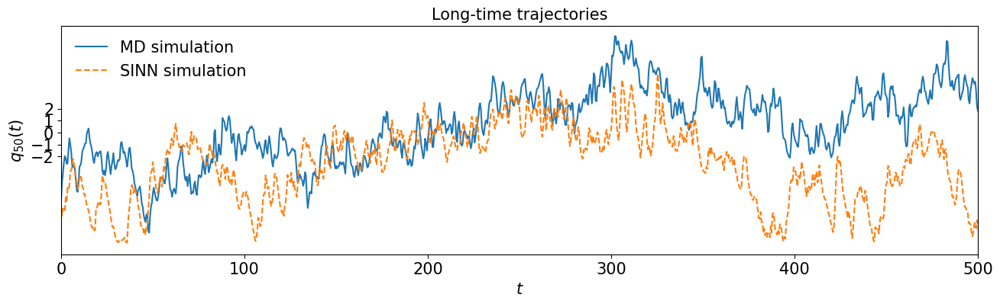

In [84]:
test5(model4)

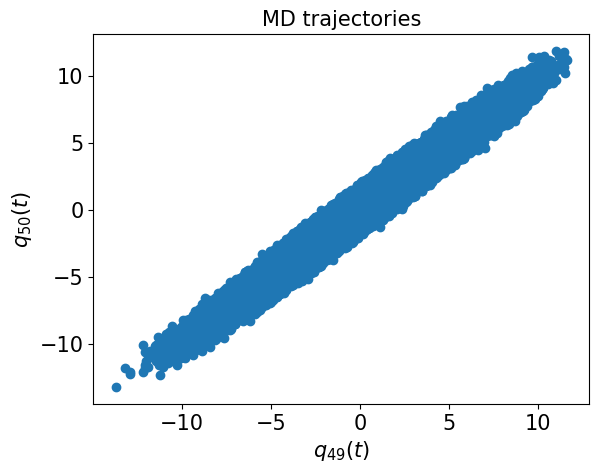

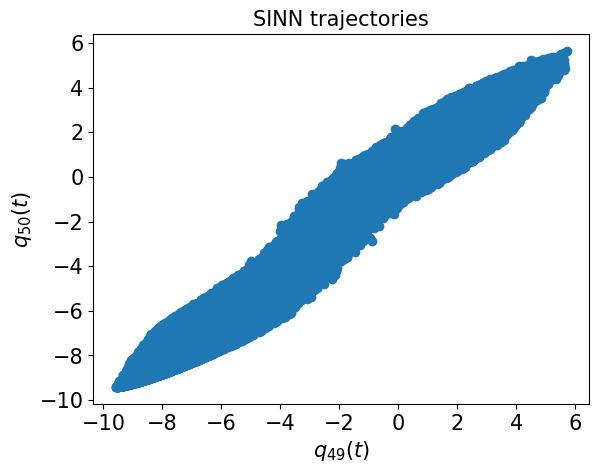

In [85]:
test6(model4)

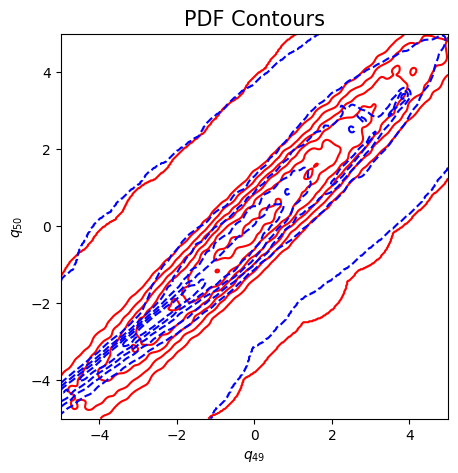

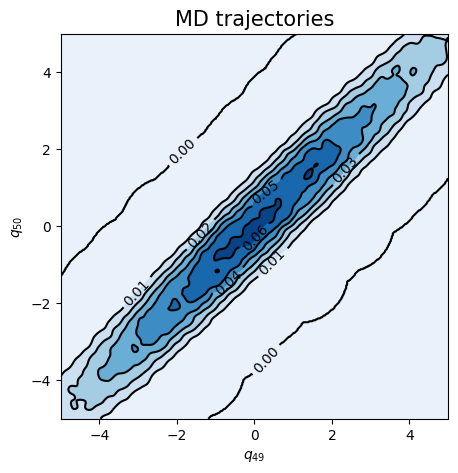

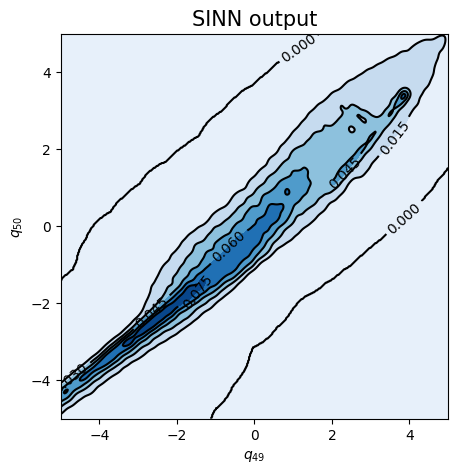

In [86]:
test7(model4)

In [87]:
### Defining SINN model
net5 = SINN(2, 75, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model5 = Model(net=net5)
model5.train()

[0]-th step loss: 0.8445, 0.8287, acf: 0.10091, ccf: 0.10094, pdf: 0.29310, pdf2: 0.28948, acf2: 0.04423
[50]-th step loss: 0.0586, 0.0519, acf: 0.00391, ccf: 0.00389, pdf: 0.02600, pdf2: 0.01719, acf2: 0.00091
[100]-th step loss: 0.0308, 0.0219, acf: 0.00128, ccf: 0.00130, pdf: 0.00994, pdf2: 0.00851, acf2: 0.00087
[150]-th step loss: 0.0150, 0.0195, acf: 0.00203, ccf: 0.00193, pdf: 0.00614, pdf2: 0.00758, acf2: 0.00184
[200]-th step loss: 0.0405, 0.0306, acf: 0.00590, ccf: 0.00589, pdf: 0.00741, pdf2: 0.00944, acf2: 0.00199
[250]-th step loss: 0.0081, 0.0086, acf: 0.00064, ccf: 0.00034, pdf: 0.00302, pdf2: 0.00343, acf2: 0.00120
[300]-th step loss: 0.0061, 0.0068, acf: 0.00065, ccf: 0.00040, pdf: 0.00259, pdf2: 0.00248, acf2: 0.00073
[350]-th step loss: 0.0159, 0.0108, acf: 0.00050, ccf: 0.00039, pdf: 0.00367, pdf2: 0.00264, acf2: 0.00358
[400]-th step loss: 0.0190, 0.0207, acf: 0.00401, ccf: 0.00408, pdf: 0.00511, pdf2: 0.00380, acf2: 0.00374
[450]-th step loss: 0.0065, 0.0073, acf:

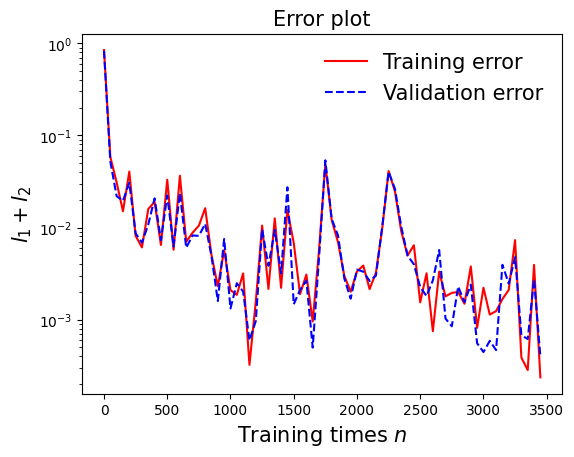

In [88]:
draw_loss(model5)

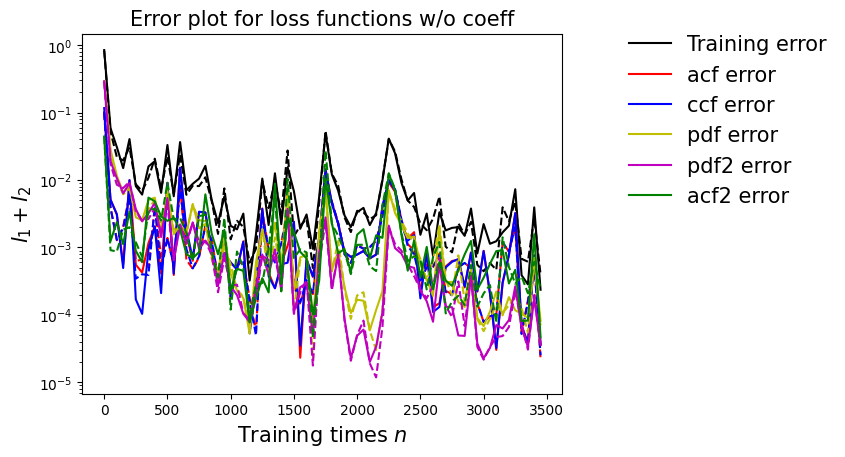

In [89]:
draw_errors(model5)

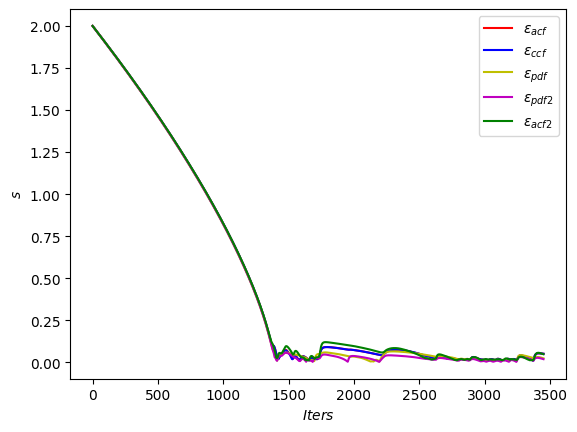

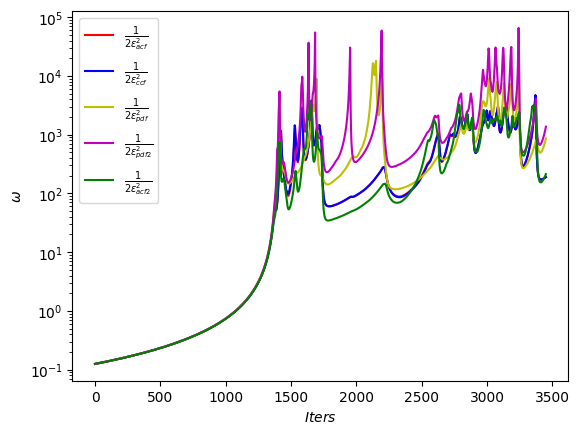

In [90]:
draw_adaptive_w(model5)
draw_epoch_w(model5)

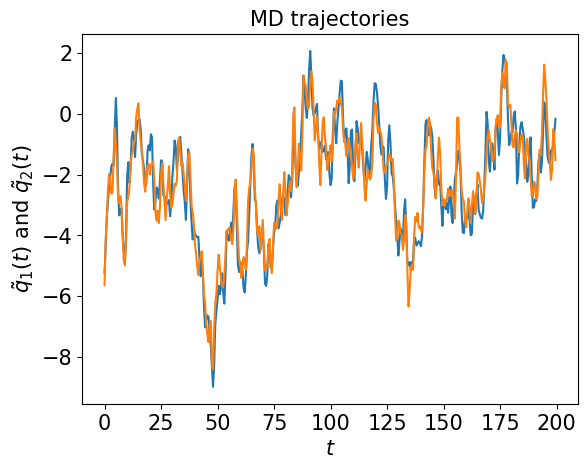

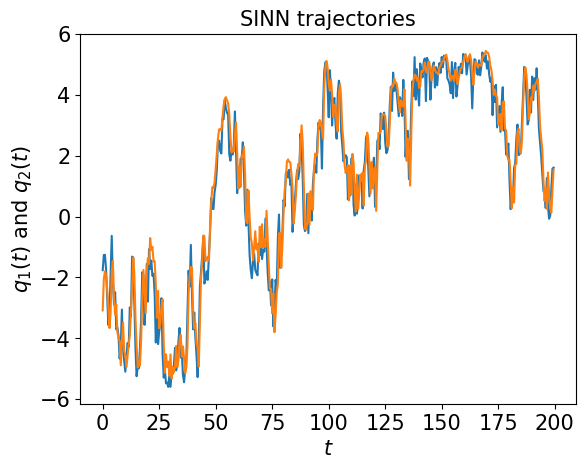

In [91]:
test1(model5)

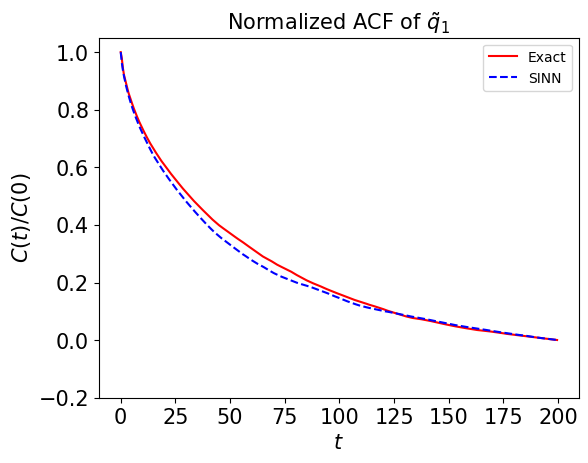

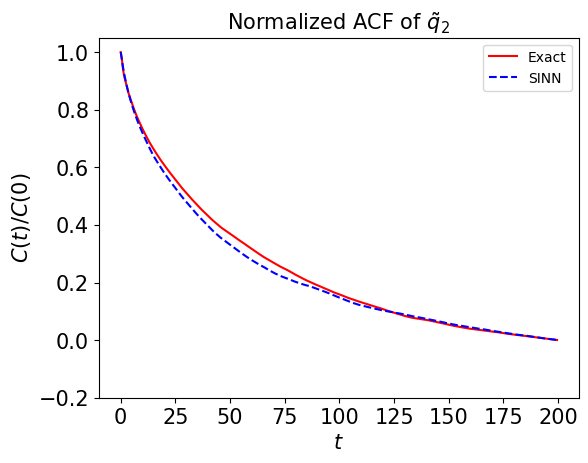

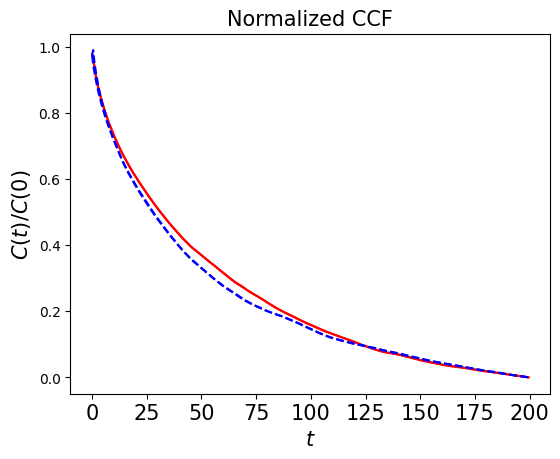

In [92]:
test2(model5)

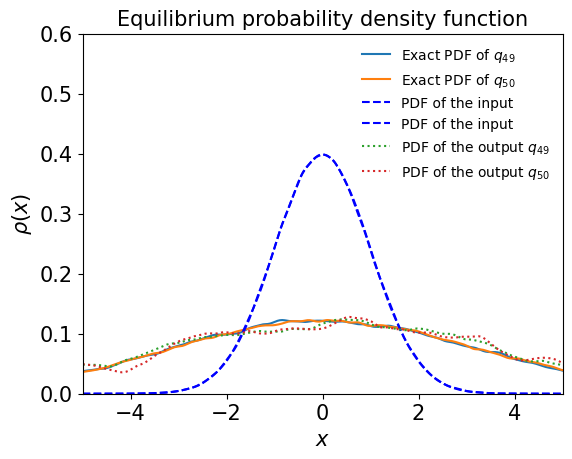

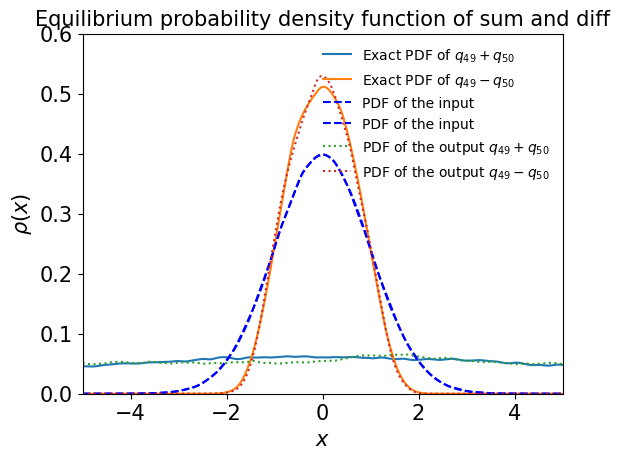

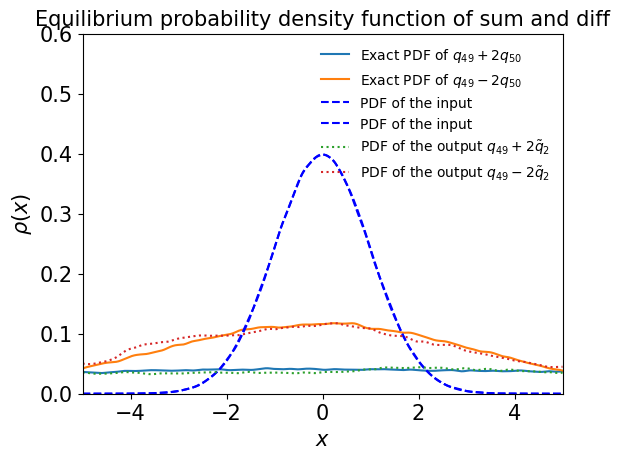

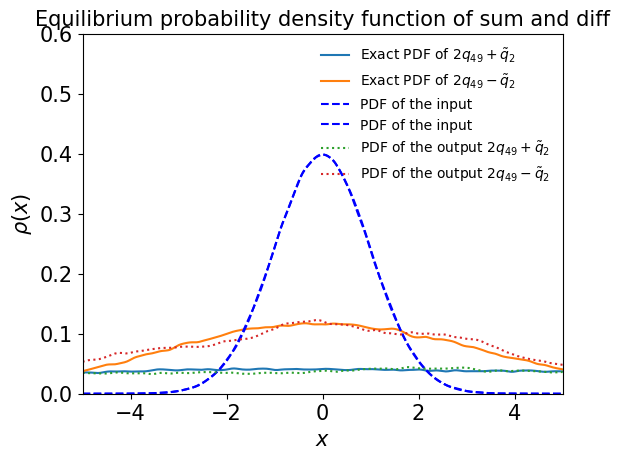

In [93]:
test3(model5)

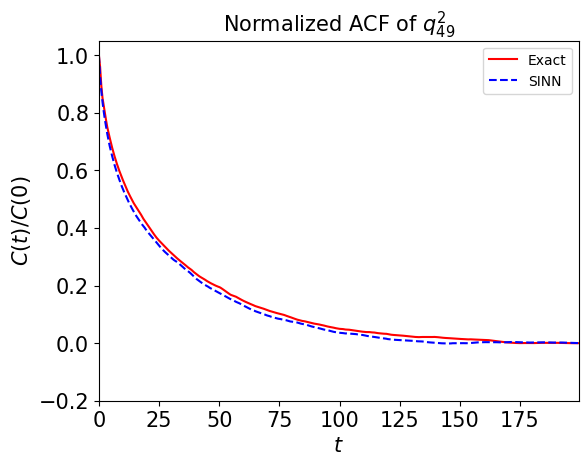

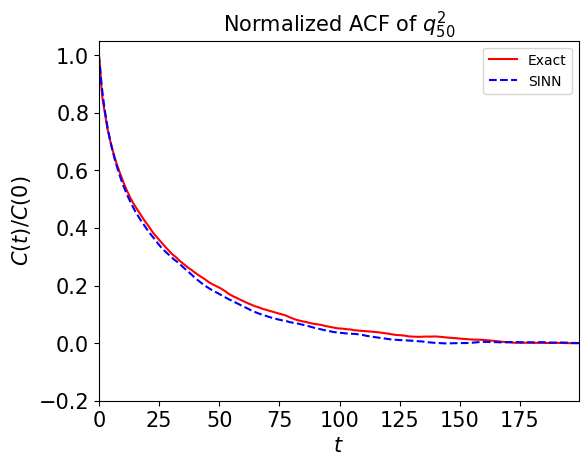

In [94]:
test4(model5)

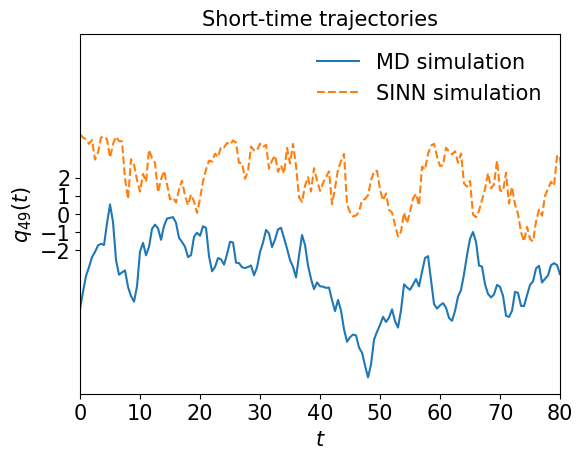

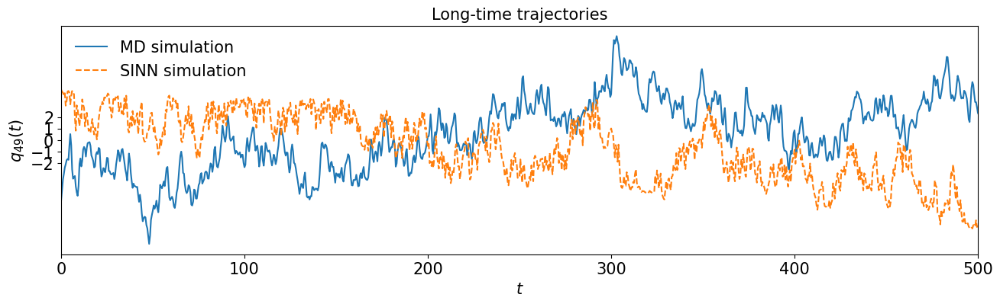

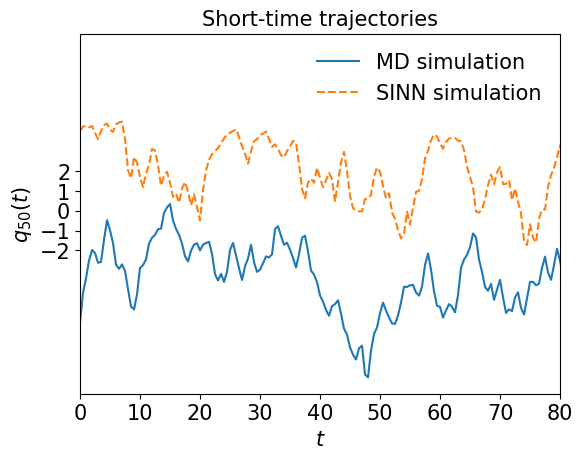

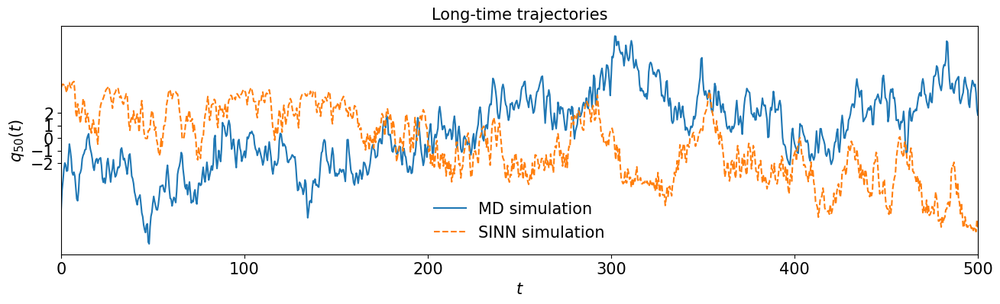

In [95]:
test5(model5)

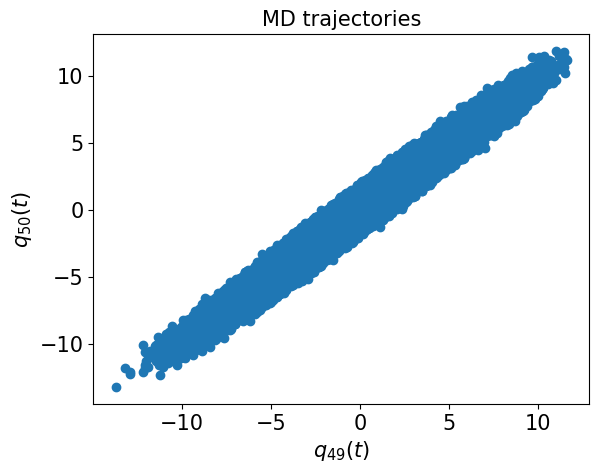

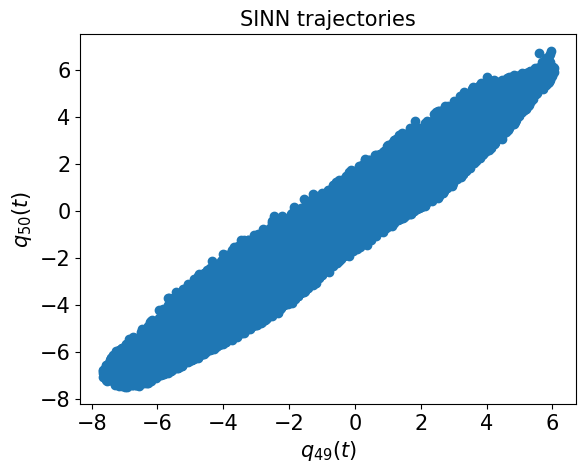

In [96]:
test6(model5)

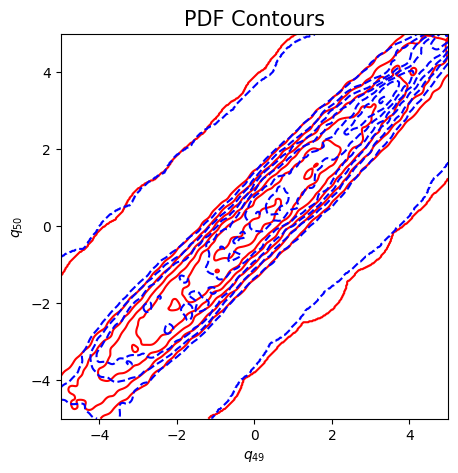

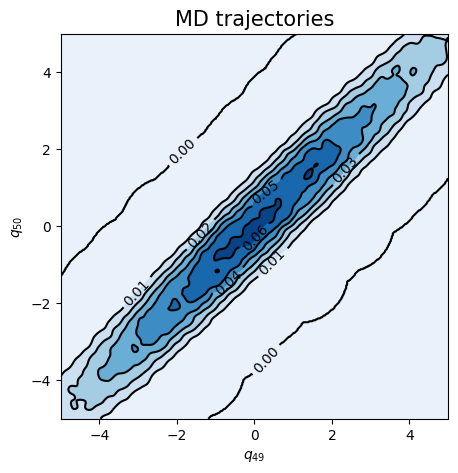

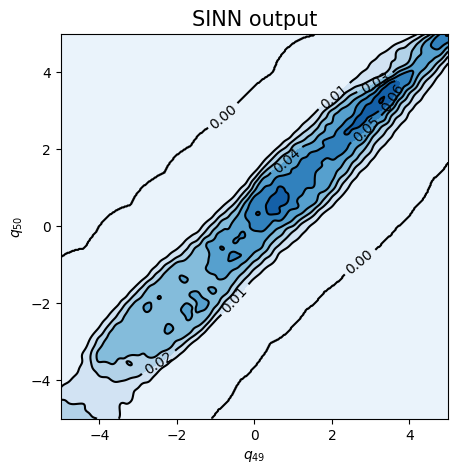

In [97]:
test7(model5)

In [98]:
### Defining SINN model
net6 = SINN(2, 75, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model6 = Model(net=net6)
model6.train()

[0]-th step loss: 0.8467, 0.8303, acf: 0.10189, ccf: 0.10153, pdf: 0.29295, pdf2: 0.28887, acf2: 0.04502
[50]-th step loss: 0.1186, 0.1168, acf: 0.04082, ccf: 0.04073, pdf: 0.01439, pdf2: 0.01255, acf2: 0.00832
[100]-th step loss: 0.0121, 0.0101, acf: 0.00069, ccf: 0.00070, pdf: 0.00418, pdf2: 0.00404, acf2: 0.00050
[150]-th step loss: 0.0084, 0.0084, acf: 0.00142, ccf: 0.00142, pdf: 0.00201, pdf2: 0.00225, acf2: 0.00128
[200]-th step loss: 0.0036, 0.0082, acf: 0.00135, ccf: 0.00138, pdf: 0.00187, pdf2: 0.00182, acf2: 0.00180
[250]-th step loss: 0.0036, 0.0061, acf: 0.00091, ccf: 0.00094, pdf: 0.00125, pdf2: 0.00137, acf2: 0.00158
[300]-th step loss: 0.0023, 0.0025, acf: 0.00012, ccf: 0.00013, pdf: 0.00055, pdf2: 0.00074, acf2: 0.00091
[350]-th step loss: 0.0205, 0.0047, acf: 0.00105, ccf: 0.00103, pdf: 0.00073, pdf2: 0.00106, acf2: 0.00086
[400]-th step loss: 0.0033, 0.0060, acf: 0.00070, ccf: 0.00072, pdf: 0.00061, pdf2: 0.00136, acf2: 0.00263
[450]-th step loss: 0.0368, 0.0134, acf:

[3850]-th step loss: 0.0680, 0.0678, acf: 0.00002, ccf: 0.00002, pdf: 0.00828, pdf2: 0.04458, acf2: 0.01494
[3900]-th step loss: 0.0671, 0.0676, acf: 0.00005, ccf: 0.00005, pdf: 0.00828, pdf2: 0.04457, acf2: 0.01464
[3950]-th step loss: 0.0725, 0.0658, acf: 0.00024, ccf: 0.00023, pdf: 0.00829, pdf2: 0.04459, acf2: 0.01249
[4000]-th step loss: 0.0703, 0.0671, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04455, acf2: 0.01423
[4050]-th step loss: 0.0635, 0.0638, acf: 0.00074, ccf: 0.00072, pdf: 0.00829, pdf2: 0.04462, acf2: 0.00946
[4100]-th step loss: 0.0705, 0.0675, acf: 0.00001, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04451, acf2: 0.01465
[4150]-th step loss: 0.0688, 0.0688, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04452, acf2: 0.01593
[4200]-th step loss: 0.0719, 0.0702, acf: 0.00010, ccf: 0.00011, pdf: 0.00829, pdf2: 0.04450, acf2: 0.01722
[4250]-th step loss: 0.0714, 0.0689, acf: 0.00005, ccf: 0.00006, pdf: 0.00829, pdf2: 0.04453, acf2: 0.01594
[4300]-th step loss: 0.0706,

[7650]-th step loss: 0.0641, 0.0655, acf: 0.00011, ccf: 0.00011, pdf: 0.00829, pdf2: 0.04448, acf2: 0.01254
[7700]-th step loss: 0.0647, 0.0647, acf: 0.00026, ccf: 0.00025, pdf: 0.00829, pdf2: 0.04446, acf2: 0.01143
[7750]-th step loss: 0.0698, 0.0678, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04448, acf2: 0.01497
[7800]-th step loss: 0.0667, 0.0701, acf: 0.00009, ccf: 0.00010, pdf: 0.00829, pdf2: 0.04447, acf2: 0.01715
[7850]-th step loss: 0.0657, 0.0697, acf: 0.00007, ccf: 0.00008, pdf: 0.00829, pdf2: 0.04446, acf2: 0.01682
[7900]-th step loss: 0.0707, 0.0680, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04449, acf2: 0.01513
[7950]-th step loss: 0.0747, 0.0670, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04448, acf2: 0.01412
[8000]-th step loss: 0.0694, 0.0666, acf: 0.00005, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04447, acf2: 0.01372
[8050]-th step loss: 0.0665, 0.0671, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04444, acf2: 0.01427
[8100]-th step loss: 0.0642,

[11450]-th step loss: 0.0667, 0.0663, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.04439, acf2: 0.01348
[11500]-th step loss: 0.0658, 0.0675, acf: 0.00001, ccf: 0.00001, pdf: 0.00829, pdf2: 0.04440, acf2: 0.01480
[11550]-th step loss: 0.0661, 0.0659, acf: 0.00007, ccf: 0.00006, pdf: 0.00829, pdf2: 0.04441, acf2: 0.01307
[11600]-th step loss: 0.0693, 0.0674, acf: 0.00001, ccf: 0.00001, pdf: 0.00828, pdf2: 0.04444, acf2: 0.01470
[11650]-th step loss: 0.0677, 0.0679, acf: 0.00001, ccf: 0.00001, pdf: 0.00828, pdf2: 0.04447, acf2: 0.01517
[11700]-th step loss: 0.0659, 0.0669, acf: 0.00002, ccf: 0.00002, pdf: 0.00828, pdf2: 0.04448, acf2: 0.01414
[11750]-th step loss: 0.0667, 0.0673, acf: 0.00001, ccf: 0.00001, pdf: 0.00828, pdf2: 0.04446, acf2: 0.01456
[11800]-th step loss: 0.0647, 0.0667, acf: 0.00003, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04447, acf2: 0.01387
[11850]-th step loss: 0.0700, 0.0674, acf: 0.00002, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04442, acf2: 0.01460
[11900]-th step los

[15250]-th step loss: 0.0697, 0.0654, acf: 0.00017, ccf: 0.00016, pdf: 0.00829, pdf2: 0.04472, acf2: 0.01208
[15300]-th step loss: 0.0654, 0.0663, acf: 0.00010, ccf: 0.00009, pdf: 0.00829, pdf2: 0.04472, acf2: 0.01309
[15350]-th step loss: 0.0680, 0.0695, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.04471, acf2: 0.01637
[15400]-th step loss: 0.0693, 0.0685, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04471, acf2: 0.01540
[15450]-th step loss: 0.0644, 0.0684, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04470, acf2: 0.01531
[15500]-th step loss: 0.0676, 0.0686, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04470, acf2: 0.01556
[15550]-th step loss: 0.0665, 0.0667, acf: 0.00017, ccf: 0.00016, pdf: 0.00829, pdf2: 0.04469, acf2: 0.01339
[15600]-th step loss: 0.0712, 0.0668, acf: 0.00012, ccf: 0.00011, pdf: 0.00829, pdf2: 0.04468, acf2: 0.01362
[15650]-th step loss: 0.0725, 0.0658, acf: 0.00025, ccf: 0.00024, pdf: 0.00829, pdf2: 0.04468, acf2: 0.01230
[15700]-th step los

[19050]-th step loss: 0.0643, 0.0676, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04441, acf2: 0.01481
[19100]-th step loss: 0.0643, 0.0688, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.04441, acf2: 0.01601
[19150]-th step loss: 0.0661, 0.0670, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04437, acf2: 0.01431
[19200]-th step loss: 0.0679, 0.0671, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.04437, acf2: 0.01433
[19250]-th step loss: 0.0744, 0.0690, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.04436, acf2: 0.01626
[19300]-th step loss: 0.0659, 0.0665, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04433, acf2: 0.01383
[19350]-th step loss: 0.0670, 0.0669, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04433, acf2: 0.01426
[19400]-th step loss: 0.0646, 0.0673, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04433, acf2: 0.01460
[19450]-th step loss: 0.0673, 0.0656, acf: 0.00010, ccf: 0.00009, pdf: 0.00829, pdf2: 0.04432, acf2: 0.01285
[19500]-th step los

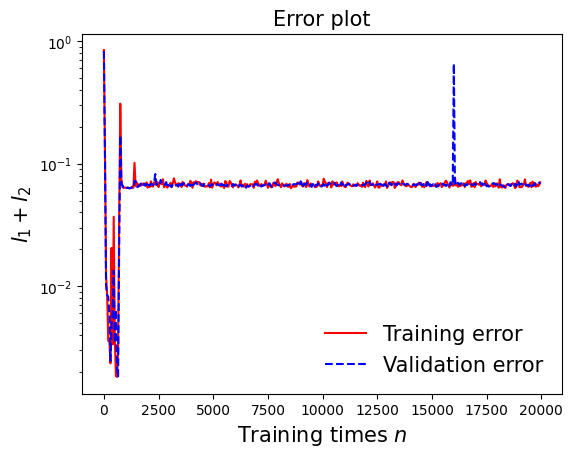

In [99]:
draw_loss(model6)

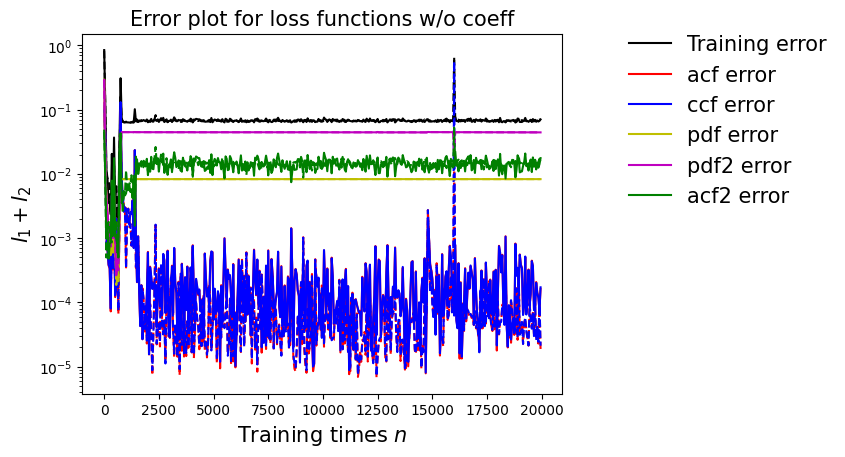

In [100]:
draw_errors(model6)

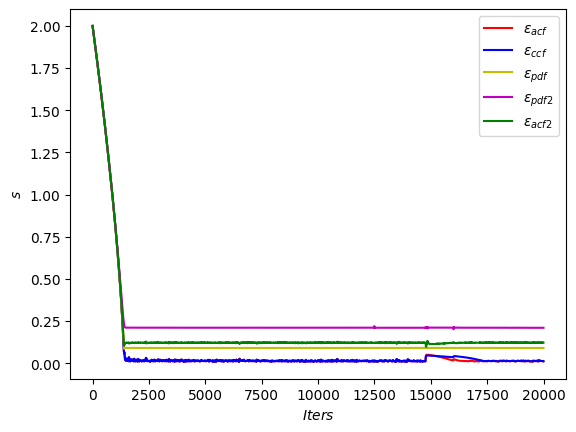

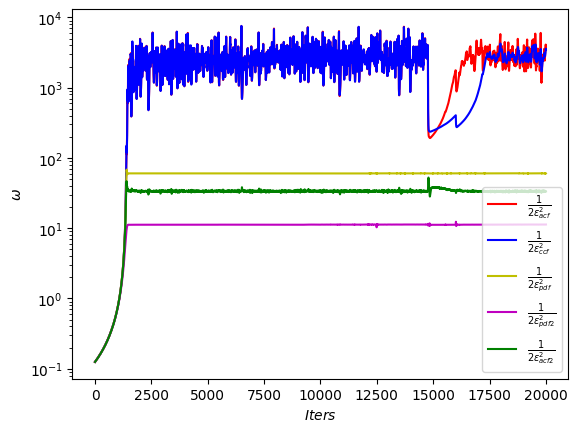

In [101]:
draw_adaptive_w(model6)
draw_epoch_w(model6)

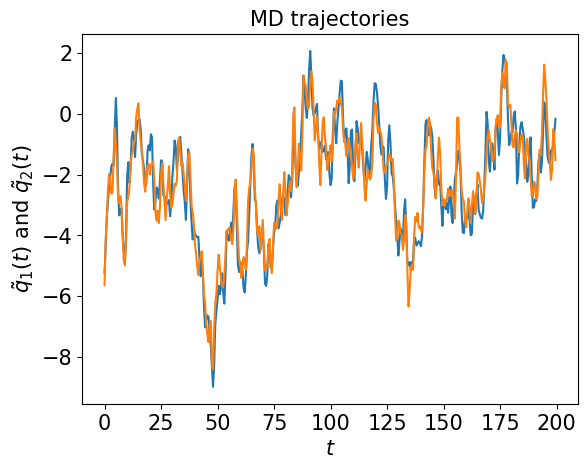

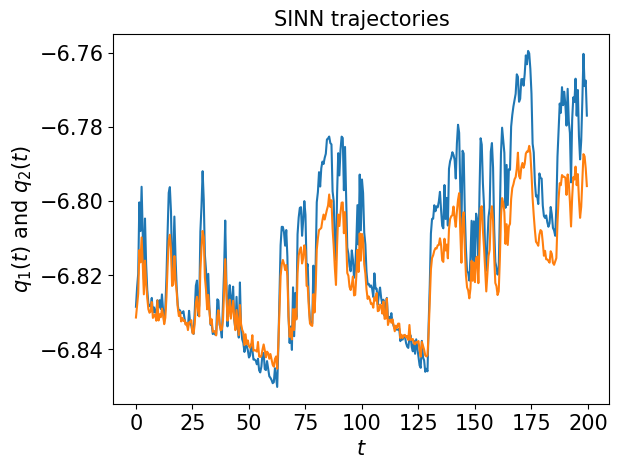

In [102]:
test1(model6)

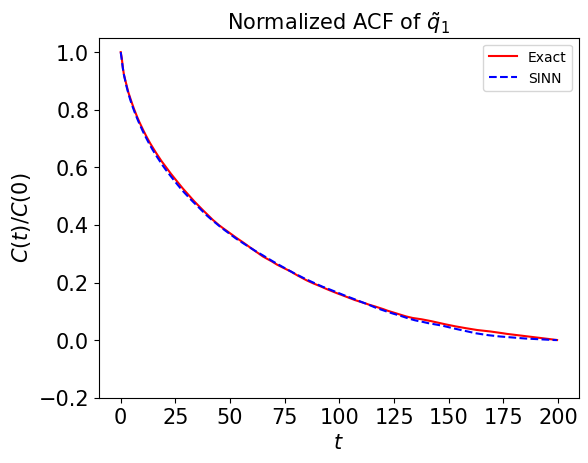

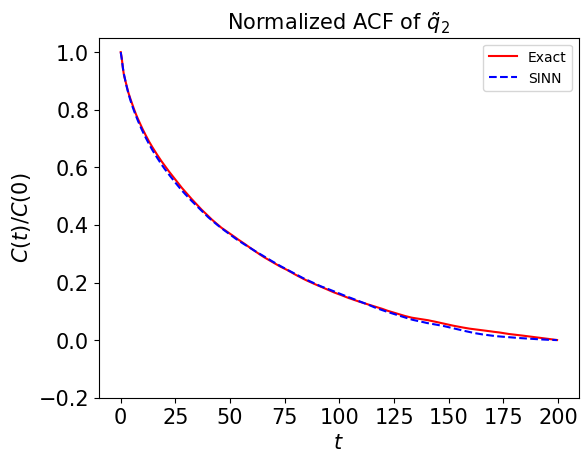

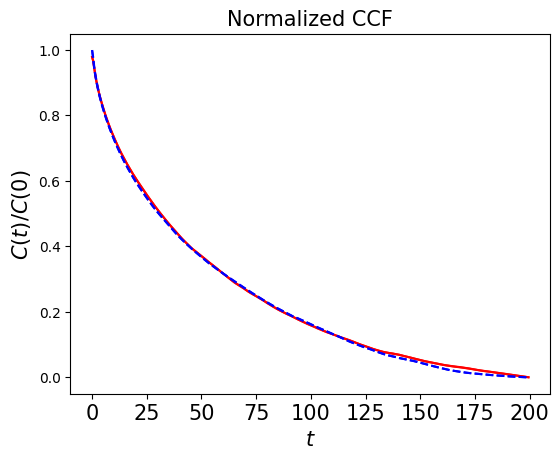

In [103]:
test2(model6)

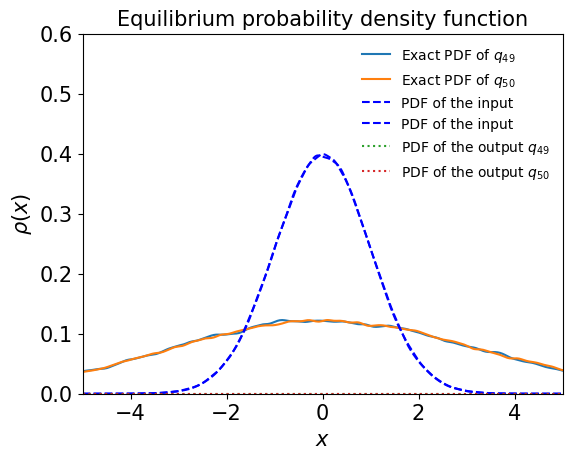

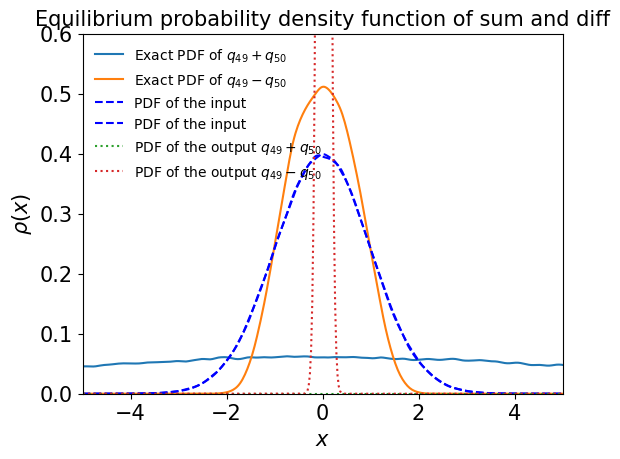

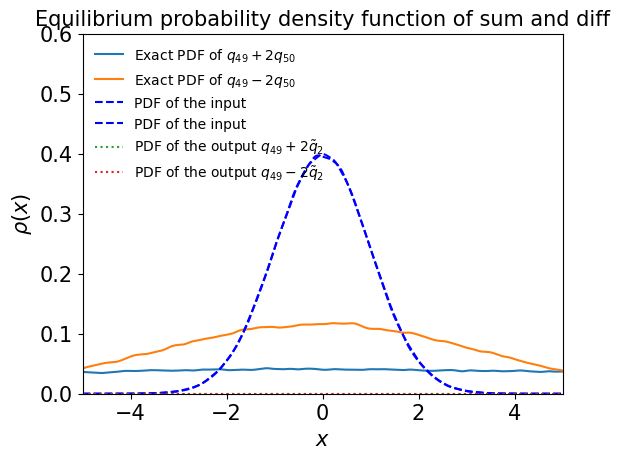

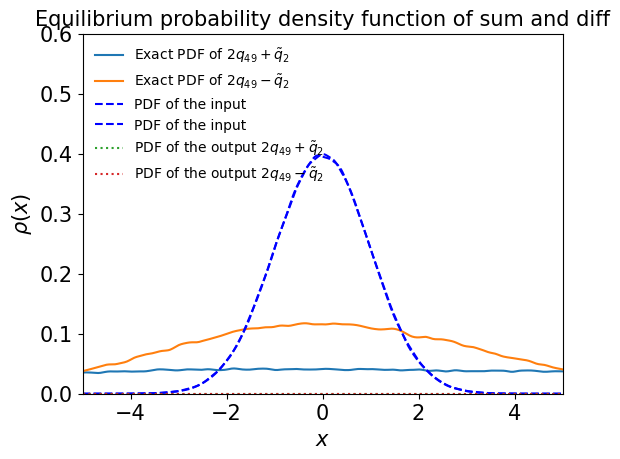

In [104]:
test3(model6)

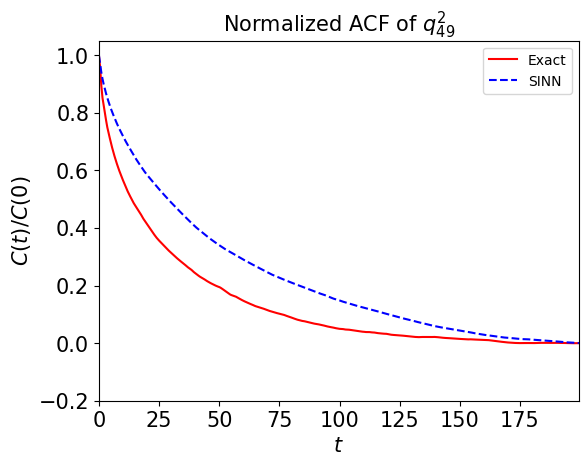

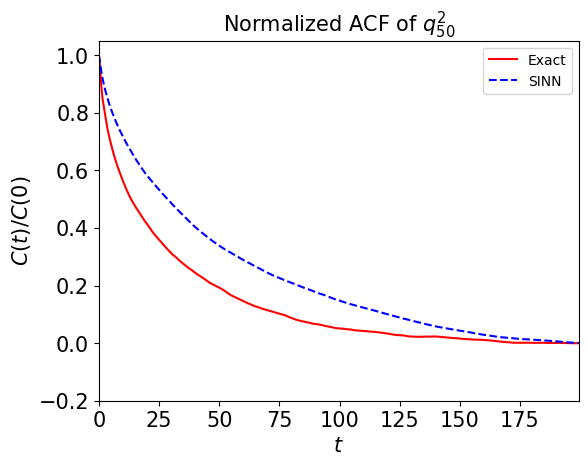

In [105]:
test4(model6)

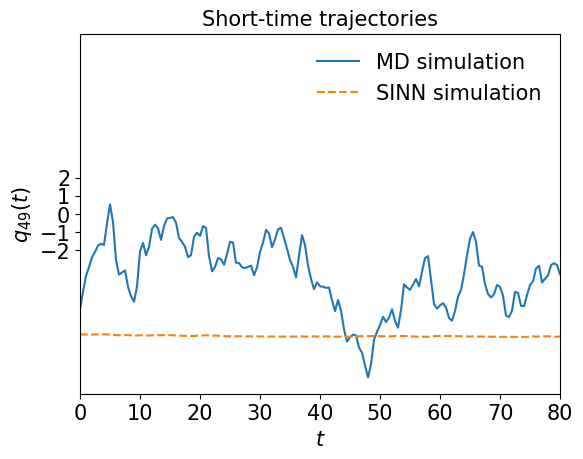

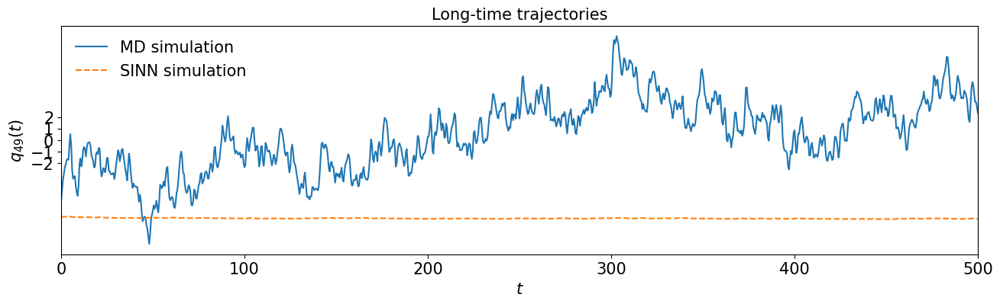

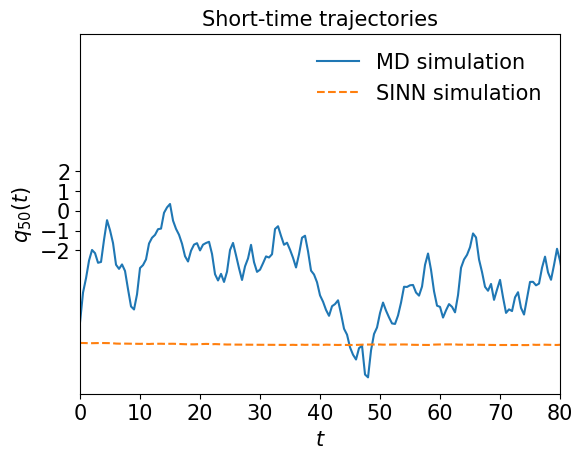

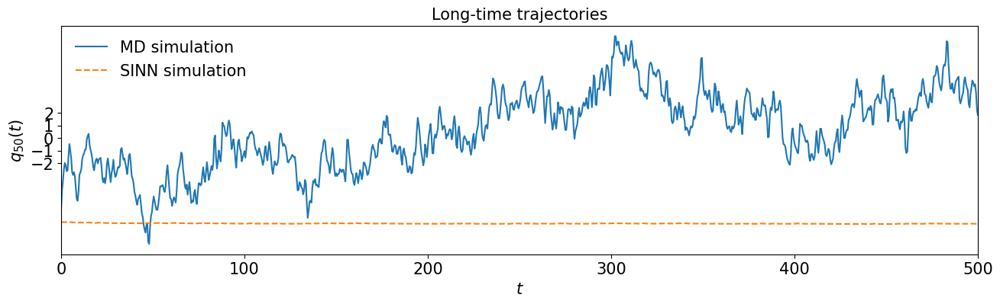

In [106]:
test5(model6)

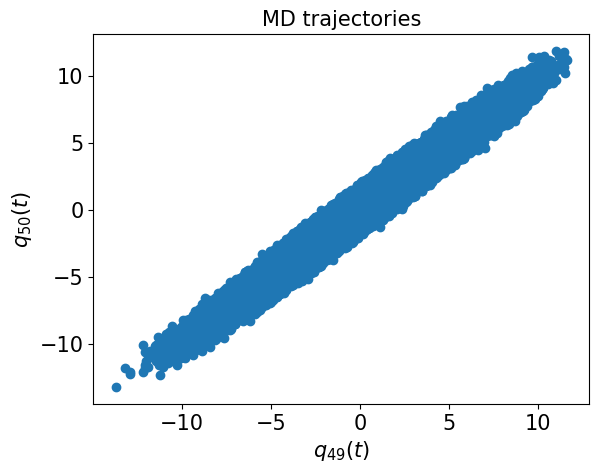

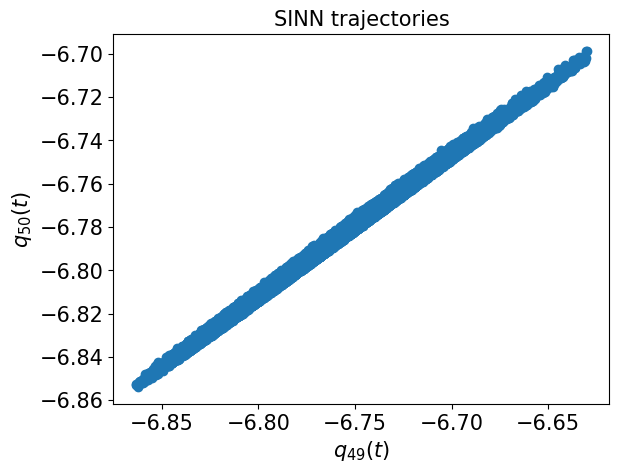

In [107]:
test6(model6)

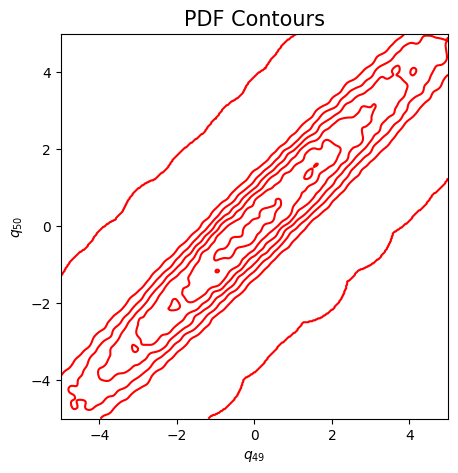

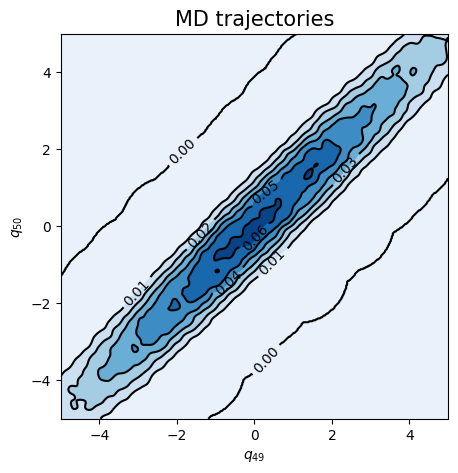

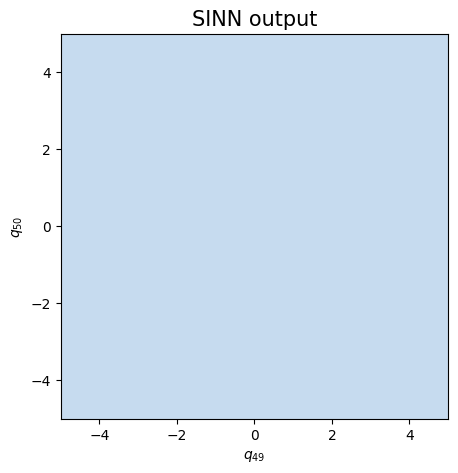

In [108]:
test7(model6)

In [109]:
### Defining SINN model
net7 = SINN(2, 75, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model7 = Model(net=net7)
model7.train()

[0]-th step loss: 0.8597, 0.8288, acf: 0.10102, ccf: 0.10071, pdf: 0.29299, pdf2: 0.28976, acf2: 0.04434
[50]-th step loss: 0.0556, 0.0527, acf: 0.00204, ccf: 0.00206, pdf: 0.02594, pdf2: 0.02171, acf2: 0.00093
[100]-th step loss: 0.0118, 0.0125, acf: 0.00179, ccf: 0.00179, pdf: 0.00334, pdf2: 0.00348, acf2: 0.00206
[150]-th step loss: 0.0081, 0.0068, acf: 0.00078, ccf: 0.00079, pdf: 0.00191, pdf2: 0.00221, acf2: 0.00116
[200]-th step loss: 0.0053, 0.0041, acf: 0.00037, ccf: 0.00038, pdf: 0.00116, pdf2: 0.00135, acf2: 0.00080
[250]-th step loss: 0.0036, 0.0031, acf: 0.00021, ccf: 0.00022, pdf: 0.00073, pdf2: 0.00095, acf2: 0.00100
[300]-th step loss: 0.0047, 0.0048, acf: 0.00056, ccf: 0.00057, pdf: 0.00142, pdf2: 0.00129, acf2: 0.00097
[350]-th step loss: 0.0037, 0.0045, acf: 0.00091, ccf: 0.00090, pdf: 0.00036, pdf2: 0.00078, acf2: 0.00160
[400]-th step loss: 0.0022, 0.0029, acf: 0.00021, ccf: 0.00022, pdf: 0.00059, pdf2: 0.00107, acf2: 0.00077
[450]-th step loss: 0.0065, 0.0061, acf:

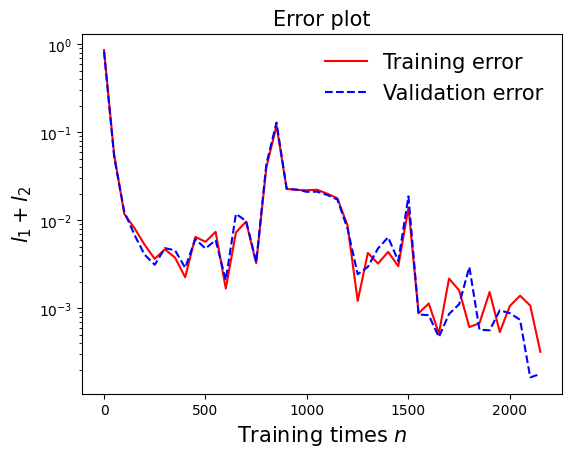

In [110]:
draw_loss(model7)

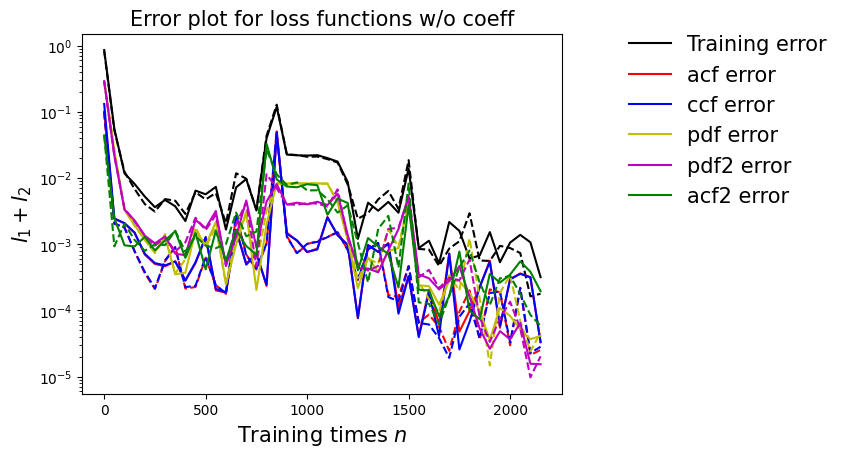

In [111]:
draw_errors(model7)

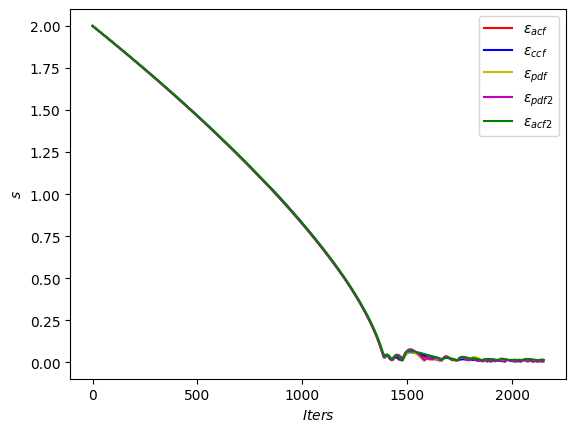

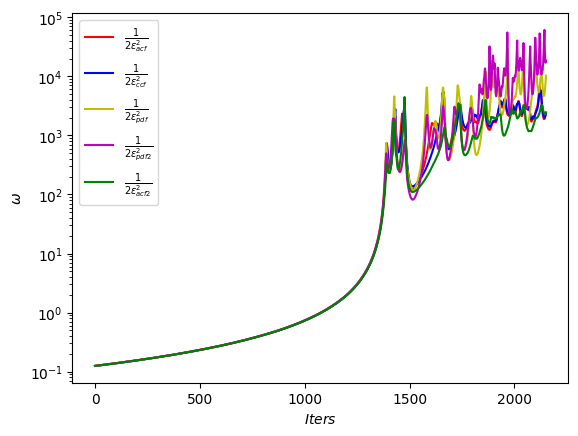

In [112]:
draw_adaptive_w(model7)
draw_epoch_w(model7)

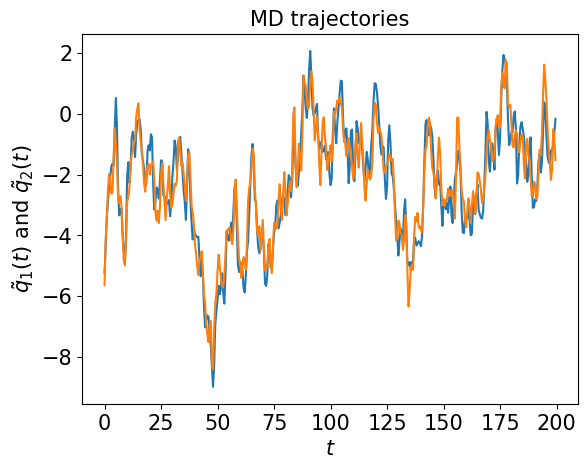

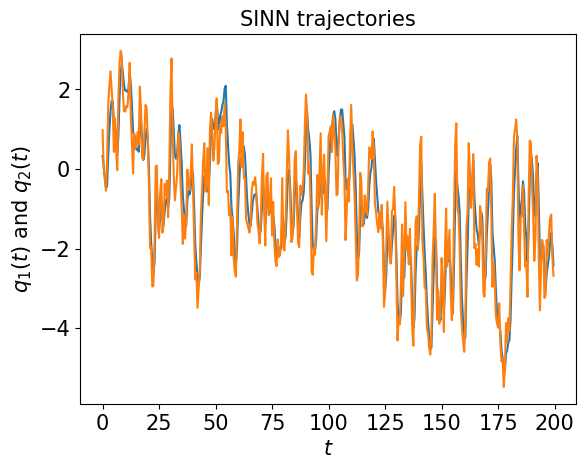

In [113]:
test1(model7)

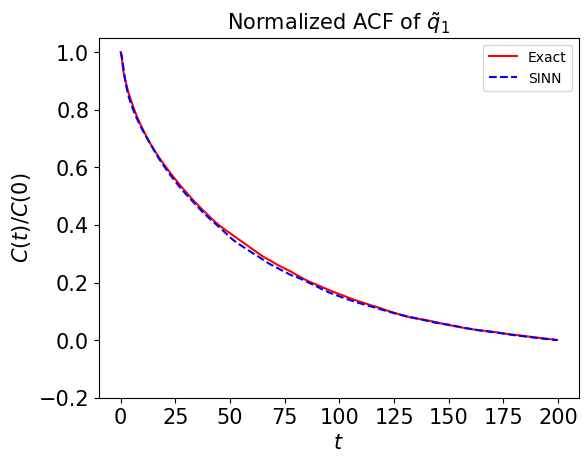

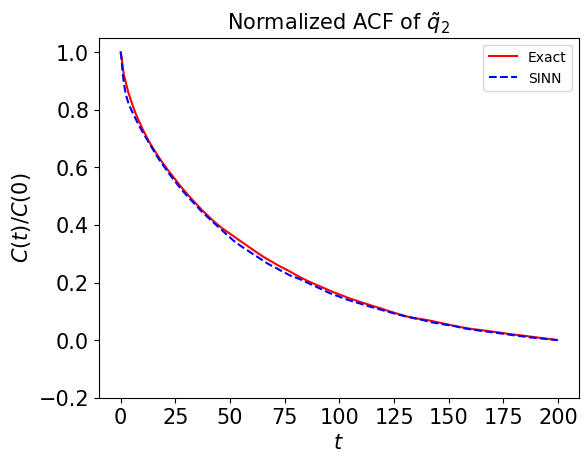

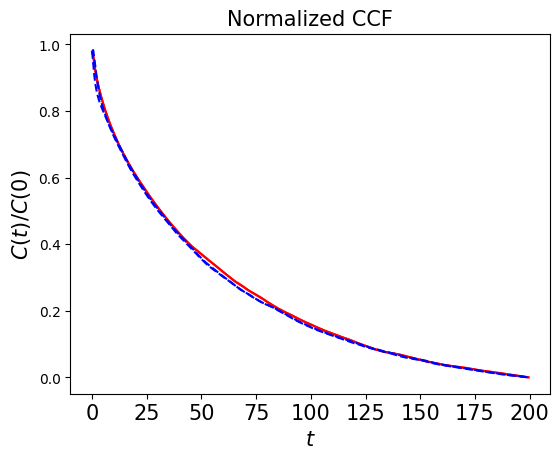

In [114]:
test2(model7)

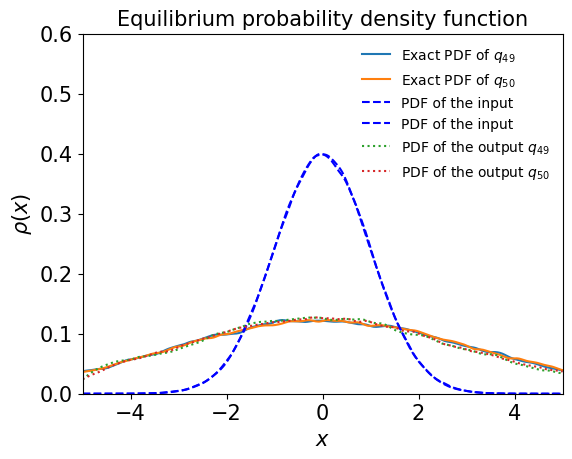

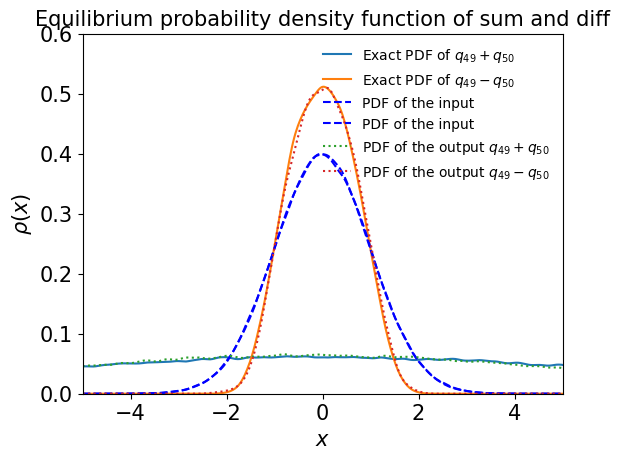

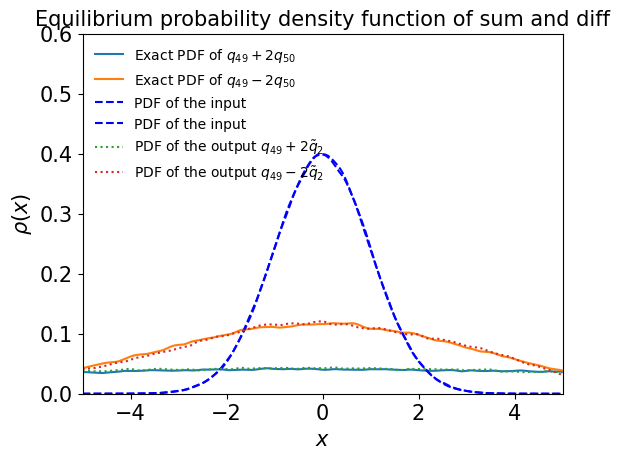

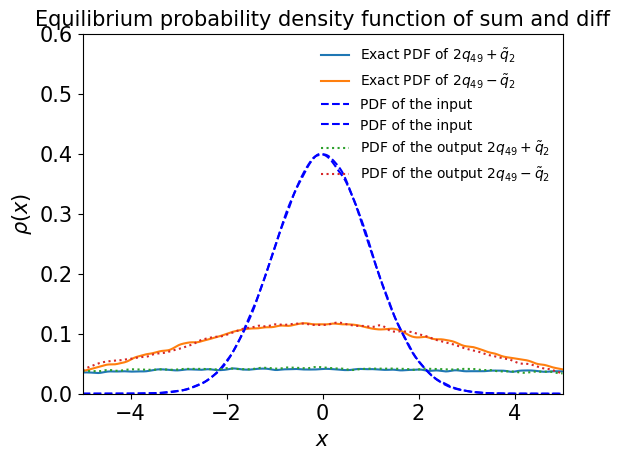

In [115]:
test3(model7)

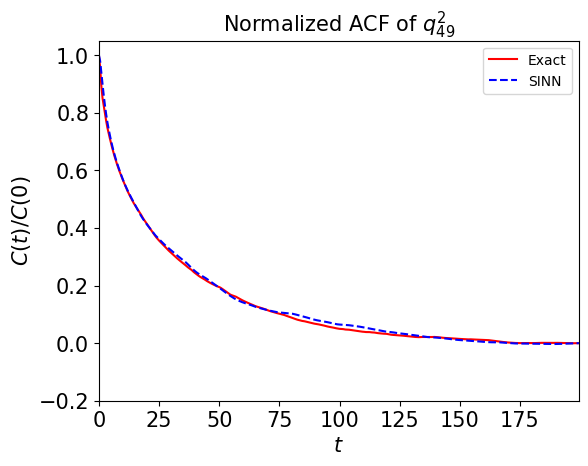

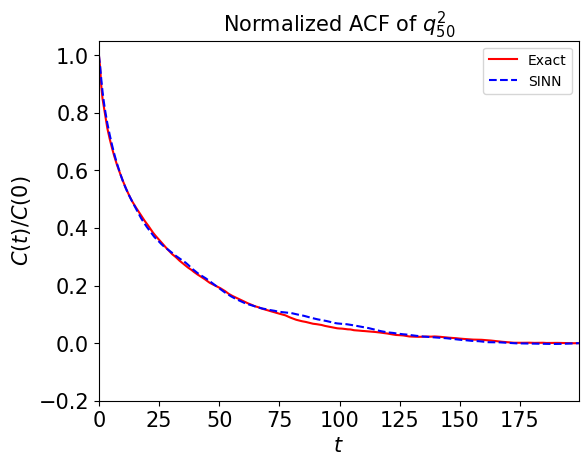

In [116]:
test4(model7)

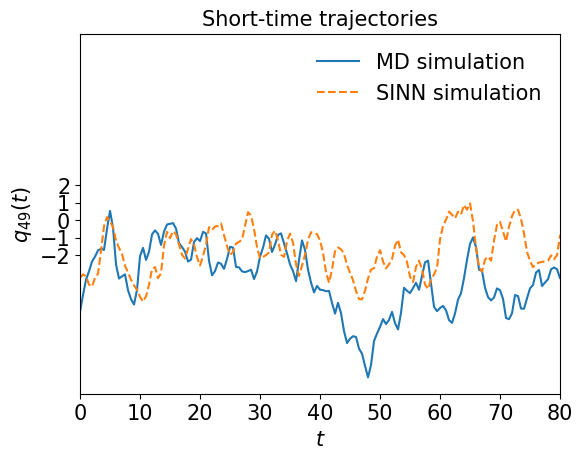

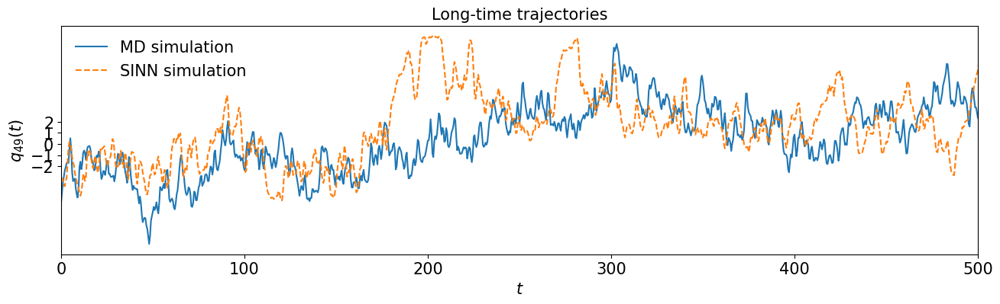

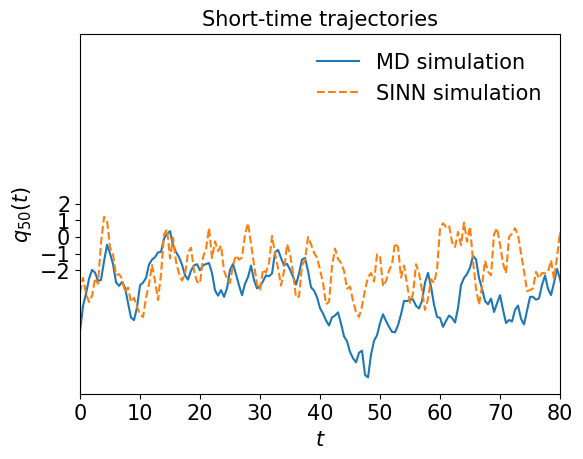

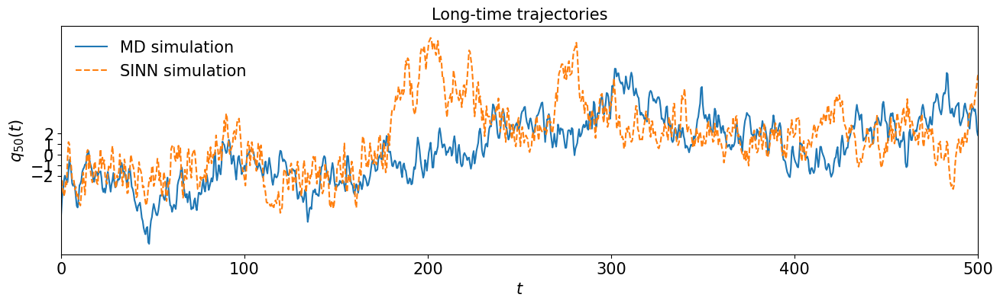

In [117]:
test5(model7)

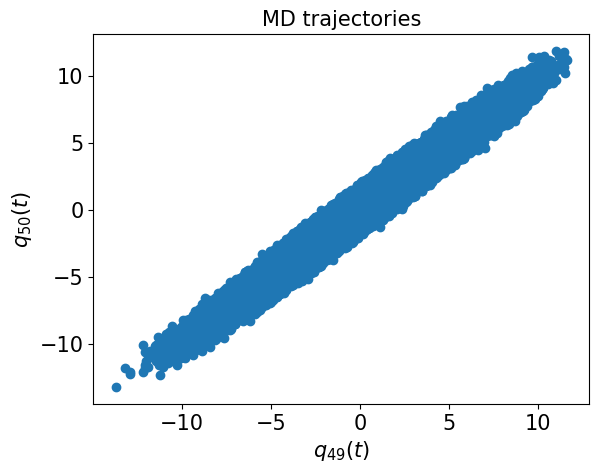

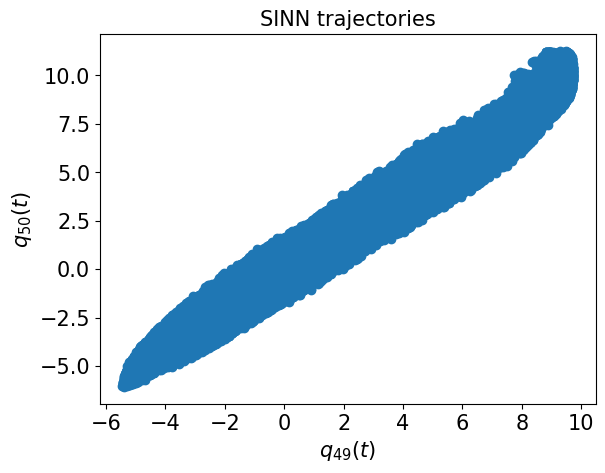

In [118]:
test6(model7)

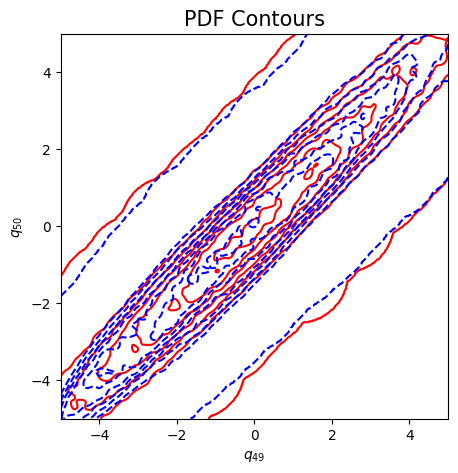

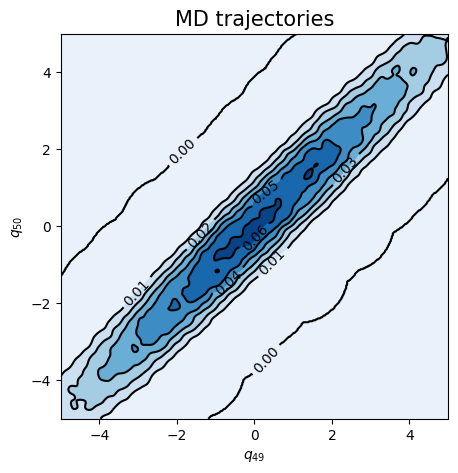

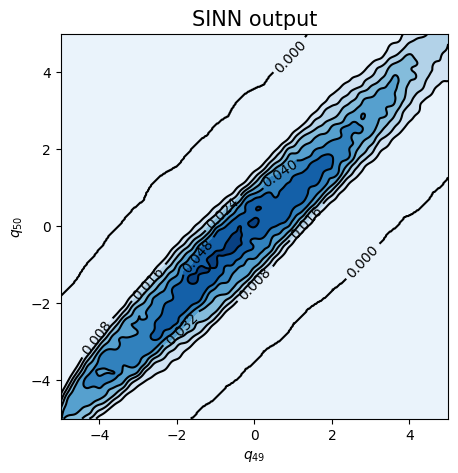

In [119]:
test7(model7)

In [120]:
### Defining SINN model
net8 = SINN(2, 75, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model8 = Model(net=net8)
model8.train()

[0]-th step loss: 0.8337, 0.8245, acf: 0.09981, ccf: 0.09954, pdf: 0.29296, pdf2: 0.28898, acf2: 0.04323
[50]-th step loss: 0.1170, 0.0828, acf: 0.01310, ccf: 0.01318, pdf: 0.03199, pdf2: 0.02158, acf2: 0.00292
[100]-th step loss: 0.0404, 0.0408, acf: 0.00222, ccf: 0.00220, pdf: 0.01517, pdf2: 0.01339, acf2: 0.00785
[150]-th step loss: 0.0093, 0.0097, acf: 0.00113, ccf: 0.00112, pdf: 0.00374, pdf2: 0.00288, acf2: 0.00085
[200]-th step loss: 0.0057, 0.0046, acf: 0.00023, ccf: 0.00029, pdf: 0.00185, pdf2: 0.00149, acf2: 0.00074
[250]-th step loss: 0.0071, 0.0054, acf: 0.00091, ccf: 0.00099, pdf: 0.00161, pdf2: 0.00104, acf2: 0.00088
[300]-th step loss: 0.0065, 0.0040, acf: 0.00072, ccf: 0.00082, pdf: 0.00100, pdf2: 0.00072, acf2: 0.00077
[350]-th step loss: 0.0060, 0.0043, acf: 0.00027, ccf: 0.00034, pdf: 0.00236, pdf2: 0.00069, acf2: 0.00069
[400]-th step loss: 0.0340, 0.0278, acf: 0.00316, ccf: 0.00206, pdf: 0.01228, pdf2: 0.00949, acf2: 0.00081
[450]-th step loss: 0.0457, 0.0657, acf:

[3850]-th step loss: 0.0324, 0.0344, acf: 0.00025, ccf: 0.00025, pdf: 0.00828, pdf2: 0.00828, acf2: 0.01735
[3900]-th step loss: 0.0246, 0.0318, acf: 0.00029, ccf: 0.00029, pdf: 0.00823, pdf2: 0.00376, acf2: 0.01923
[3950]-th step loss: 0.0281, 0.0324, acf: 0.00050, ccf: 0.00050, pdf: 0.00826, pdf2: 0.00381, acf2: 0.01938
[4000]-th step loss: 0.0236, 0.0246, acf: 0.00034, ccf: 0.00033, pdf: 0.00824, pdf2: 0.00378, acf2: 0.01192
[4050]-th step loss: 0.0240, 0.0283, acf: 0.00011, ccf: 0.00011, pdf: 0.00825, pdf2: 0.00361, acf2: 0.01618
[4100]-th step loss: 0.0327, 0.0331, acf: 0.00042, ccf: 0.00043, pdf: 0.00826, pdf2: 0.00363, acf2: 0.02038
[4150]-th step loss: 0.0347, 0.0355, acf: 0.00086, ccf: 0.00087, pdf: 0.00827, pdf2: 0.00375, acf2: 0.02173
[4200]-th step loss: 0.0266, 0.0344, acf: 0.00052, ccf: 0.00052, pdf: 0.00827, pdf2: 0.00443, acf2: 0.02062
[4250]-th step loss: 0.0282, 0.0325, acf: 0.00040, ccf: 0.00040, pdf: 0.00824, pdf2: 0.00371, acf2: 0.01978
[4300]-th step loss: 0.0297,

[7650]-th step loss: 0.0253, 0.0374, acf: 0.00083, ccf: 0.00085, pdf: 0.00828, pdf2: 0.00542, acf2: 0.02204
[7700]-th step loss: 0.0226, 0.0228, acf: 0.00028, ccf: 0.00028, pdf: 0.00828, pdf2: 0.00379, acf2: 0.01019
[7750]-th step loss: 0.0253, 0.0296, acf: 0.00019, ccf: 0.00019, pdf: 0.00829, pdf2: 0.00369, acf2: 0.01723
[7800]-th step loss: 0.0256, 0.0284, acf: 0.00020, ccf: 0.00021, pdf: 0.00829, pdf2: 0.00383, acf2: 0.01592
[7850]-th step loss: 0.0282, 0.0329, acf: 0.00037, ccf: 0.00038, pdf: 0.00829, pdf2: 0.00579, acf2: 0.01806
[7900]-th step loss: 0.0263, 0.0276, acf: 0.00009, ccf: 0.00009, pdf: 0.00828, pdf2: 0.00368, acf2: 0.01543
[7950]-th step loss: 0.0263, 0.0269, acf: 0.00012, ccf: 0.00012, pdf: 0.00828, pdf2: 0.00400, acf2: 0.01442
[8000]-th step loss: 0.0277, 0.0304, acf: 0.00024, ccf: 0.00025, pdf: 0.00827, pdf2: 0.00406, acf2: 0.01761
[8050]-th step loss: 0.0221, 0.0266, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.00406, acf2: 0.01414
[8100]-th step loss: 0.0256,

[11450]-th step loss: 0.0271, 0.0330, acf: 0.00066, ccf: 0.00067, pdf: 0.00819, pdf2: 0.00363, acf2: 0.01985
[11500]-th step loss: 0.0253, 0.0299, acf: 0.00033, ccf: 0.00033, pdf: 0.00824, pdf2: 0.00394, acf2: 0.01705
[11550]-th step loss: 0.0287, 0.0310, acf: 0.00026, ccf: 0.00026, pdf: 0.00824, pdf2: 0.00507, acf2: 0.01718
[11600]-th step loss: 0.0232, 0.0318, acf: 0.00046, ccf: 0.00047, pdf: 0.00817, pdf2: 0.00391, acf2: 0.01879
[11650]-th step loss: 0.0258, 0.0318, acf: 0.00038, ccf: 0.00038, pdf: 0.00822, pdf2: 0.00465, acf2: 0.01819
[11700]-th step loss: 0.0295, 0.0313, acf: 0.00042, ccf: 0.00043, pdf: 0.00822, pdf2: 0.00410, acf2: 0.01817
[11750]-th step loss: 0.0286, 0.0314, acf: 0.00032, ccf: 0.00033, pdf: 0.00821, pdf2: 0.00380, acf2: 0.01877
[11800]-th step loss: 0.0281, 0.0327, acf: 0.00054, ccf: 0.00054, pdf: 0.00831, pdf2: 0.00368, acf2: 0.01963
[11850]-th step loss: 0.0267, 0.0354, acf: 0.00088, ccf: 0.00089, pdf: 0.00819, pdf2: 0.00360, acf2: 0.02186
[11900]-th step los

[15250]-th step loss: 0.0255, 0.0295, acf: 0.00043, ccf: 0.00043, pdf: 0.00833, pdf2: 0.00357, acf2: 0.01676
[15300]-th step loss: 0.0263, 0.0293, acf: 0.00035, ccf: 0.00035, pdf: 0.00819, pdf2: 0.00377, acf2: 0.01663
[15350]-th step loss: 0.0245, 0.0303, acf: 0.00056, ccf: 0.00057, pdf: 0.00802, pdf2: 0.00358, acf2: 0.01754
[15400]-th step loss: 0.0292, 0.0365, acf: 0.00141, ccf: 0.00141, pdf: 0.00847, pdf2: 0.00358, acf2: 0.02158
[15450]-th step loss: 0.0251, 0.0298, acf: 0.00051, ccf: 0.00050, pdf: 0.00790, pdf2: 0.00359, acf2: 0.01735
[15500]-th step loss: 0.0230, 0.0288, acf: 0.00036, ccf: 0.00035, pdf: 0.00821, pdf2: 0.00361, acf2: 0.01623
[15550]-th step loss: 0.0228, 0.0285, acf: 0.00041, ccf: 0.00042, pdf: 0.00848, pdf2: 0.00364, acf2: 0.01551
[15600]-th step loss: 0.0212, 0.0272, acf: 0.00031, ccf: 0.00030, pdf: 0.00853, pdf2: 0.00364, acf2: 0.01447
[15650]-th step loss: 0.0201, 0.0220, acf: 0.00011, ccf: 0.00011, pdf: 0.00816, pdf2: 0.00530, acf2: 0.00834
[15700]-th step los

[19050]-th step loss: 0.0643, 0.0722, acf: 0.00070, ccf: 0.00069, pdf: 0.00829, pdf2: 0.04415, acf2: 0.01836
[19100]-th step loss: 0.0636, 0.0644, acf: 0.00049, ccf: 0.00047, pdf: 0.00829, pdf2: 0.04222, acf2: 0.01295
[19150]-th step loss: 0.0568, 0.0603, acf: 0.00117, ccf: 0.00115, pdf: 0.00829, pdf2: 0.03768, acf2: 0.01203
[19200]-th step loss: 0.0346, 0.0411, acf: 0.00054, ccf: 0.00049, pdf: 0.00829, pdf2: 0.02053, acf2: 0.01127
[19250]-th step loss: 0.0288, 0.0329, acf: 0.00011, ccf: 0.00010, pdf: 0.00829, pdf2: 0.01016, acf2: 0.01421
[19300]-th step loss: 0.0298, 0.0336, acf: 0.00064, ccf: 0.00062, pdf: 0.00829, pdf2: 0.01024, acf2: 0.01384
[19350]-th step loss: 0.0294, 0.0336, acf: 0.00029, ccf: 0.00029, pdf: 0.00829, pdf2: 0.01013, acf2: 0.01463
[19400]-th step loss: 0.0298, 0.0331, acf: 0.00038, ccf: 0.00037, pdf: 0.00829, pdf2: 0.01013, acf2: 0.01395
[19450]-th step loss: 0.0306, 0.0351, acf: 0.00022, ccf: 0.00021, pdf: 0.00829, pdf2: 0.01013, acf2: 0.01625
[19500]-th step los

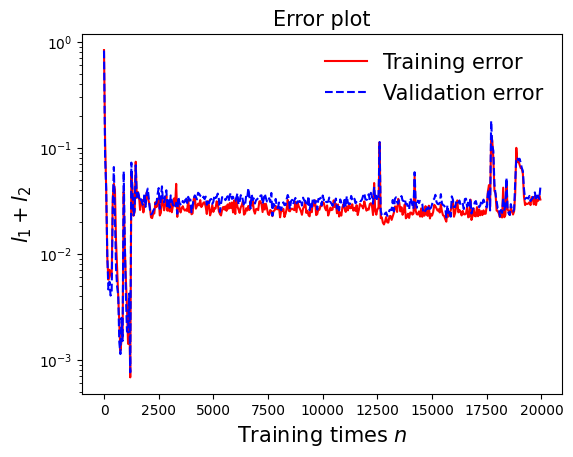

In [121]:
draw_loss(model8)

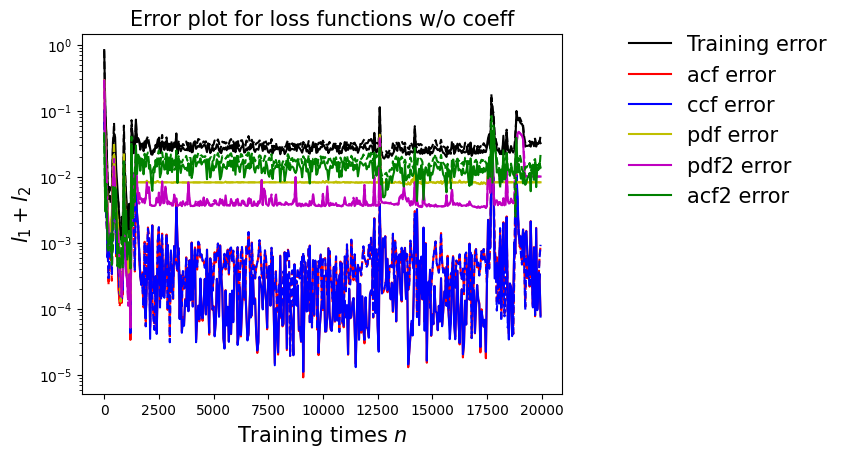

In [122]:
draw_errors(model8)

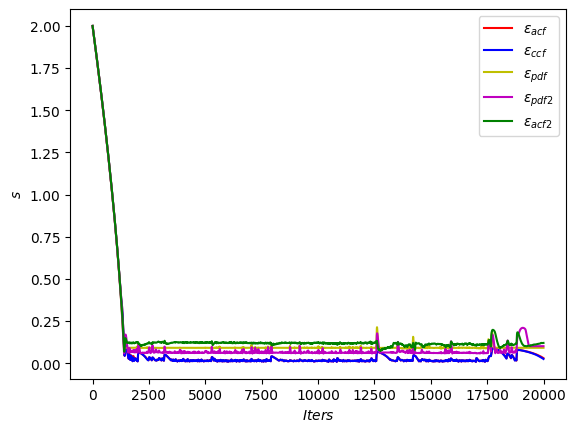

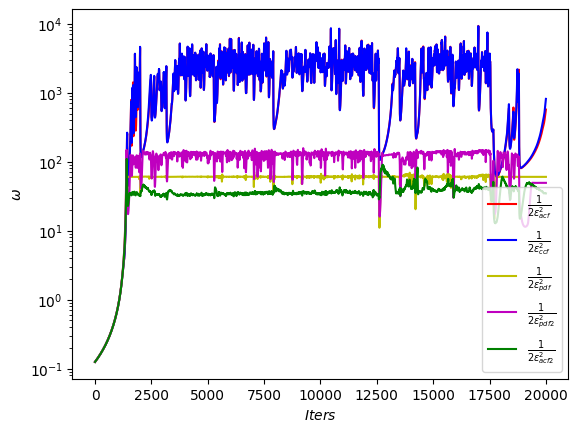

In [123]:
draw_adaptive_w(model8)
draw_epoch_w(model8)

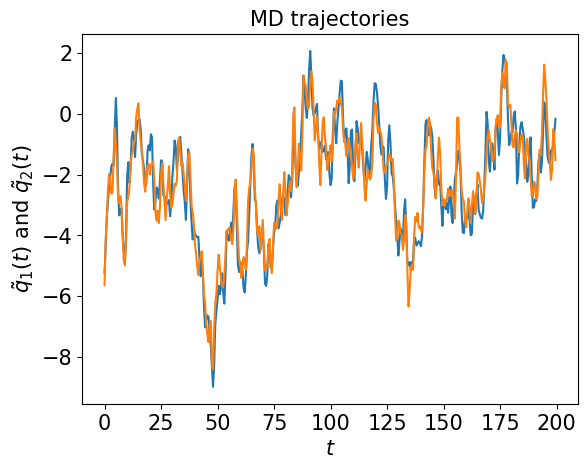

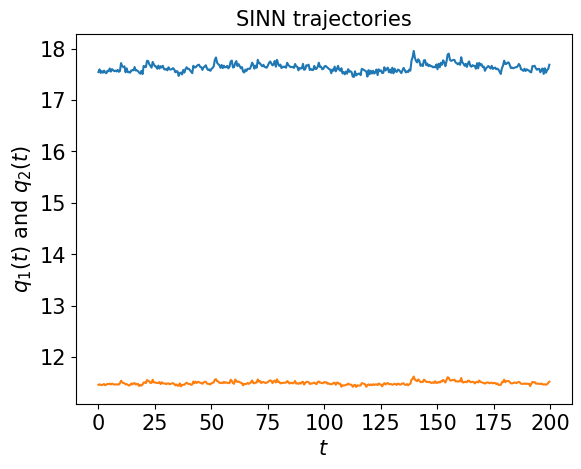

In [124]:
test1(model8)

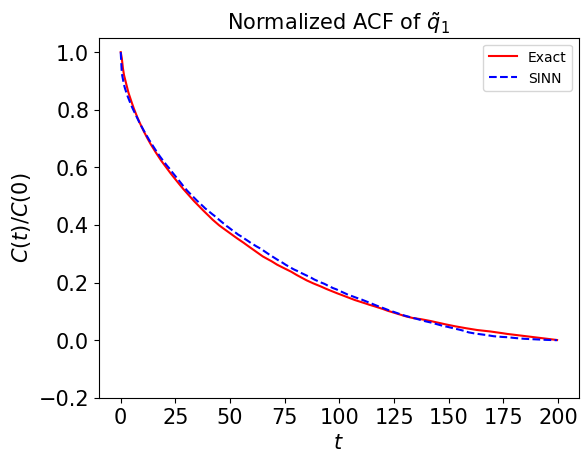

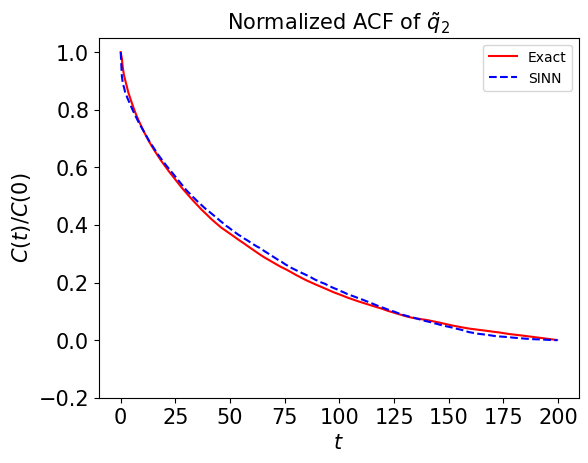

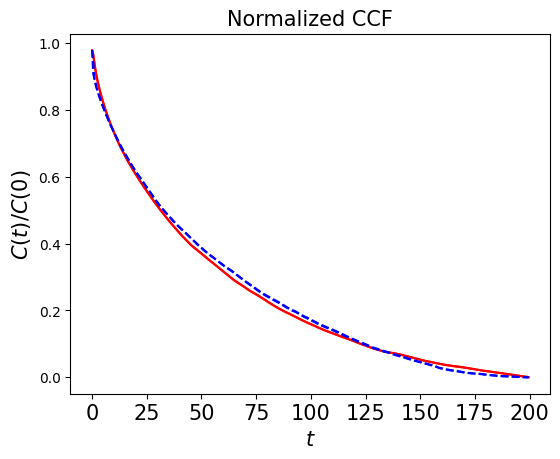

In [125]:
test2(model8)

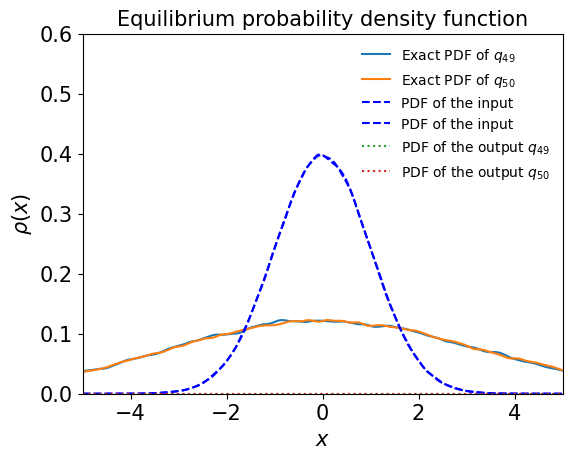

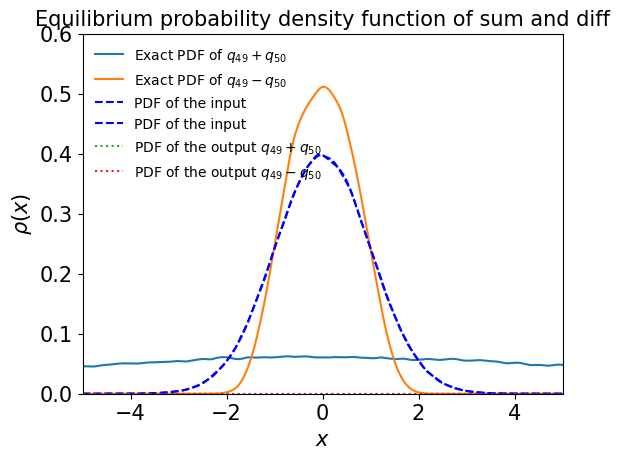

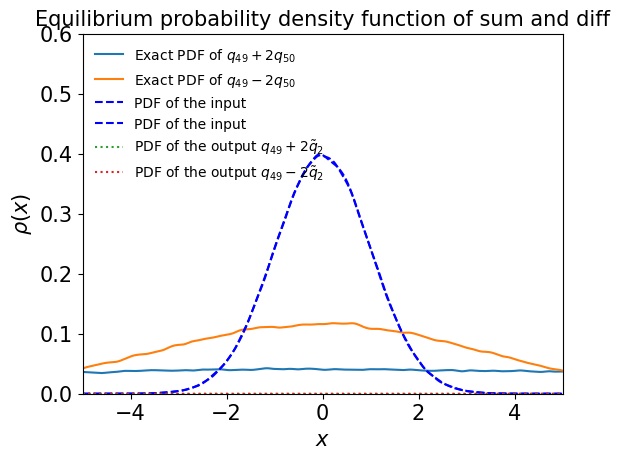

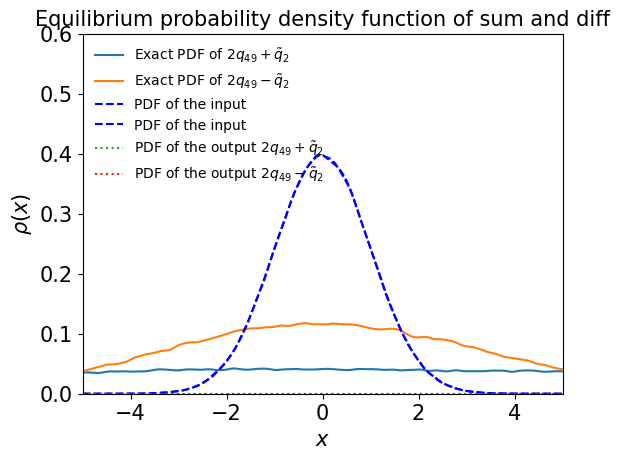

In [126]:
test3(model8)

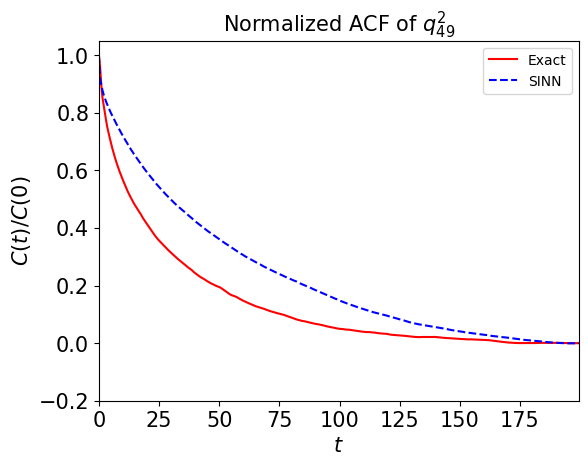

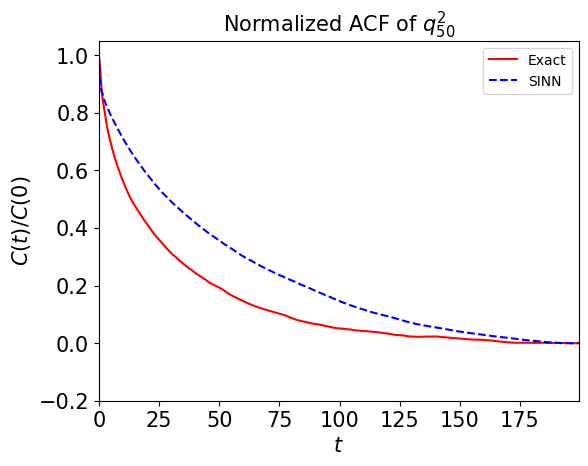

In [127]:
test4(model8)

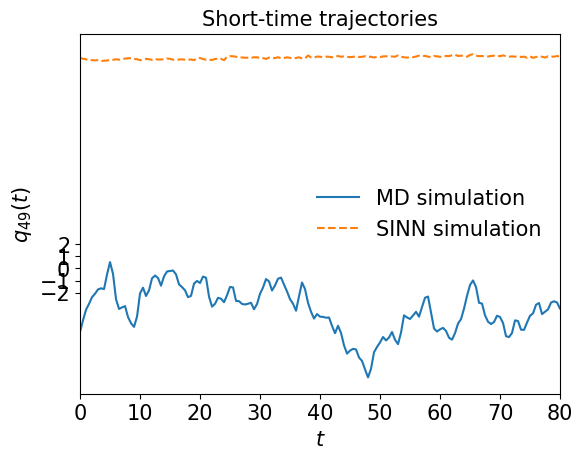

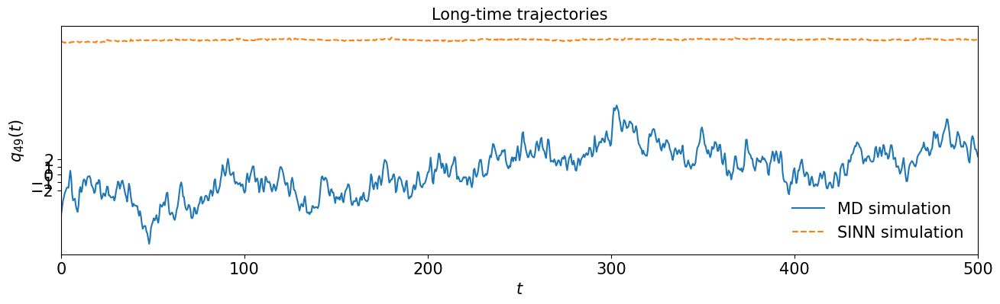

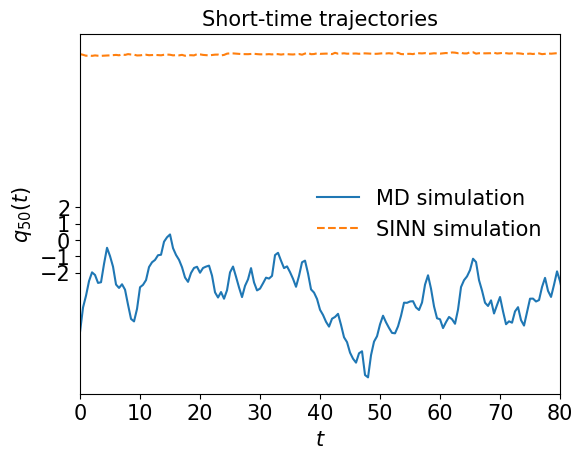

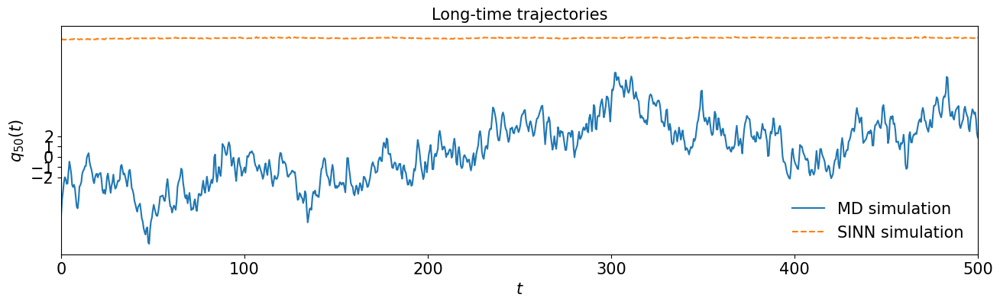

In [128]:
test5(model8)

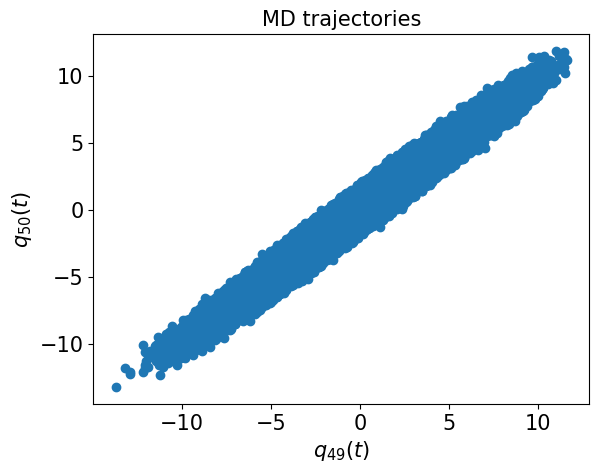

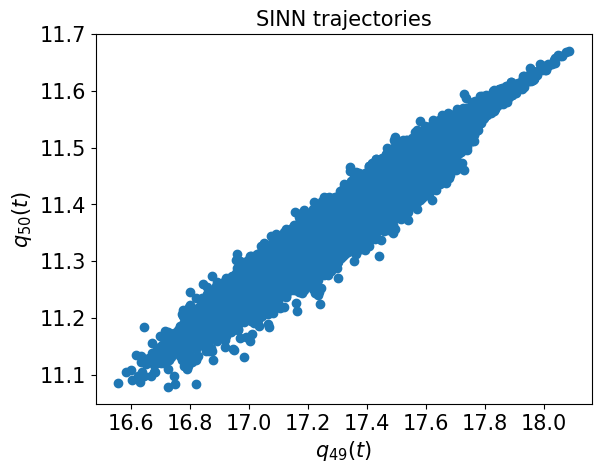

In [129]:
test6(model8)

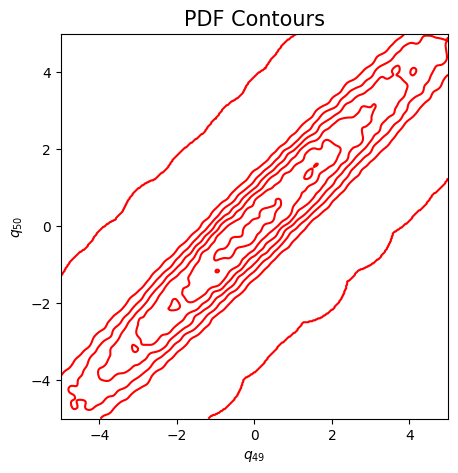

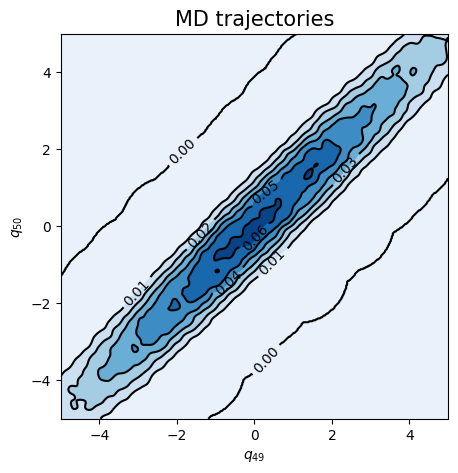

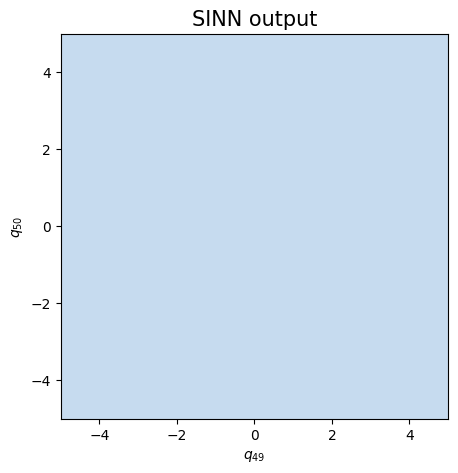

In [130]:
test7(model8)

In [131]:
### Defining SINN model
net9 = SINN(2, 75, 2, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model9 = Model(net=net9)
model9.train()

[0]-th step loss: 0.8595, 0.8222, acf: 0.09857, ccf: 0.09876, pdf: 0.29311, pdf2: 0.28967, acf2: 0.04210
[50]-th step loss: 0.0536, 0.0534, acf: 0.00939, ccf: 0.00938, pdf: 0.01770, pdf2: 0.01486, acf2: 0.00209
[100]-th step loss: 0.1060, 0.0838, acf: 0.03009, ccf: 0.03003, pdf: 0.00868, pdf2: 0.00797, acf2: 0.00701
[150]-th step loss: 0.0133, 0.0120, acf: 0.00214, ccf: 0.00215, pdf: 0.00394, pdf2: 0.00303, acf2: 0.00078
[200]-th step loss: 0.0064, 0.0079, acf: 0.00150, ccf: 0.00153, pdf: 0.00181, pdf2: 0.00173, acf2: 0.00134
[250]-th step loss: 0.0063, 0.0081, acf: 0.00200, ccf: 0.00200, pdf: 0.00060, pdf2: 0.00099, acf2: 0.00252
[300]-th step loss: 0.0038, 0.0034, acf: 0.00068, ccf: 0.00071, pdf: 0.00059, pdf2: 0.00083, acf2: 0.00056
[350]-th step loss: 0.0063, 0.0044, acf: 0.00055, ccf: 0.00057, pdf: 0.00062, pdf2: 0.00127, acf2: 0.00139
[400]-th step loss: 0.0025, 0.0022, acf: 0.00042, ccf: 0.00042, pdf: 0.00024, pdf2: 0.00059, acf2: 0.00057
[450]-th step loss: 0.0024, 0.0036, acf:

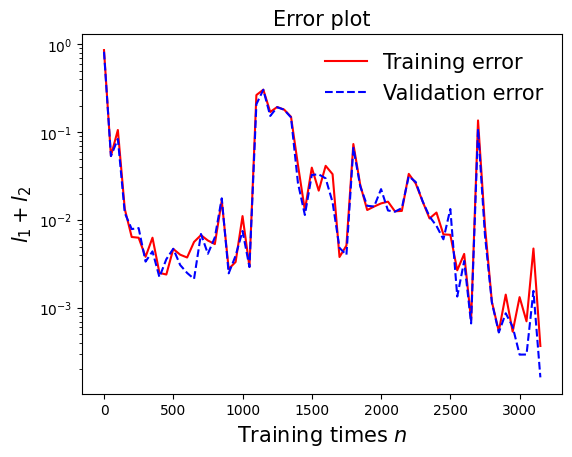

In [132]:
draw_loss(model9)

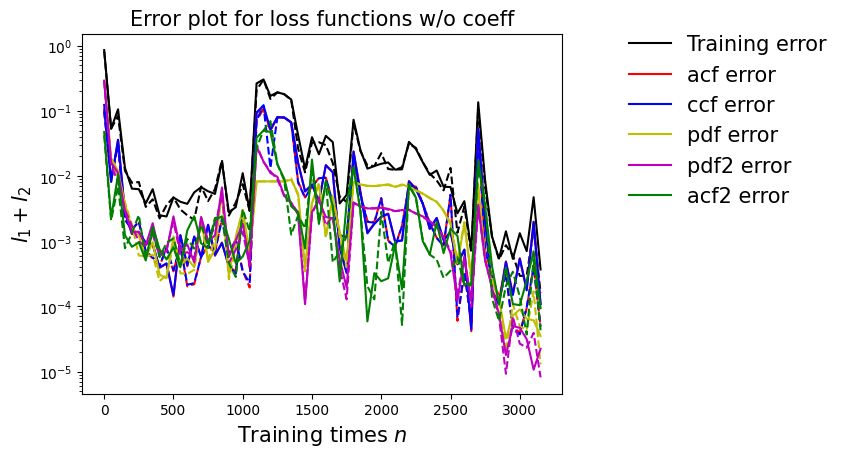

In [133]:
draw_errors(model9)

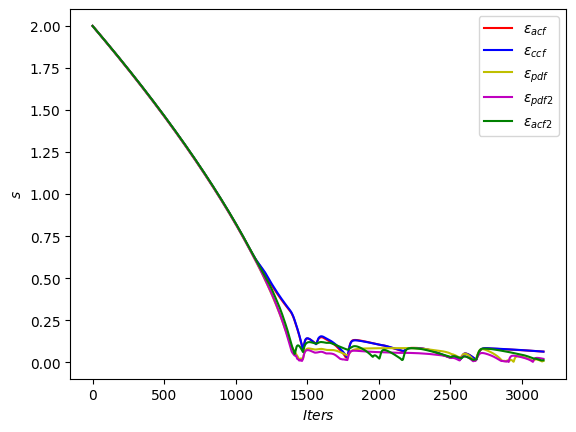

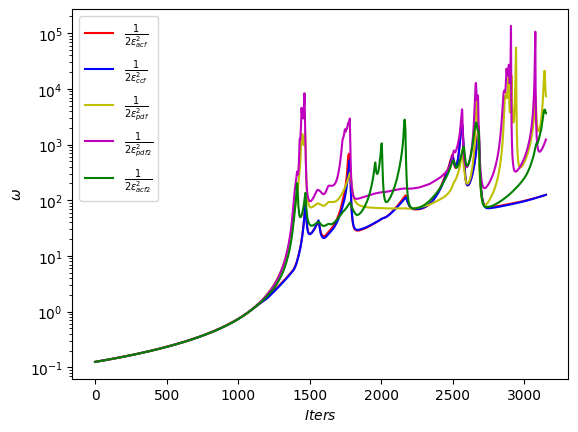

In [134]:
draw_adaptive_w(model9)
draw_epoch_w(model9)

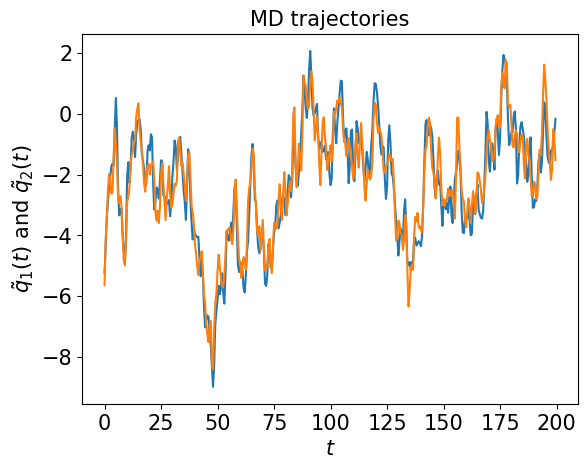

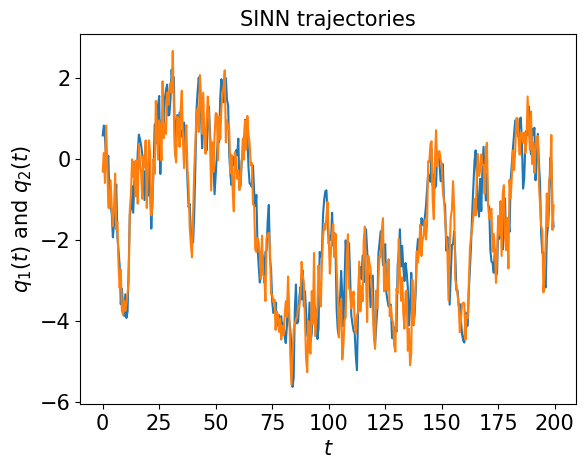

In [135]:
test1(model9)

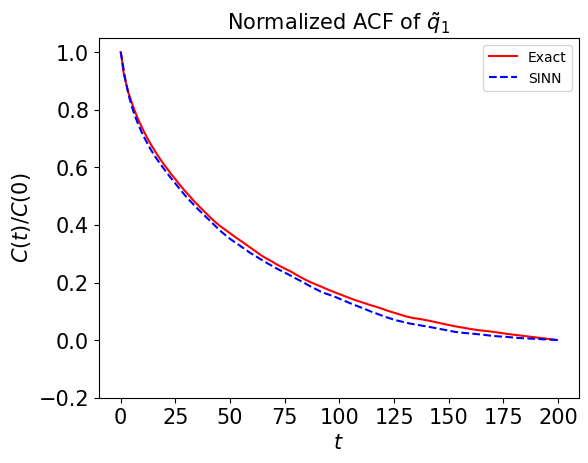

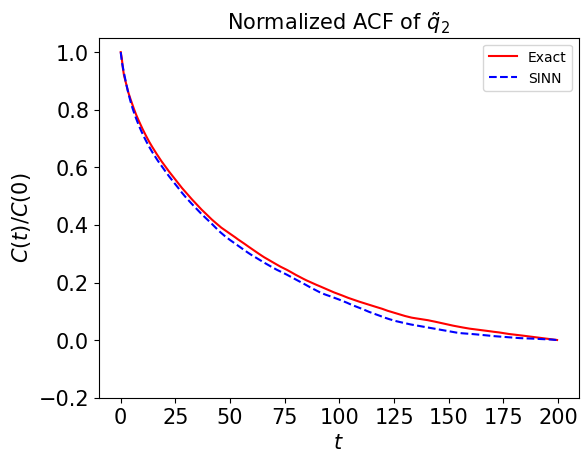

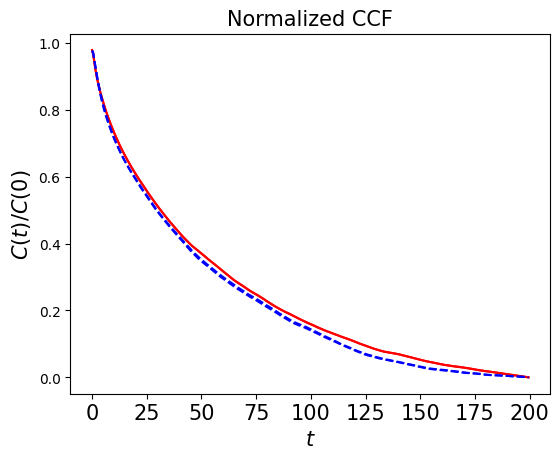

In [136]:
test2(model9)

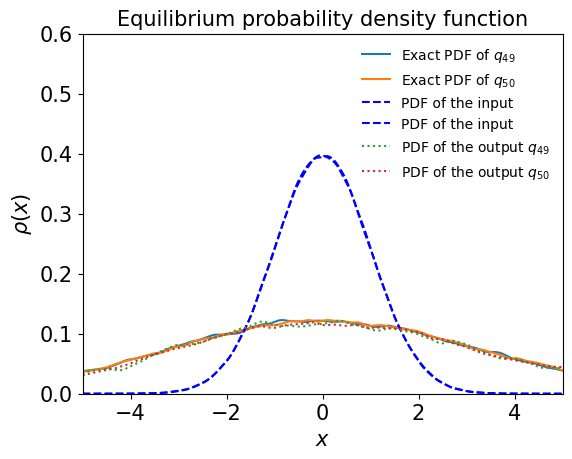

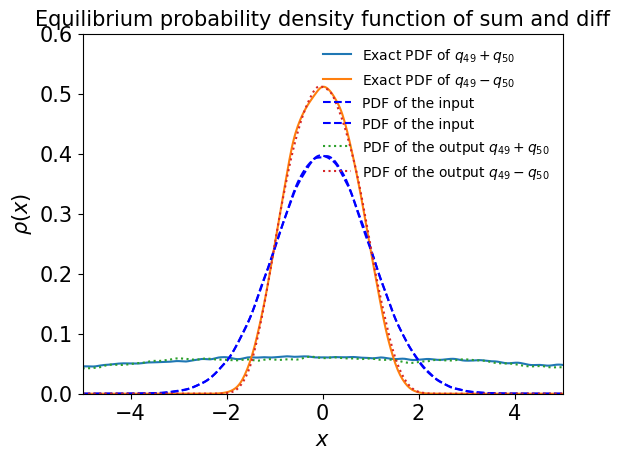

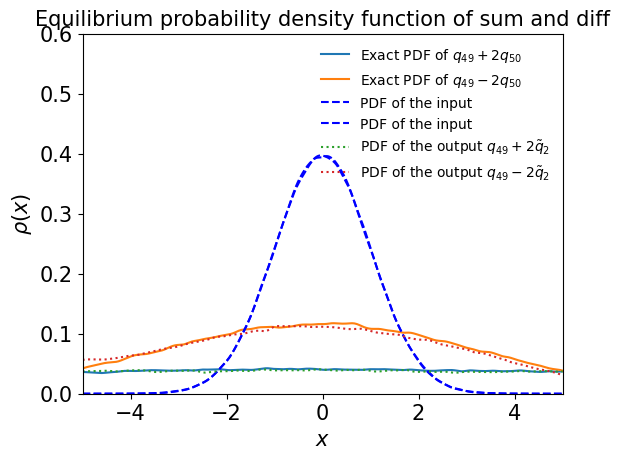

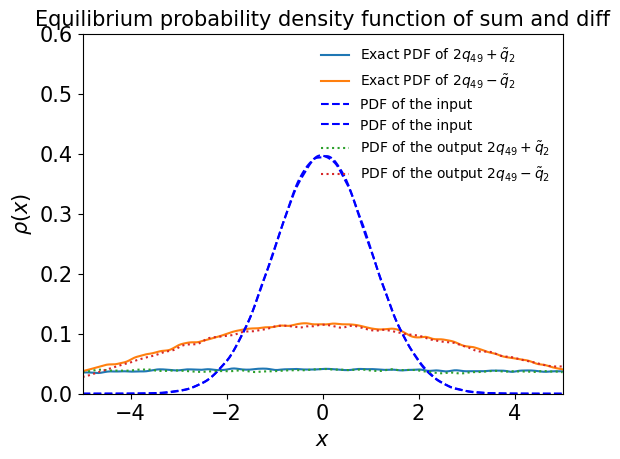

In [137]:
test3(model9)

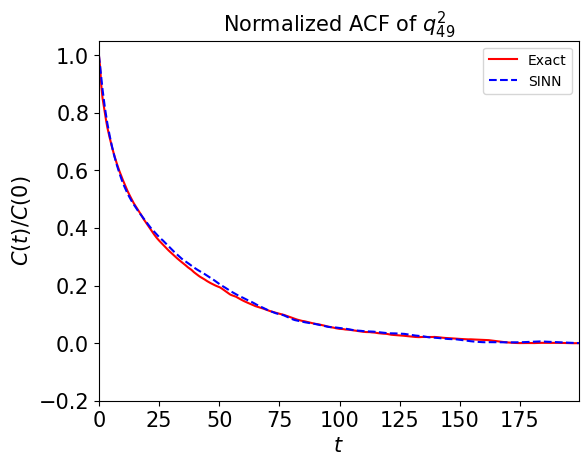

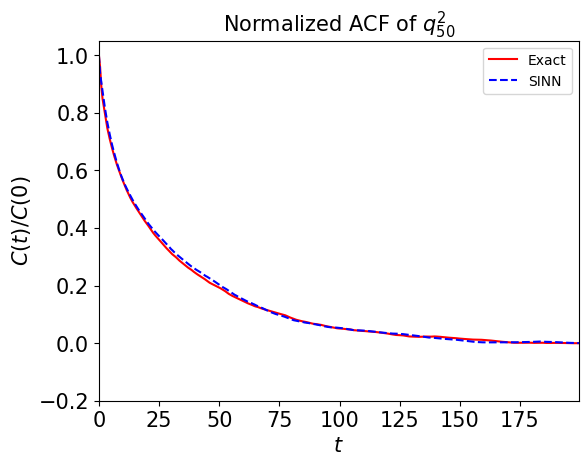

In [138]:
test4(model9)

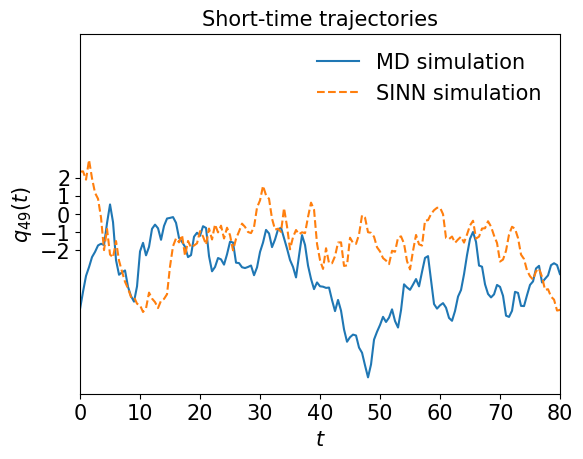

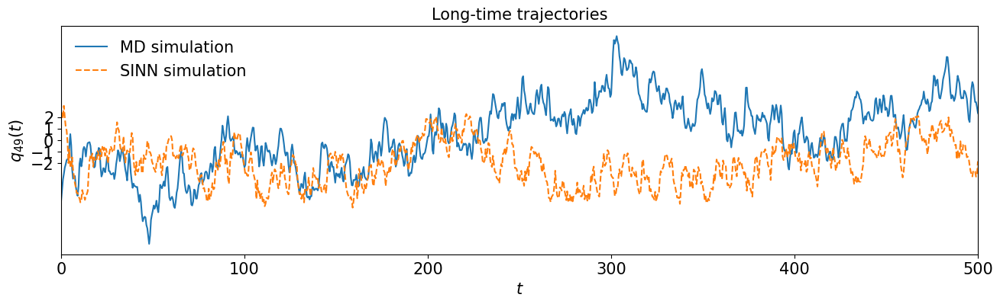

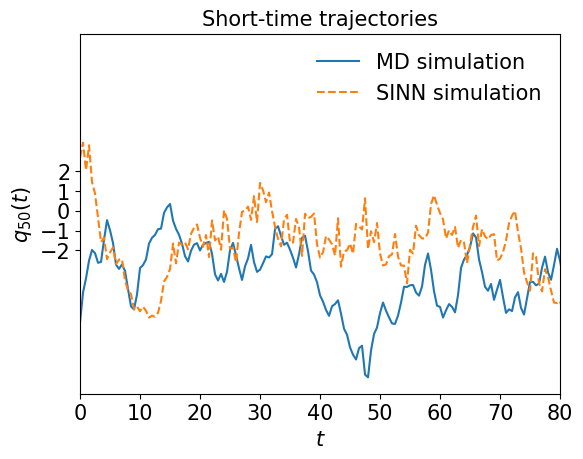

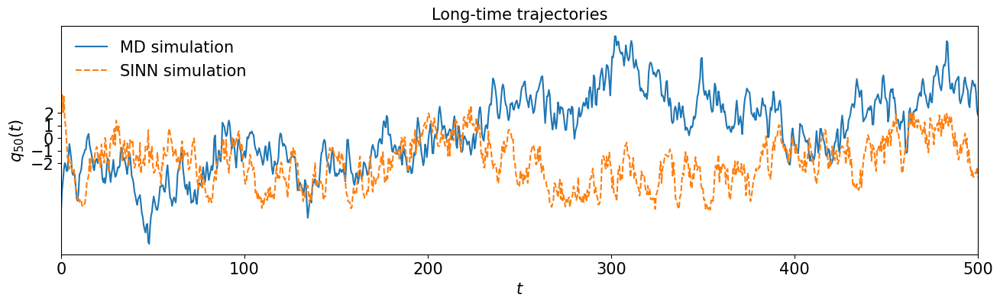

In [139]:
test5(model9)

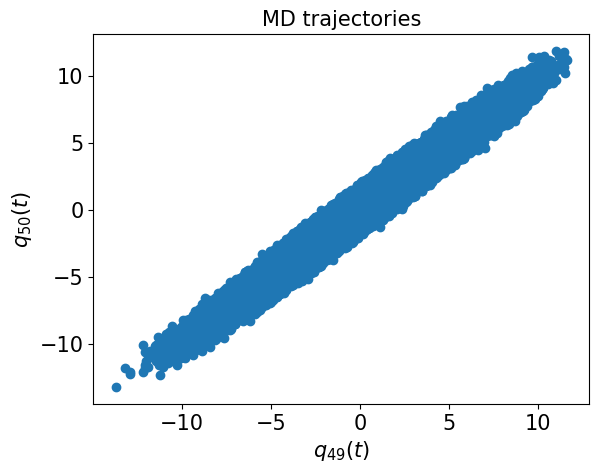

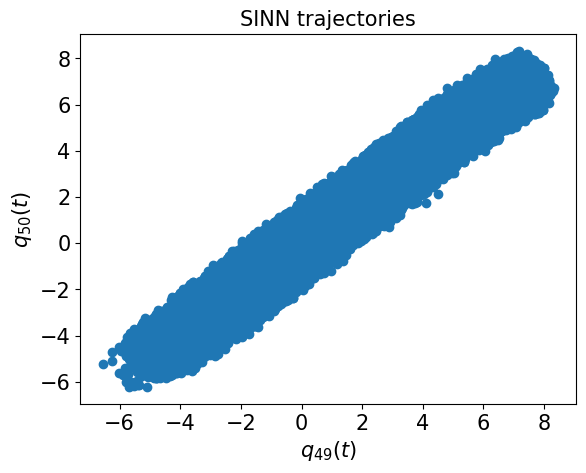

In [140]:
test6(model9)

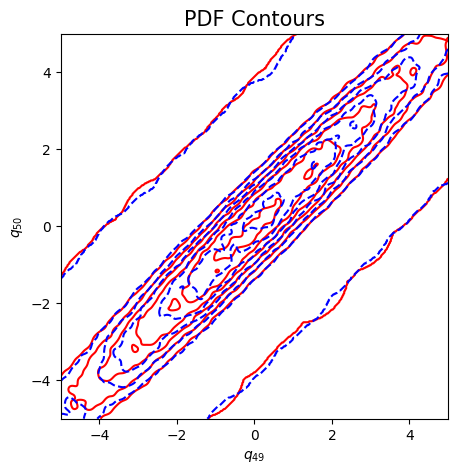

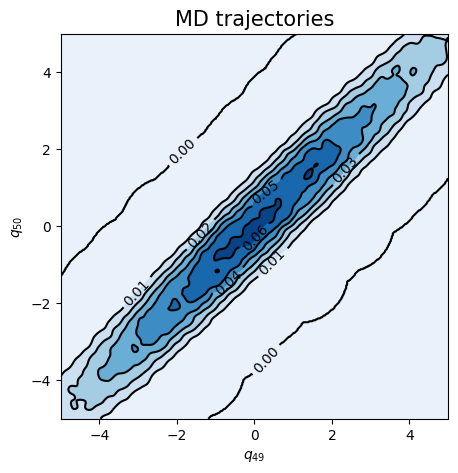

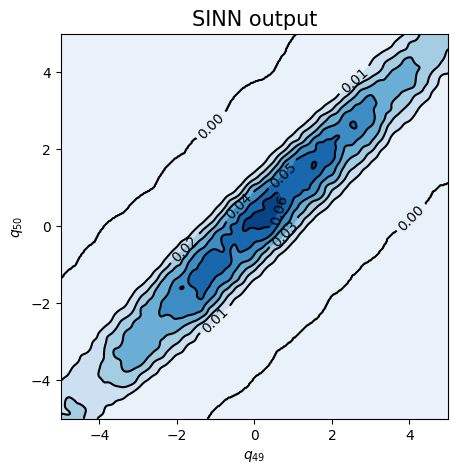

In [141]:
test7(model9)